In [1]:
from imblearn.metrics import geometric_mean_score
import numpy as np
import keras
from keras import backend as K
from keras.models import Sequential
from keras.layers import Dense,Dropout,BatchNormalization,LeakyReLU
from keras import optimizers,regularizers
from keras.callbacks import ReduceLROnPlateau,EarlyStopping
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from imblearn.over_sampling import SMOTE, ADASYN
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from sklearn import metrics
import time
from datetime import datetime, timedelta
np.random.seed(13)
from sklearn import svm
import pandas as pd
import matplotlib.pyplot as plt
import math
from __future__ import division
from sklearn.model_selection import KFold
from sklearn.preprocessing import normalize

#files=['AAPL','AMZN','PEP','GOOGL','MSFT','FB','INTC','CSCO','CMCSA','NVDA','NFLX','BKNG','ADBE','AMGN','TXN','AVGO','PYPL','GILD','COST','QCOM']       
files=['AAPL','AMZN','GOOGL','MSFT','FB','INTC','CSCO','CMCSA','NVDA','NFLX','ADBE','AMGN','TXN','AVGO','PYPL','GILD','COST','QCOM']       
     
prices=list()
sentiment=list()
for file in files:
    param = {
        'q': file, # Stock symbol (ex: "AAPL")
        'i': "900", # Interval size in seconds ("86400" = 1 day intervals)
        'x': "NASD", # INDEXNASDAQStock exchange symbol on which stock is traded (ex: "NASD")
        'p': "2Y" # Period (Ex: "1Y" = 1 year)
        }
    #sentimentVector =  pd.read_csv('/home/andrea/Desktop/NLFF/intrinioDatasetUpdated/Sentiment/'+file+'.csv')
    #price= pd.read_csv('/home/andrea/Desktop/NLFF/TechnicalDatasetUpdated/'+file+'.csv')
    sentimentVector =  pd.read_csv('/home/andrea/Desktop/NLFF/intrinioDataset/SentimentFul/'+file+'.csv')
    price= pd.read_csv('/home/andrea/Desktop/NLFF/TechnicalDataset/indexes'+file+'.csv')
    #alignment of data
    maxdata=max(sentimentVector['initTime'])
    mindata=min(sentimentVector['initTime'])
    price['Unnamed: 0'] = [datetime.strptime(row, '%Y-%m-%d %H:%M:%S') for row in price['Unnamed: 0']]
    price['Unnamed: 0'] = [row-timedelta(hours=8) for row in price['Unnamed: 0']]
    price=price[price['Unnamed: 0']>=mindata]
    price=price[price['Unnamed: 0']<=maxdata]
    print(sentimentVector[0:10])
    print(price[0:10])
    sentimentVector=sentimentVector.drop(['Unnamed: 0', 'initTime' ], axis=1)
    meanvector=np.concatenate((sentimentVector,sentimentVector.rolling(5).mean()),axis=1)
    meanvector=np.concatenate((meanvector,sentimentVector.rolling(10).mean()),axis=1)
    meanvector=np.concatenate((meanvector,sentimentVector.rolling(15).mean()),axis=1)
    meanvector=np.concatenate((meanvector,sentimentVector.rolling(20).mean()),axis=1)
    price=price.drop(['Unnamed: 0'],axis=1)
    #['macd','macds', 'boll_ub', 'boll_lb','rsi_6','rsi_12','vr_6_sma','wr_10','wr_6''close_10_sma''tr''middle_{}_sma'
    #df['dma'] = df['close_10_sma'] - df['close_50_sma'] pdi'] = cls._get_pdi(df, 14)df['mdi'] = cls._get_mdi(df, 14)
    #df['dx'] = cls._get_dx(df, 14) df['adx'] = df['dx_6_ema'] df['adxr'] = df['adx_6_ema']]
    #
    sentiment.append(meanvector)
    prices.append(price)

/home/andrea/.conda/envs/py36/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


   Unnamed: 0             initTime  CONSTRAINING  LITIGIOUS  NEGATIVE  \
0           1  2017-07-03 13:30:00           0.0       0.00      0.00   
1           2  2017-07-03 13:45:00           0.0       0.25      0.75   
2           3  2017-07-03 14:00:00           0.0       0.25      2.75   
3           4  2017-07-03 14:15:00           0.0       0.25      4.75   
4           5  2017-07-03 14:30:00           0.0       0.25      4.75   
5           6  2017-07-03 14:45:00           0.0       1.25      5.75   
6           7  2017-07-03 15:00:00           0.0       1.25      5.75   
7           8  2017-07-03 15:15:00           0.0       1.25      5.75   
8           9  2017-07-03 15:30:00           0.0       2.25      9.75   
9          10  2017-07-03 15:45:00           0.0       3.25      9.75   

   POSITIVE  UNCERTAINTY  SUPERFLUOUS  INTERESTING  NUM_NEWS  
0       0.0          0.0          0.0          0.0         0  
1       0.0          0.5          0.0          0.0         4  
2      

   Unnamed: 0             initTime  CONSTRAINING  LITIGIOUS   NEGATIVE  \
0           1  2017-07-03 13:30:00           0.0   0.000000   0.000000   
1           2  2017-07-03 13:45:00           0.0   2.000000   2.000000   
2           3  2017-07-03 14:00:00           0.0   0.666667   2.333333   
3           4  2017-07-03 14:15:00           0.0   0.333333   2.166667   
4           5  2017-07-03 14:30:00           0.0   0.333333   2.166667   
5           6  2017-07-03 14:45:00           0.0   0.333333   2.166667   
6           7  2017-07-03 15:00:00           0.0   0.333333   4.166667   
7           8  2017-07-03 15:15:00           0.0   0.333333   6.166667   
8           9  2017-07-03 15:30:00           0.0   0.333333   6.166667   
9          10  2017-07-03 15:45:00           1.0   0.333333  11.166667   

   POSITIVE  UNCERTAINTY  SUPERFLUOUS  INTERESTING  NUM_NEWS  
0       0.0     0.000000     0.000000          0.0         0  
1       0.0     0.000000     0.000000          0.0         

   Unnamed: 0             initTime  CONSTRAINING  LITIGIOUS  NEGATIVE  \
0           1  2017-07-03 13:30:00           0.0      0.000      0.00   
1           2  2017-07-03 13:45:00           0.0      0.500      1.00   
2           3  2017-07-03 14:00:00           0.0      0.500      1.00   
3           4  2017-07-03 14:15:00           0.0      0.250      1.50   
4           5  2017-07-03 14:30:00           0.0      1.250      2.50   
5           6  2017-07-03 14:45:00           0.0      1.250      3.50   
6           7  2017-07-03 15:00:00           0.0      4.250     11.50   
7           8  2017-07-03 15:15:00           0.0      4.250     11.50   
8           9  2017-07-03 15:30:00           0.0      2.125      5.75   
9          10  2017-07-03 15:45:00           0.0      3.125      5.75   

   POSITIVE  UNCERTAINTY  SUPERFLUOUS  INTERESTING  NUM_NEWS  
0       0.0        0.000          0.0          0.0         0  
1       0.0        0.500          0.0          0.0         2  
2      

   Unnamed: 0             initTime  CONSTRAINING  LITIGIOUS  NEGATIVE  \
0           1  2017-07-03 13:30:00           0.0        0.0       0.0   
1           2  2017-07-03 13:45:00           0.0        0.0       0.0   
2           3  2017-07-03 14:00:00           0.0        0.0       0.0   
3           4  2017-07-03 14:15:00           0.0        0.0       0.0   
4           5  2017-07-03 14:30:00           0.0        0.0       0.0   
5           6  2017-07-03 14:45:00           0.0        0.0       0.0   
6           7  2017-07-03 15:00:00           0.0        0.0       0.0   
7           8  2017-07-03 15:15:00           0.0        0.0       0.0   
8           9  2017-07-03 15:30:00           0.0        0.0       0.0   
9          10  2017-07-03 15:45:00           0.0        0.0       0.0   

   POSITIVE  UNCERTAINTY  SUPERFLUOUS  INTERESTING  NUM_NEWS  
0       0.0          0.0          0.0          0.0         0  
1       0.0          0.0          0.0          0.0         1  
2      

   Unnamed: 0             initTime  CONSTRAINING  LITIGIOUS  NEGATIVE  \
0           1  2017-07-03 13:30:00           0.0        0.0       0.0   
1           2  2017-07-03 13:45:00           0.0        0.0       0.0   
2           3  2017-07-03 14:00:00           0.0        0.0       1.0   
3           4  2017-07-03 14:15:00           0.0        0.0       1.0   
4           5  2017-07-03 14:30:00           0.0        0.0       1.0   
5           6  2017-07-03 14:45:00           0.0        0.0       1.0   
6           7  2017-07-03 15:00:00           0.0        0.0       1.0   
7           8  2017-07-03 15:15:00           0.0        0.0       1.0   
8           9  2017-07-03 15:30:00           0.0        0.0       1.0   
9          10  2017-07-03 15:45:00           0.0        0.0       1.0   

   POSITIVE  UNCERTAINTY  SUPERFLUOUS  INTERESTING  NUM_NEWS  
0       0.0          0.0          0.0          0.0         0  
1       0.0          0.0          0.0          0.0         0  
2      

   Unnamed: 0             initTime  CONSTRAINING  LITIGIOUS  NEGATIVE  \
0           1  2017-07-03 13:30:00           0.0        0.0       0.0   
1           2  2017-07-03 13:45:00           0.0        0.0       0.0   
2           3  2017-07-03 14:00:00           0.0        0.0       0.0   
3           4  2017-07-03 14:15:00           0.0        0.0       0.0   
4           5  2017-07-03 14:30:00           0.0        0.0       0.0   
5           6  2017-07-03 14:45:00           0.0        0.0       0.0   
6           7  2017-07-03 15:00:00           0.0        0.0       0.0   
7           8  2017-07-03 15:15:00           0.0        0.0       0.0   
8           9  2017-07-03 15:30:00           0.0        0.0       0.0   
9          10  2017-07-03 15:45:00           0.0        0.0       0.0   

   POSITIVE  UNCERTAINTY  SUPERFLUOUS  INTERESTING  NUM_NEWS  
0       0.0          0.0          0.0          0.0         0  
1       0.0          0.0          0.0          0.0         0  
2      

   Unnamed: 0             initTime  CONSTRAINING  LITIGIOUS  NEGATIVE  \
0           1  2017-07-03 13:30:00           0.0        0.0       0.0   
1           2  2017-07-03 13:45:00           0.0        0.0       0.0   
2           3  2017-07-03 14:00:00           0.0        0.0       0.0   
3           4  2017-07-03 14:15:00           0.0        0.0       0.0   
4           5  2017-07-03 14:30:00           0.0        0.0       0.0   
5           6  2017-07-03 14:45:00           0.0        0.0       0.0   
6           7  2017-07-03 15:00:00           0.0        0.0       0.0   
7           8  2017-07-03 15:15:00           0.0        0.0       0.0   
8           9  2017-07-03 15:30:00           0.0        0.0       0.0   
9          10  2017-07-03 15:45:00           0.0        0.0       0.0   

   POSITIVE  UNCERTAINTY  SUPERFLUOUS  INTERESTING  NUM_NEWS  
0       0.0          0.0          0.0          0.0         0  
1       0.0          0.0          0.0          0.0         0  
2      

   Unnamed: 0             initTime  CONSTRAINING  LITIGIOUS  NEGATIVE  \
0           1  2017-07-03 13:30:00           0.0        0.0       0.0   
1           2  2017-07-03 13:45:00           0.0        0.0       0.0   
2           3  2017-07-03 14:00:00           0.0        0.0       0.0   
3           4  2017-07-03 14:15:00           0.0        0.0       0.0   
4           5  2017-07-03 14:30:00           0.0        0.0       0.0   
5           6  2017-07-03 14:45:00           0.0        0.0       0.0   
6           7  2017-07-03 15:00:00           0.0        0.0       0.0   
7           8  2017-07-03 15:15:00           0.0        0.0       0.0   
8           9  2017-07-03 15:30:00           0.0        0.0       0.0   
9          10  2017-07-03 15:45:00           0.0        0.0       0.0   

   POSITIVE  UNCERTAINTY  SUPERFLUOUS  INTERESTING  NUM_NEWS  
0       0.0          0.0          0.0          0.0         0  
1       0.0          0.0          0.0          0.0         0  
2      

   Unnamed: 0             initTime  CONSTRAINING  LITIGIOUS  NEGATIVE  \
0           1  2017-07-03 13:30:00           0.0        0.0       0.0   
1           2  2017-07-03 13:45:00           0.0        0.0       0.0   
2           3  2017-07-03 14:00:00           0.0        0.0       1.0   
3           4  2017-07-03 14:15:00           0.0        0.0       1.0   
4           5  2017-07-03 14:30:00           0.0        0.0       1.0   
5           6  2017-07-03 14:45:00           0.0        1.0       2.0   
6           7  2017-07-03 15:00:00           0.0        3.0       3.0   
7           8  2017-07-03 15:15:00           0.0        3.0       3.0   
8           9  2017-07-03 15:30:00           0.0        3.0       3.0   
9          10  2017-07-03 15:45:00           0.0        3.0       3.0   

   POSITIVE  UNCERTAINTY  SUPERFLUOUS  INTERESTING  NUM_NEWS  
0       0.0          0.0          0.0          0.0         0  
1       0.0          0.0          0.0          0.0         0  
2      

In [2]:
def smote(x,y):
    X_resampled, y_resampled = SMOTE().fit_sample(x, y)
    #print('check',sum(y_resampled)/len(y_resampled))
    return X_resampled,y_resampled
def balance(x,y):
    posindex=np.where( y == 1 )
    negindex=np.where( y == 0 )
    xt=[]
    yt=[]
    yindex=[]
    nindex=min(len(posindex[0]),len(negindex[0]))

    #for i in range(1,nindex):
    yt=np.concatenate((y[posindex[0][0:nindex]],y[negindex[0][0:nindex]]))
    xt=np.concatenate((x[posindex[0][0:nindex]],x[negindex[0][0:nindex]]))
    
    return xt,yt

def balanceup(x,y):
    posindex=np.where( y == 1 )
    negindex=np.where( y == 0 )
    xt=[]
    yt=[]
    yindex=[]
    
    if(len(posindex[0])!=0 and len(negindex[0])!=0):
       
        nindex=max(len(posindex[0]),len(negindex[0]))
        mini=min(len(posindex[0]),len(negindex[0]))
        diff=nindex-mini
        u=0
        for i in range(0,mini):
            yt.append(y[posindex[0][i]])
            yt.append(y[negindex[0][i]])
            xt.append(x[posindex[0][i]])
            xt.append(x[negindex[0][i]])
        #print('first',sum(yt)/len(yt)) 
        if(len(posindex[0])>len(negindex[0])):
            toextract=negindex
            enter=posindex
        else:
            toextract=posindex
            enter=negindex
        if(diff!=0 and len(toextract[0])!=0):
            for i in range(0,diff):
                r=np.random.randint(0,len(toextract))
                yt.append(y[toextract[0][r]])
                xt.append(x[toextract[0][r]])
                yt.append(y[enter[0][mini+i]])
                xt.append(x[enter[0][mini+i]])
    else:
        #print('Unbalance')
        u=1
        xt=x
        yt=y
    #print(sum(yt)/len(yt))              
    return xt,yt,u
                    

In [3]:
def buildModel(l,n,d,le):
    opt=optimizers.Adam(lr=le)
    model = Sequential()  
    model.add(Dense(n, input_dim=151,activity_regularizer=regularizers.l2(l))) 
    model.add(BatchNormalization()) 
    model.add(LeakyReLU()) 
    model.add(Dropout(d))
    model.add(Dense(math.floor(n/2), activity_regularizer=regularizers.l2(l))) 
    model.add(BatchNormalization()) 
    model.add(LeakyReLU())
    model.add(Dropout(d))
    model.add(Dense(math.floor(n/4), activity_regularizer=regularizers.l2(l))) 
    model.add(BatchNormalization()) 
    model.add(LeakyReLU()) 
    model.add(Dense(1, activation='sigmoid')) 
    
    model.compile(optimizer=opt,loss='binary_crossentropy', metrics=['accuracy'])

    return model
def reset_weights(model):
    session=K.get_session()
    for layer in model.layers:
        if(hasattr(layer,'kernel_initializer')):
            layer.kernel.initializer.run(session=session)
            
           

Working on... AAPL
15.571701720841297
0.007052016153330417
working on d,u and l,learn 0.5 64 0.05 0.005


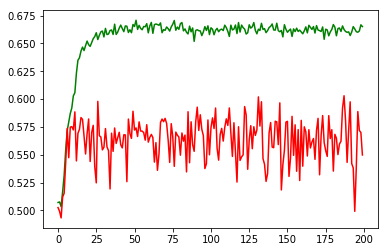

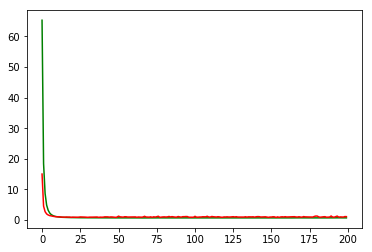

working on d,u and l,learn 0.5 64 0.05 0.001


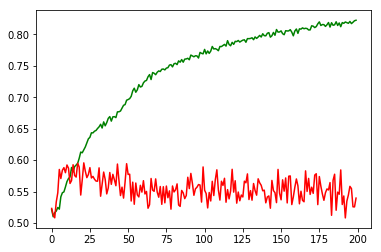

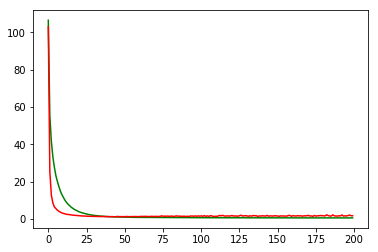

working on d,u and l,learn 0.5 64 0.05 0.0005


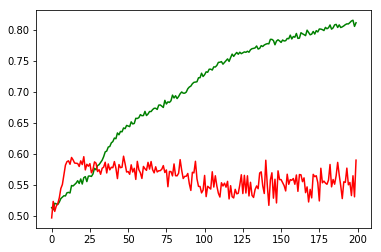

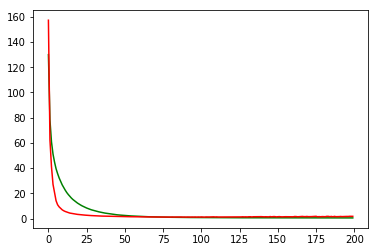

working on d,u and l,learn 0.5 64 0.05 0.0001


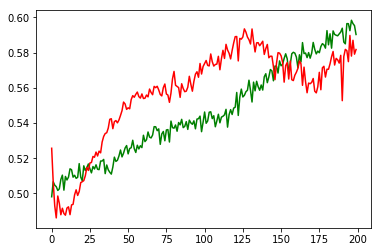

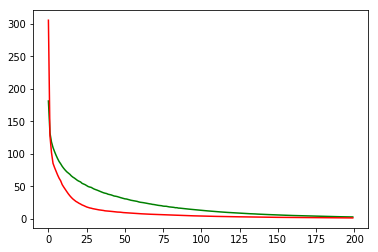

working on d,u and l,learn 0.5 64 0.01 0.005


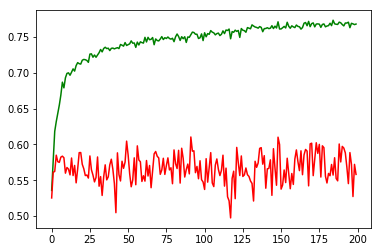

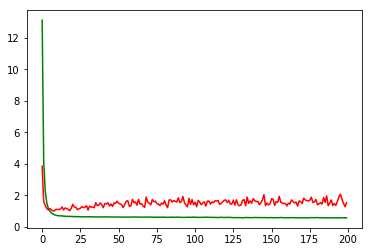

working on d,u and l,learn 0.5 64 0.01 0.001


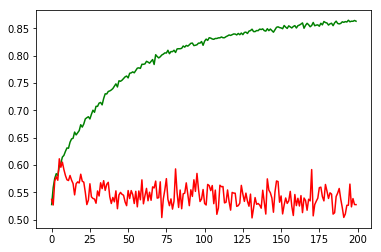

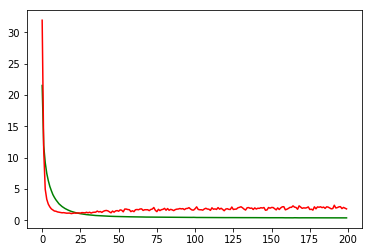

working on d,u and l,learn 0.5 64 0.01 0.0005


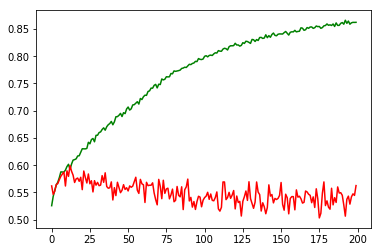

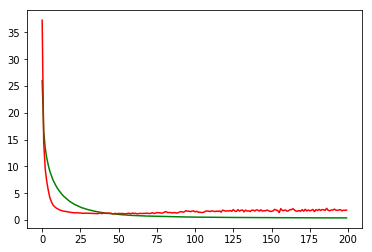

working on d,u and l,learn 0.5 64 0.01 0.0001


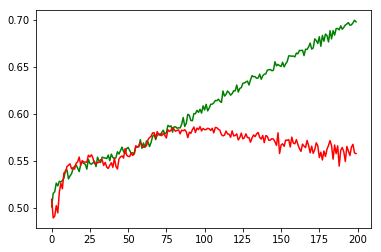

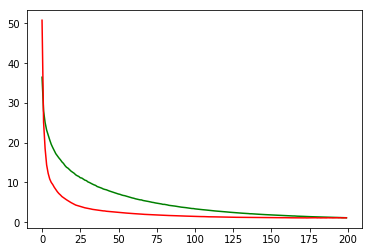

working on d,u and l,learn 0.5 128 0.05 0.005


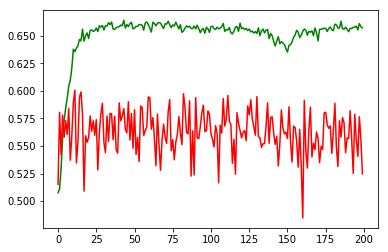

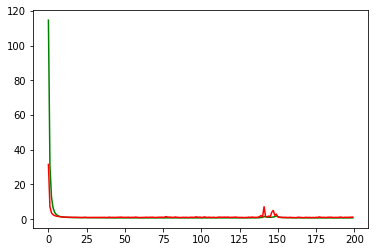

working on d,u and l,learn 0.5 128 0.05 0.001


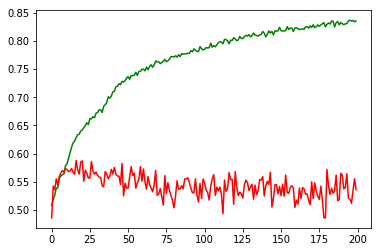

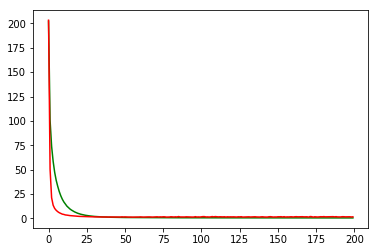

working on d,u and l,learn 0.5 128 0.05 0.0005


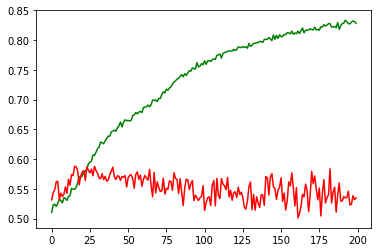

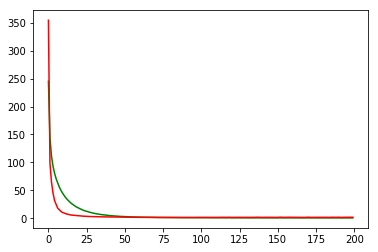

working on d,u and l,learn 0.5 128 0.05 0.0001


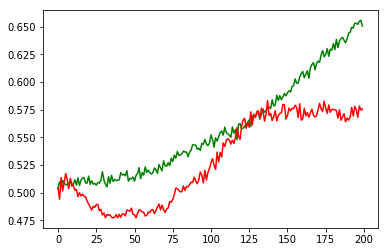

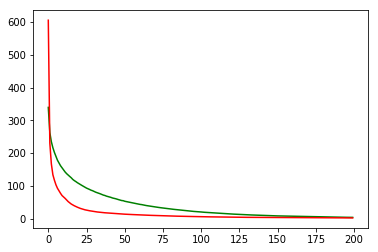

working on d,u and l,learn 0.5 128 0.01 0.005


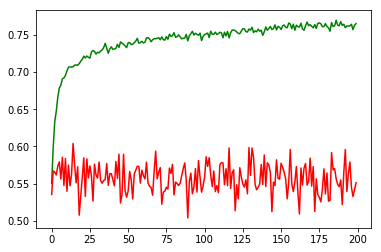

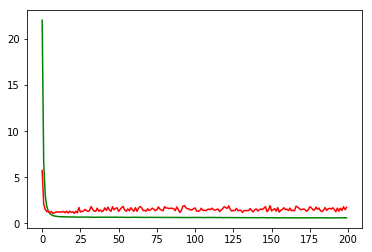

working on d,u and l,learn 0.5 128 0.01 0.001


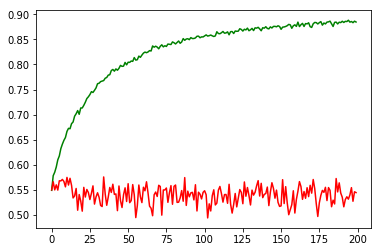

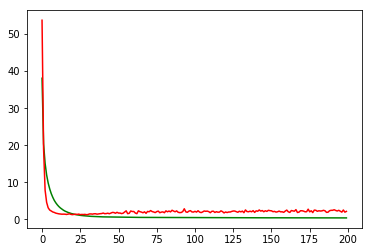

working on d,u and l,learn 0.5 128 0.01 0.0005


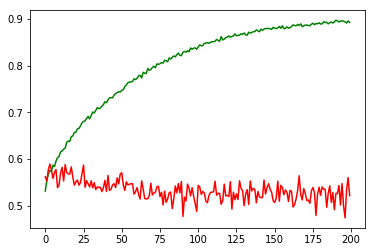

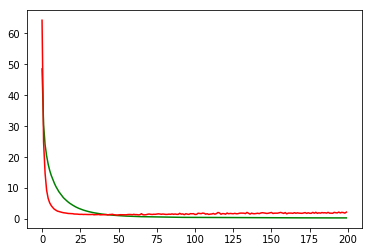

working on d,u and l,learn 0.5 128 0.01 0.0001


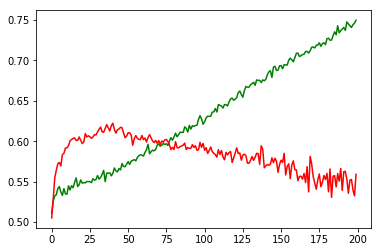

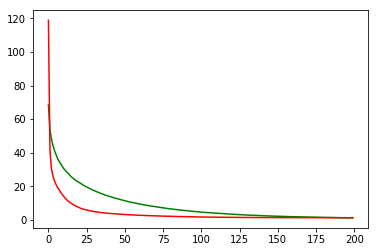

working on d,u and l,learn 0.25 64 0.05 0.005


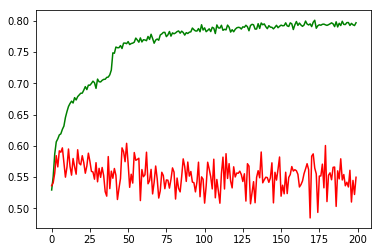

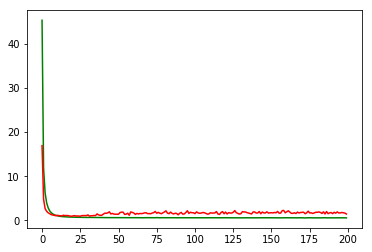

working on d,u and l,learn 0.25 64 0.05 0.001


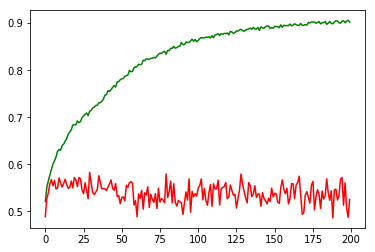

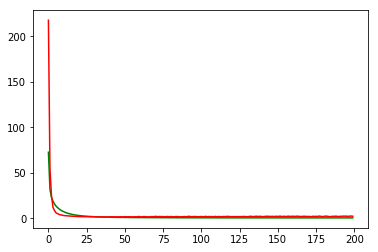

working on d,u and l,learn 0.25 64 0.05 0.0005


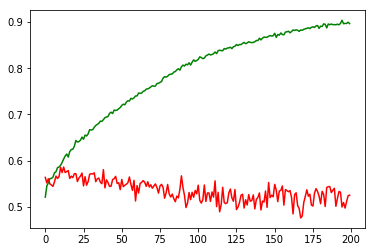

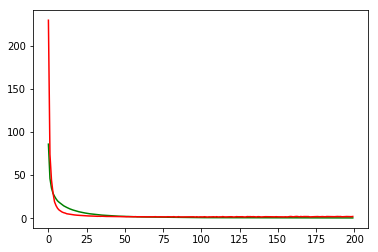

working on d,u and l,learn 0.25 64 0.05 0.0001


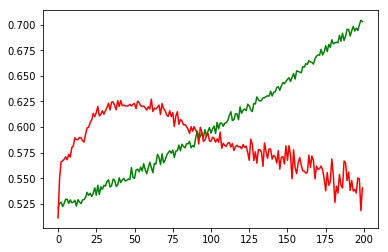

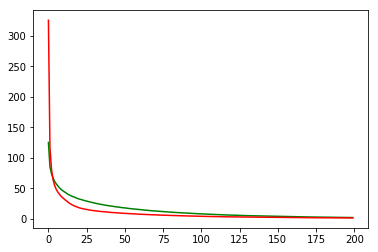

working on d,u and l,learn 0.25 64 0.01 0.005


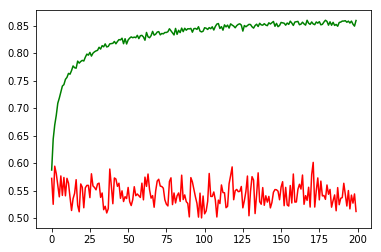

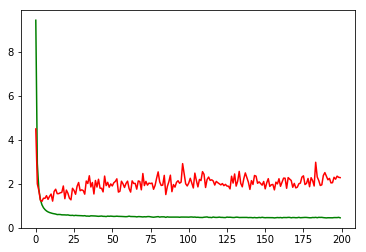

working on d,u and l,learn 0.25 64 0.01 0.001


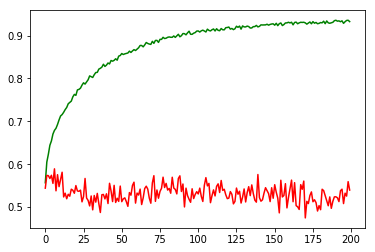

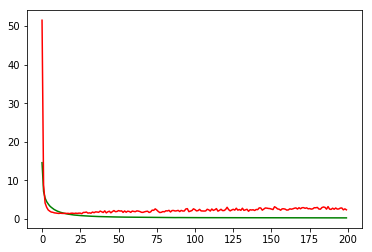

working on d,u and l,learn 0.25 64 0.01 0.0005


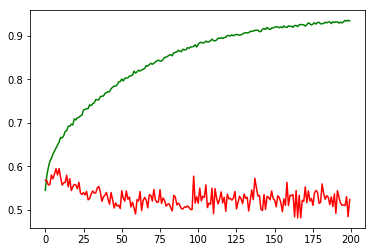

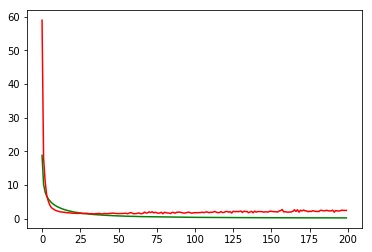

working on d,u and l,learn 0.25 64 0.01 0.0001


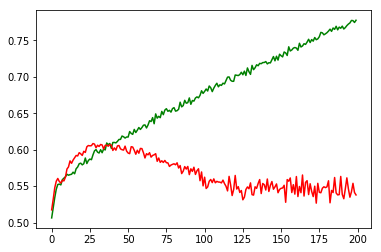

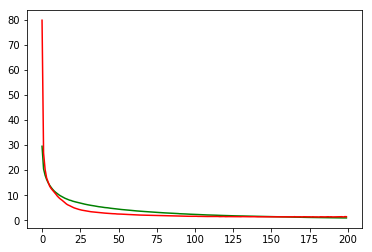

working on d,u and l,learn 0.25 128 0.05 0.005


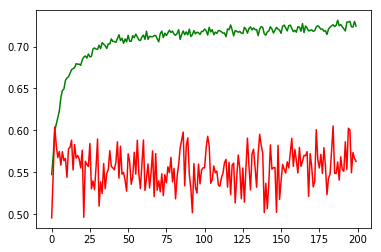

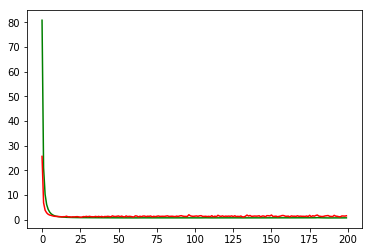

working on d,u and l,learn 0.25 128 0.05 0.001


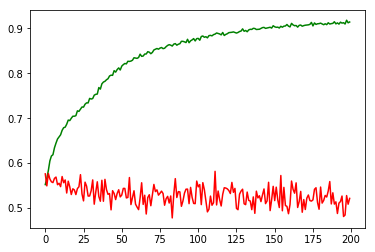

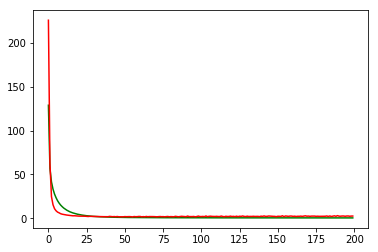

working on d,u and l,learn 0.25 128 0.05 0.0005


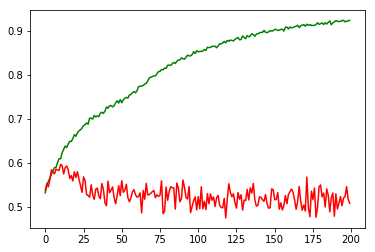

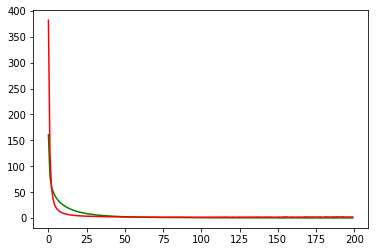

working on d,u and l,learn 0.25 128 0.05 0.0001


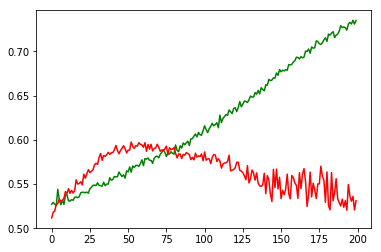

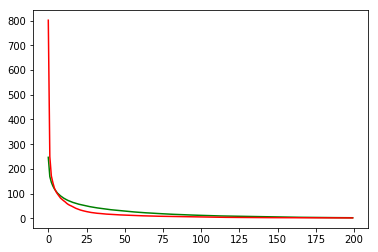

working on d,u and l,learn 0.25 128 0.01 0.005


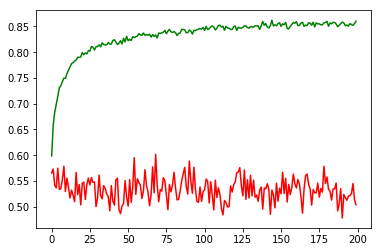

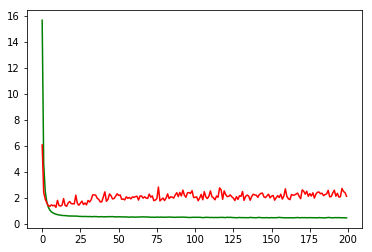

working on d,u and l,learn 0.25 128 0.01 0.001


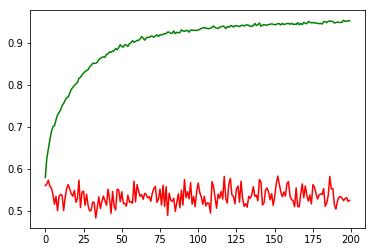

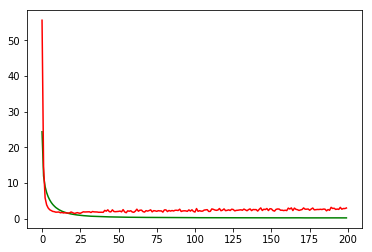

working on d,u and l,learn 0.25 128 0.01 0.0005


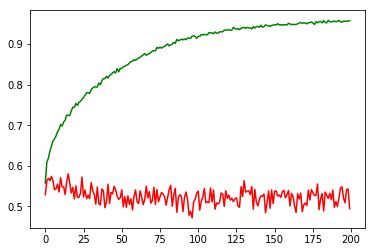

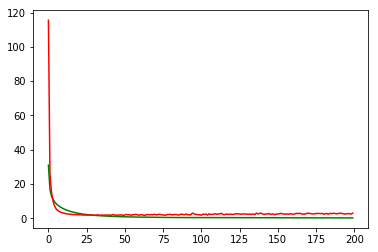

working on d,u and l,learn 0.25 128 0.01 0.0001


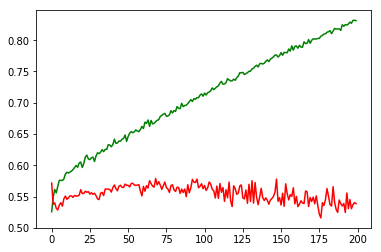

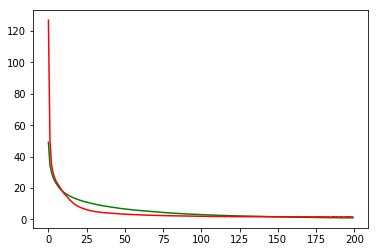

Chart for BEST MODEL FOR: AAPL


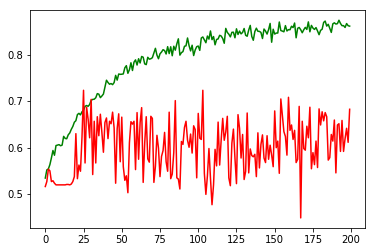

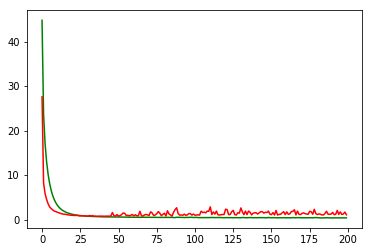

F1,score 0.7247494217424827
G-score: 0.6653096920242255
Accuracy 0.6823843410006621
Window: 140
[[297 243]
 [114 470]]
Vol pos 4.323863515026807
Vol neg 3.322809804671731
Real Percentage of gain: 167.1459804585472
Percentage of gain: 1.8951603343040513
Total gain: 2130.1602157577536
000000000000000000000000000000000000000000000000
Percentile:  0
ecco la somma Positiva: [0.88267595]
ecco la somma Negativa: [0.20119375]
[[ 92 137]
 [ 86 223]]
538/538 [==============================] - 0s 99us/step
[1.4044384479965861, 0.5855018594007952]
Percentile:  1
ecco la somma Positiva: [0.87198395]
ecco la somma Negativa: [0.1761443]
[[163  78]
 [  8 132]]
381/381 [==============================] - 0s 94us/step
[0.6163018946572552, 0.7742782152230971]
Percentile:  2
ecco la somma Positiva: [0.8560916]
ecco la somma Negativa: [0.1388296]
[[42 27]
 [ 0 50]]
119/119 [==============================] - 0s 129us/step
[0.6325412928557196, 0.773109243697479]
Percentile:  3
ecco la somma Positiva: [0.85119

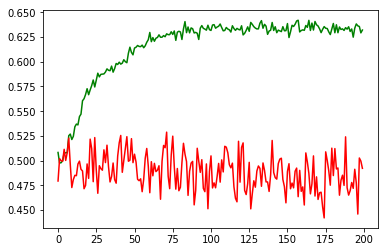

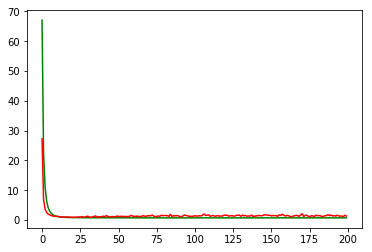

working on d,u and l,learn 0.5 64 0.05 0.001


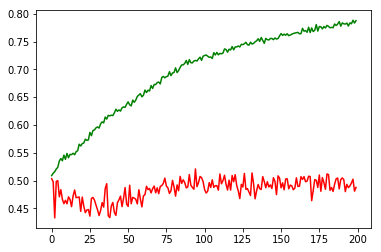

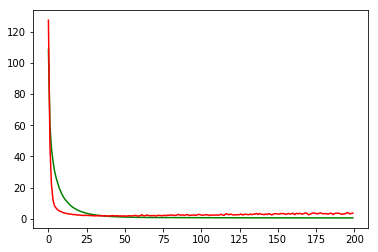

working on d,u and l,learn 0.5 64 0.05 0.0005


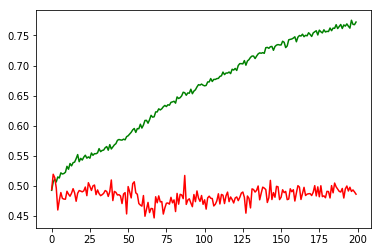

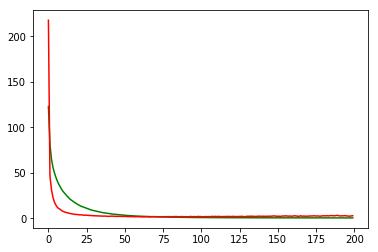

working on d,u and l,learn 0.5 64 0.05 0.0001


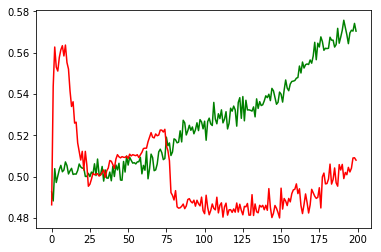

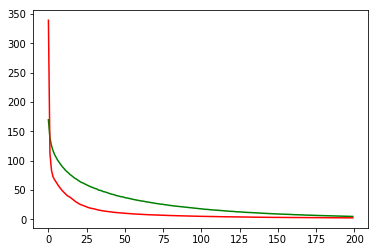

working on d,u and l,learn 0.5 64 0.01 0.005


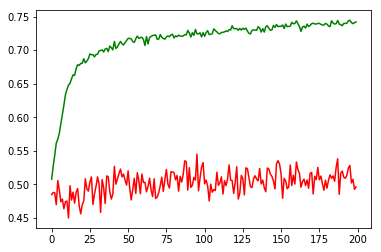

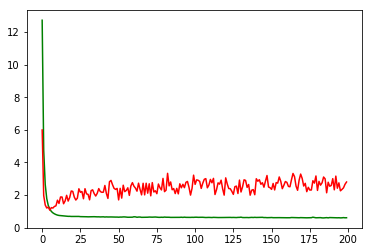

working on d,u and l,learn 0.5 64 0.01 0.001


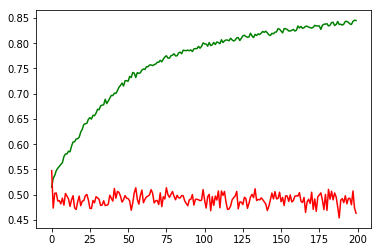

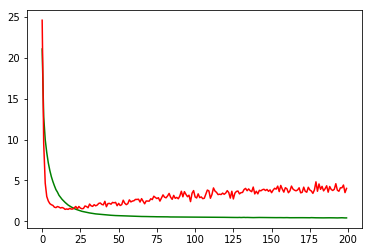

working on d,u and l,learn 0.5 64 0.01 0.0005


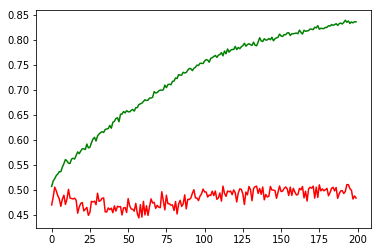

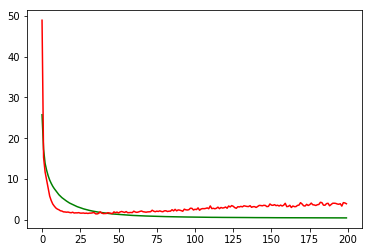

working on d,u and l,learn 0.5 64 0.01 0.0001


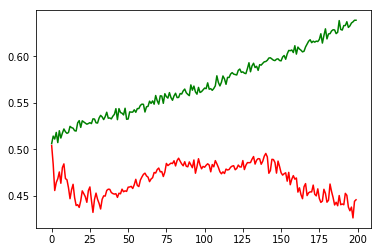

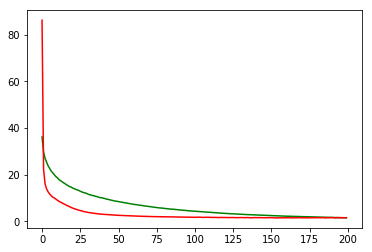

working on d,u and l,learn 0.5 128 0.05 0.005


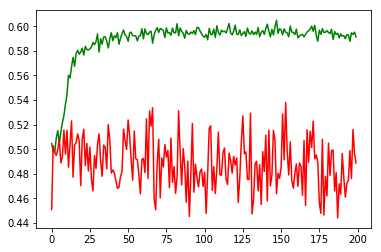

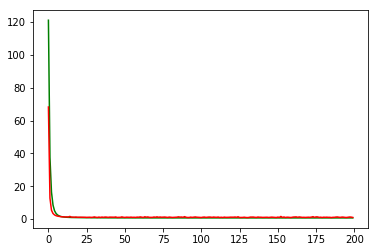

working on d,u and l,learn 0.5 128 0.05 0.001


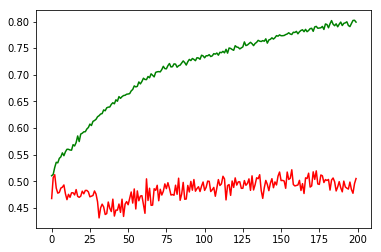

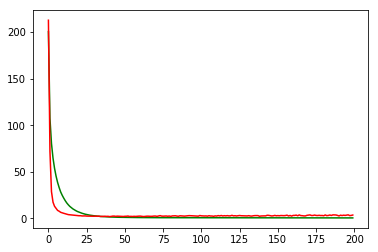

working on d,u and l,learn 0.5 128 0.05 0.0005


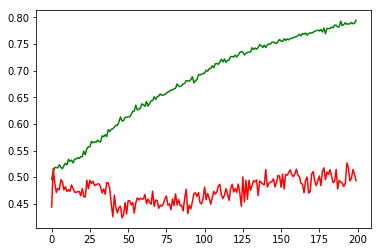

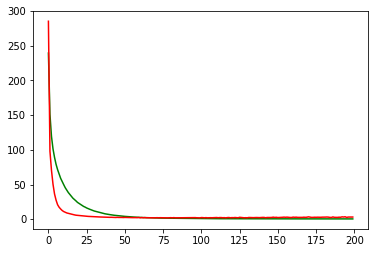

working on d,u and l,learn 0.5 128 0.05 0.0001


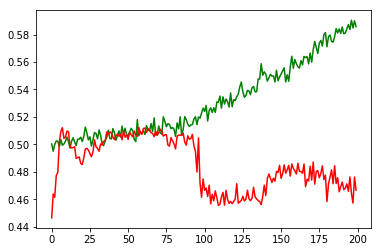

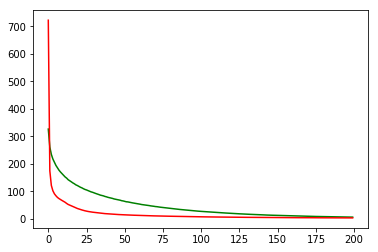

working on d,u and l,learn 0.5 128 0.01 0.005


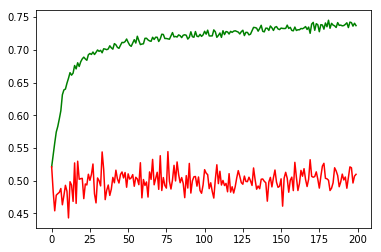

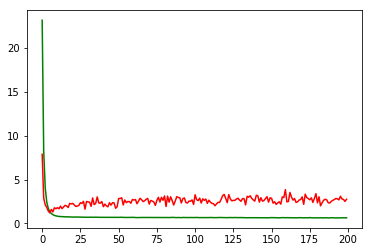

working on d,u and l,learn 0.5 128 0.01 0.001


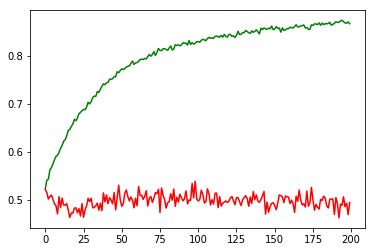

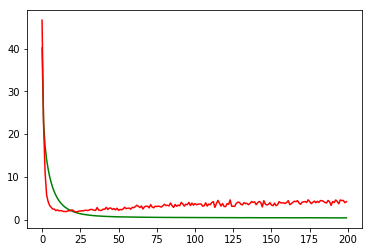

working on d,u and l,learn 0.5 128 0.01 0.0005


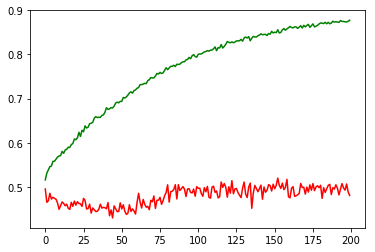

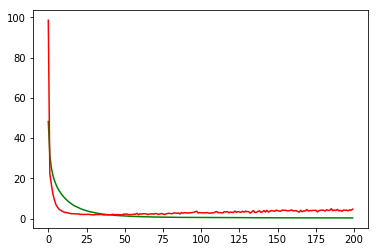

working on d,u and l,learn 0.5 128 0.01 0.0001


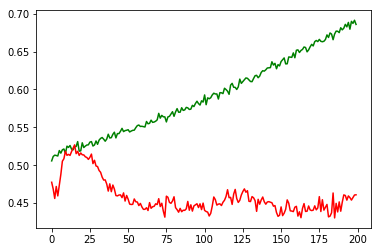

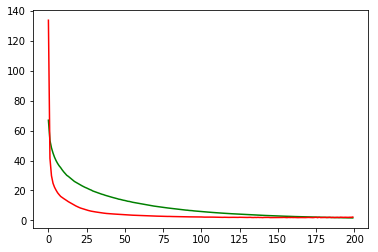

working on d,u and l,learn 0.25 64 0.05 0.005


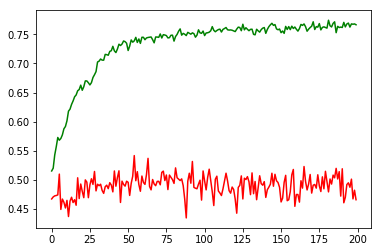

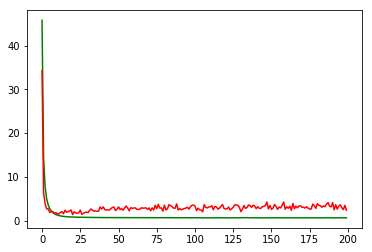

working on d,u and l,learn 0.25 64 0.05 0.001


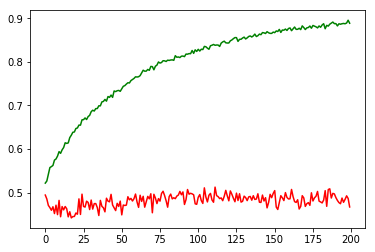

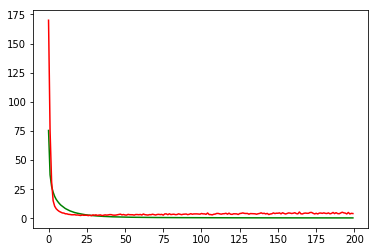

working on d,u and l,learn 0.25 64 0.05 0.0005


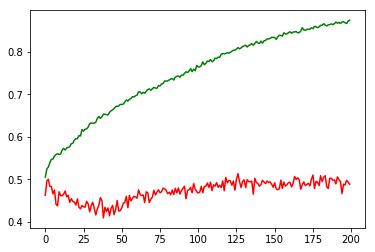

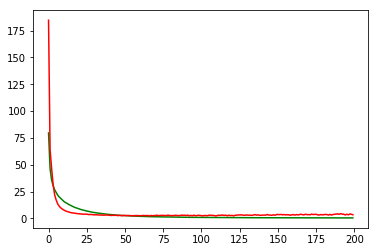

working on d,u and l,learn 0.25 64 0.05 0.0001


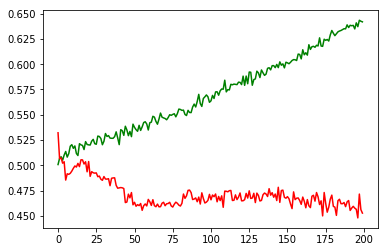

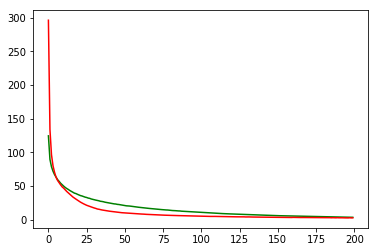

working on d,u and l,learn 0.25 64 0.01 0.005


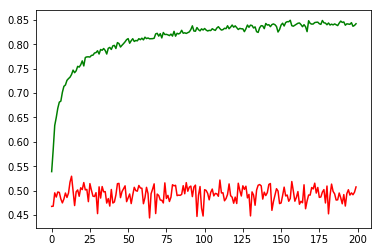

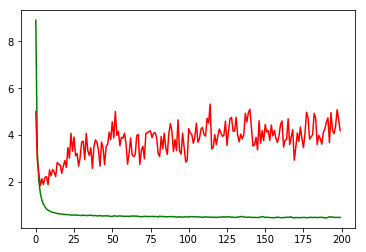

working on d,u and l,learn 0.25 64 0.01 0.001


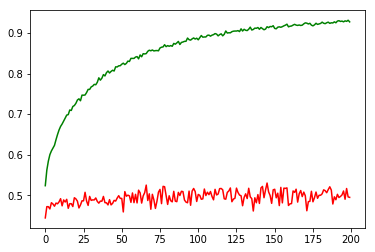

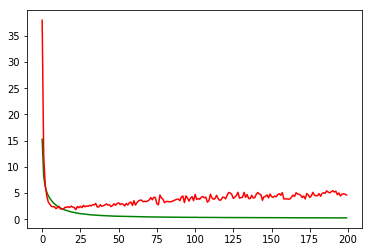

working on d,u and l,learn 0.25 64 0.01 0.0005


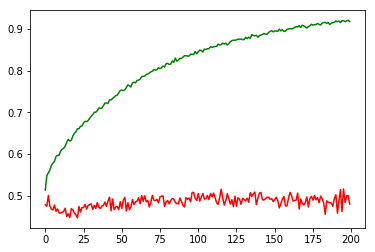

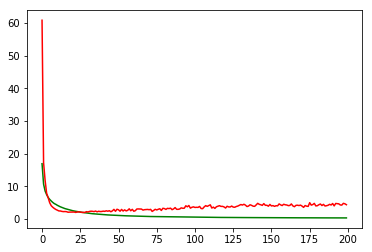

working on d,u and l,learn 0.25 64 0.01 0.0001


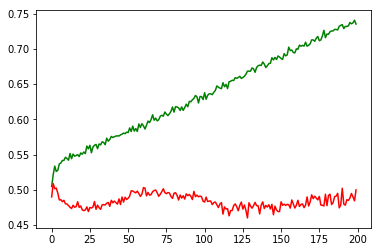

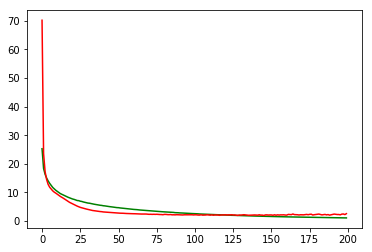

working on d,u and l,learn 0.25 128 0.05 0.005


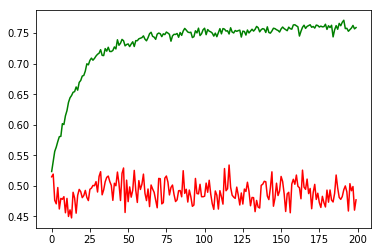

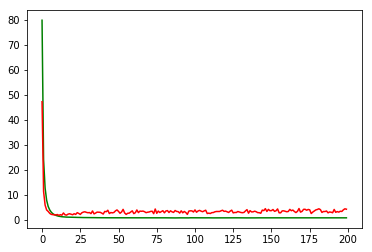

working on d,u and l,learn 0.25 128 0.05 0.001


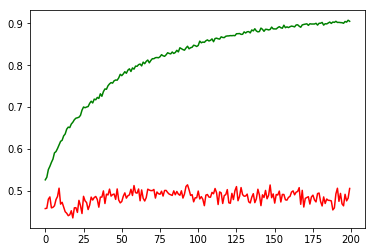

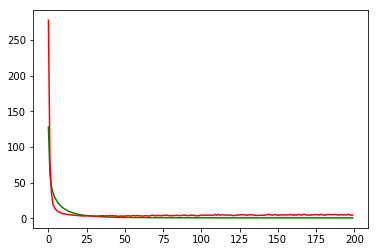

working on d,u and l,learn 0.25 128 0.05 0.0005


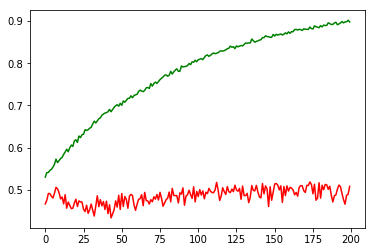

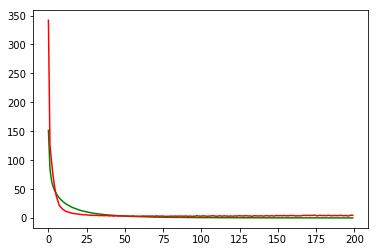

working on d,u and l,learn 0.25 128 0.05 0.0001


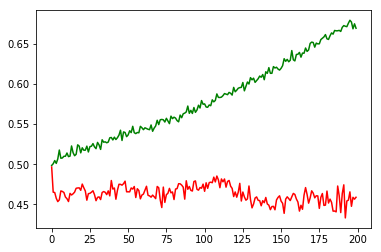

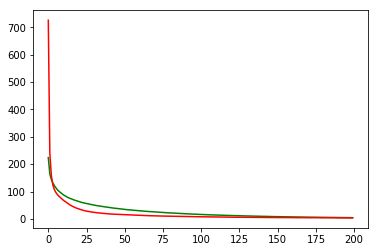

working on d,u and l,learn 0.25 128 0.01 0.005


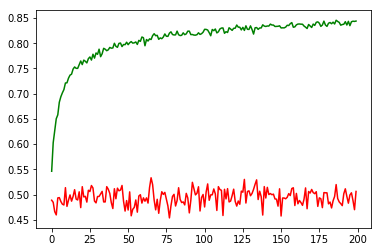

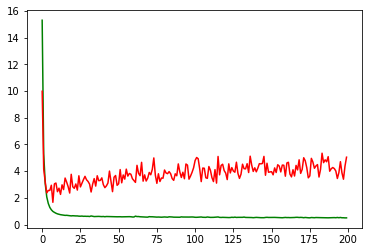

working on d,u and l,learn 0.25 128 0.01 0.001


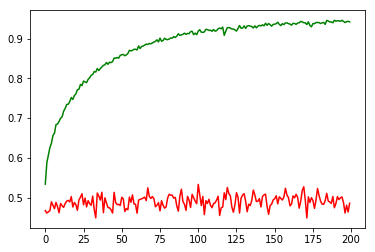

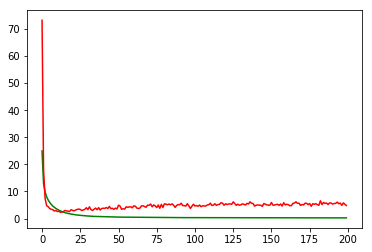

working on d,u and l,learn 0.25 128 0.01 0.0005


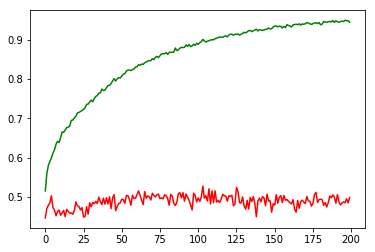

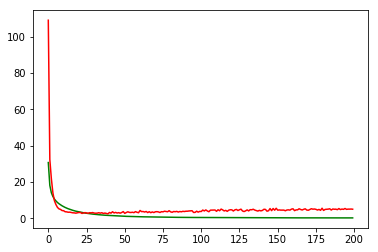

working on d,u and l,learn 0.25 128 0.01 0.0001


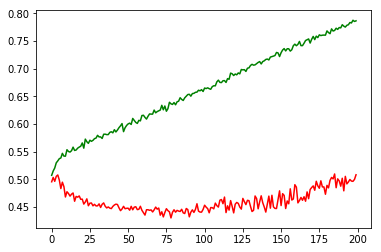

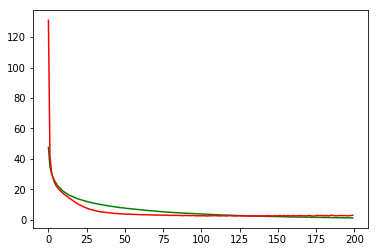

Chart for BEST MODEL FOR: AMZN


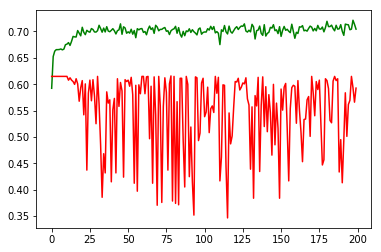

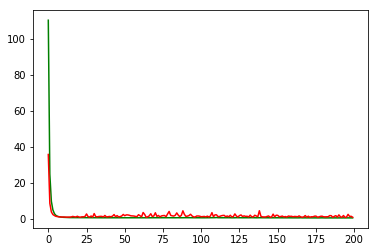

F1,score 0.742117117117117
G-score: 0.12416773397370794
Accuracy 0.5925266889066458
Window: 140
[[  7 426]
 [ 32 659]]
Vol pos 3.6280725779888456
Vol neg 4.53908013559071
Real Percentage of gain: -17.76614611587685
Percentage of gain: 0.30017583170820783
Total gain: 337.3976348400256
000000000000000000000000000000000000000000000000
Percentile:  0
ecco la somma Positiva: [0.74203175]
ecco la somma Negativa: [0.35390225]
[[  5 181]
 [ 17 268]]
471/471 [==============================] - 0s 105us/step
[0.8375884166695257, 0.5796178343949044]
Percentile:  1
ecco la somma Positiva: [0.7531194]
ecco la somma Negativa: [0.44382292]
[[  2 108]
 [ 14 216]]
340/340 [==============================] - 0s 156us/step
[0.8287145961733425, 0.6411764698870042]
Percentile:  2
ecco la somma Positiva: [0.7544082]
[[  0  15]
 [  0 140]]
155/155 [==============================] - 0s 146us/step
[0.42943754292303515, 0.9032258064516129]
Percentile:  3
ecco la somma Positiva: [0.71333534]
[[ 0 89]
 [ 1 32]]
122

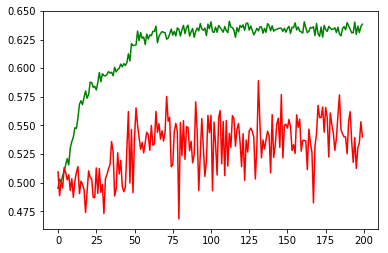

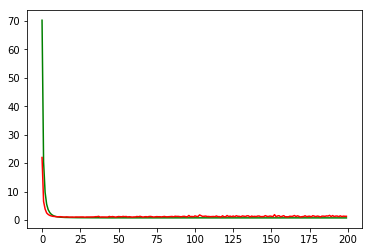

working on d,u and l,learn 0.5 64 0.05 0.001


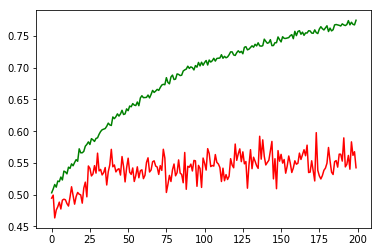

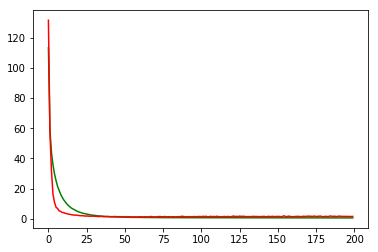

working on d,u and l,learn 0.5 64 0.05 0.0005


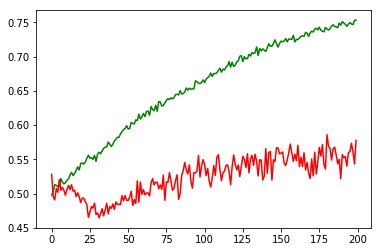

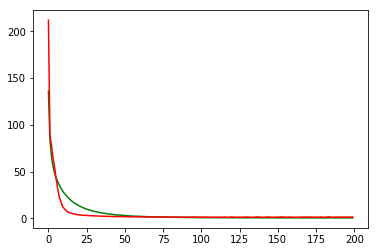

working on d,u and l,learn 0.5 64 0.05 0.0001


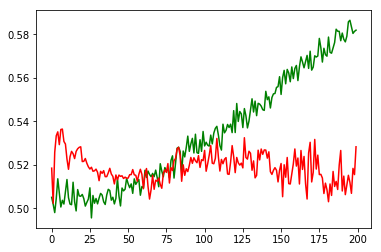

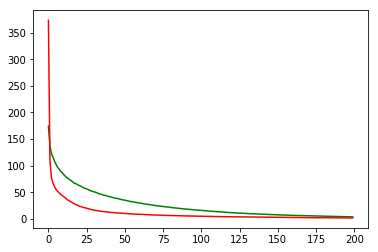

working on d,u and l,learn 0.5 64 0.01 0.005


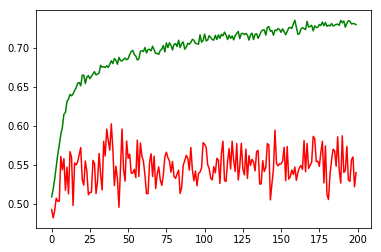

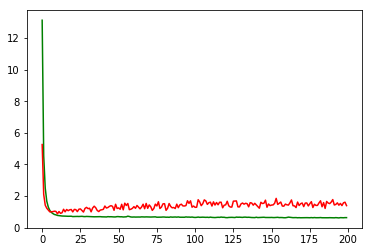

working on d,u and l,learn 0.5 64 0.01 0.001


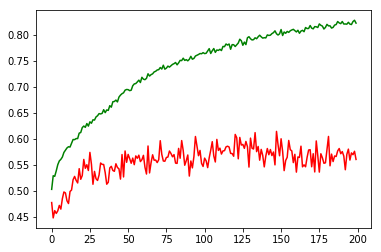

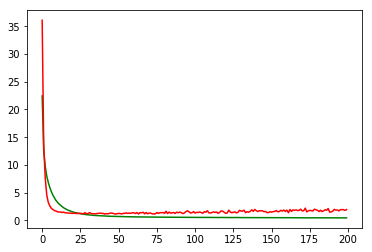

working on d,u and l,learn 0.5 64 0.01 0.0005


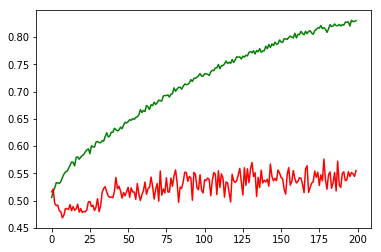

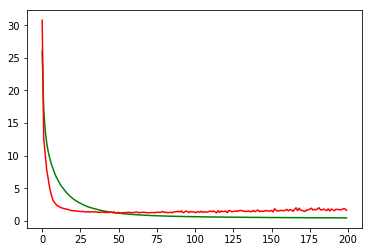

working on d,u and l,learn 0.5 64 0.01 0.0001


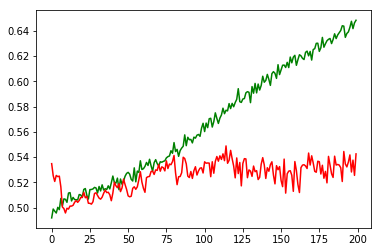

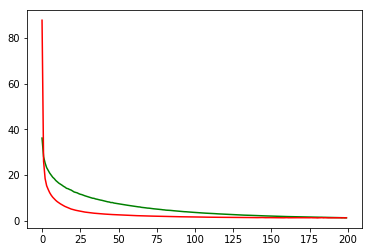

working on d,u and l,learn 0.5 128 0.05 0.005


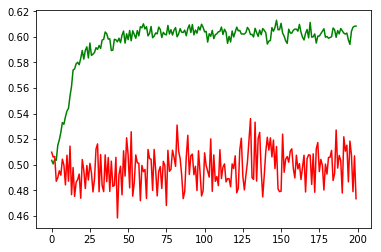

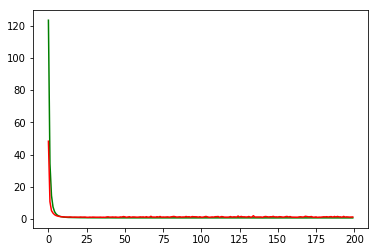

working on d,u and l,learn 0.5 128 0.05 0.001


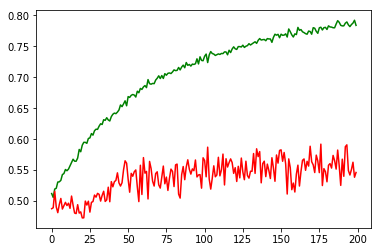

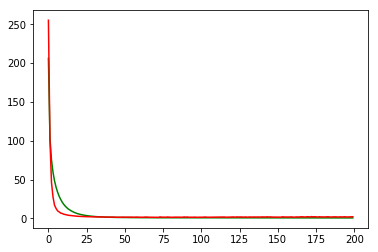

working on d,u and l,learn 0.5 128 0.05 0.0005


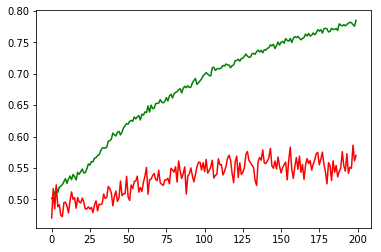

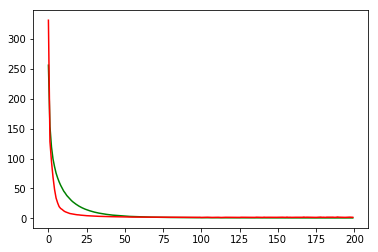

working on d,u and l,learn 0.5 128 0.05 0.0001


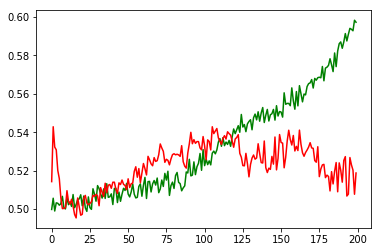

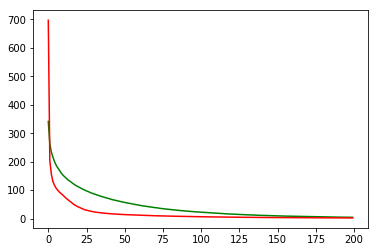

working on d,u and l,learn 0.5 128 0.01 0.005


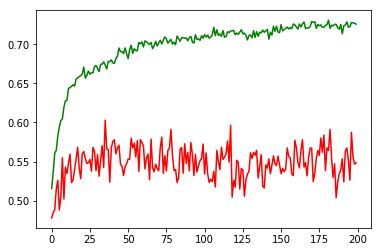

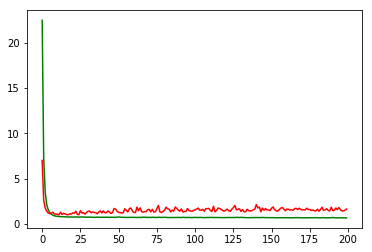

working on d,u and l,learn 0.5 128 0.01 0.001


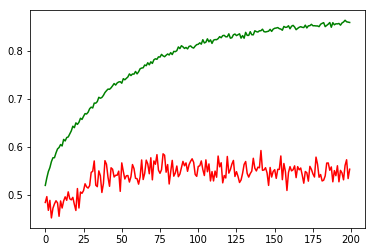

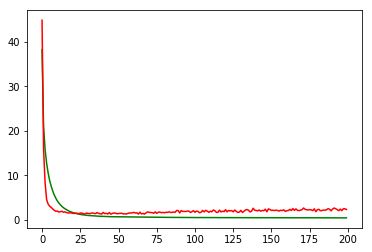

working on d,u and l,learn 0.5 128 0.01 0.0005


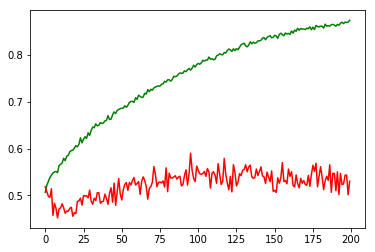

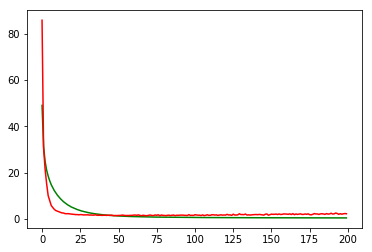

working on d,u and l,learn 0.5 128 0.01 0.0001


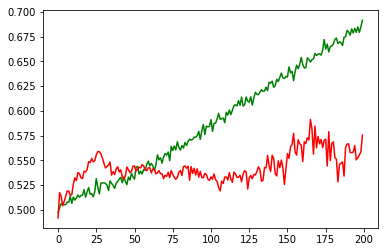

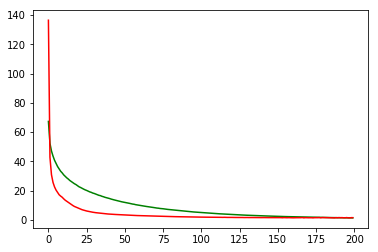

working on d,u and l,learn 0.25 64 0.05 0.005


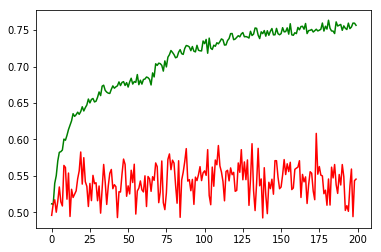

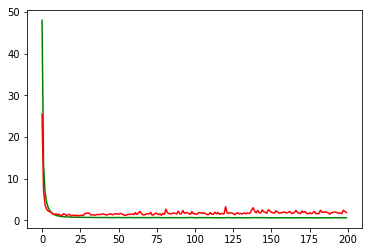

working on d,u and l,learn 0.25 64 0.05 0.001


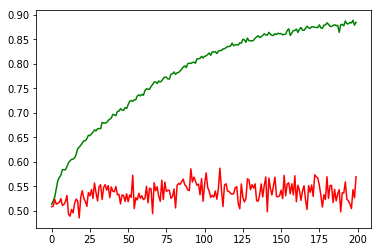

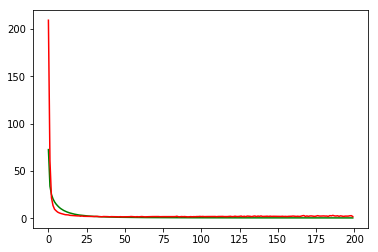

working on d,u and l,learn 0.25 64 0.05 0.0005


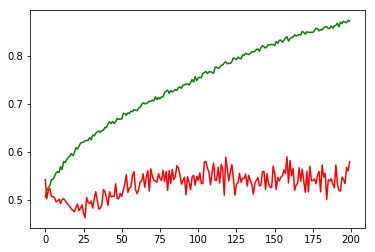

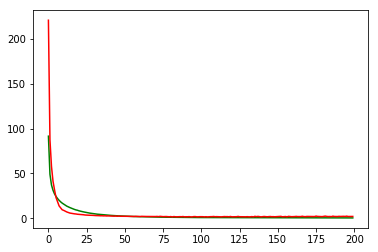

working on d,u and l,learn 0.25 64 0.05 0.0001


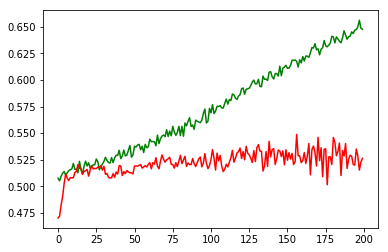

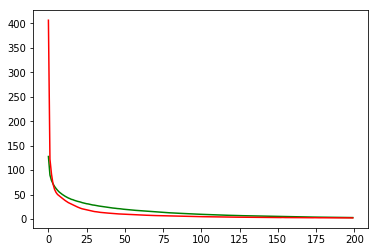

working on d,u and l,learn 0.25 64 0.01 0.005


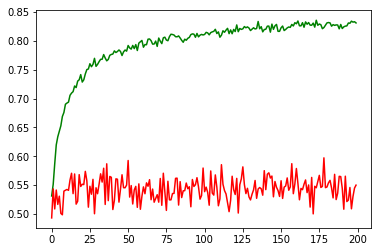

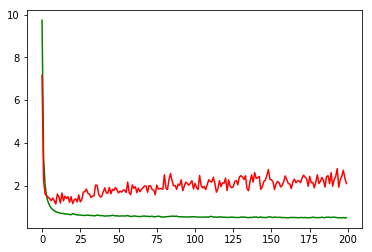

working on d,u and l,learn 0.25 64 0.01 0.001


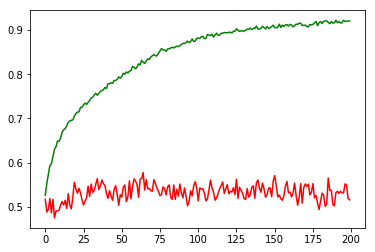

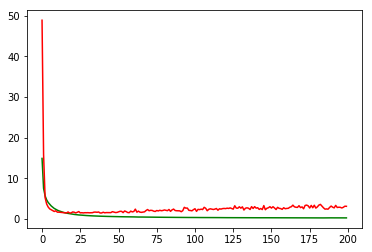

working on d,u and l,learn 0.25 64 0.01 0.0005


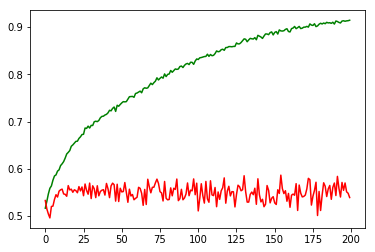

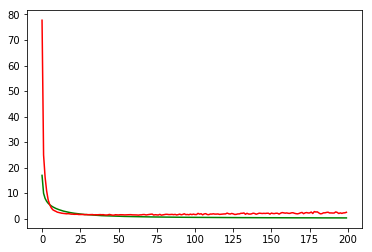

working on d,u and l,learn 0.25 64 0.01 0.0001


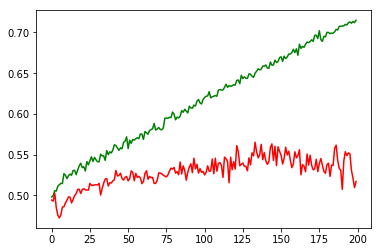

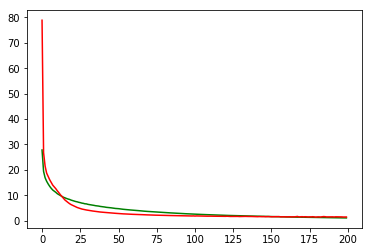

working on d,u and l,learn 0.25 128 0.05 0.005


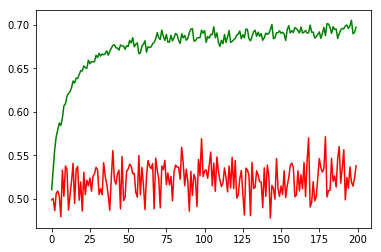

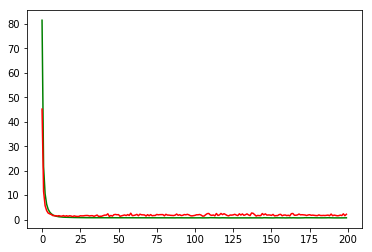

working on d,u and l,learn 0.25 128 0.05 0.001


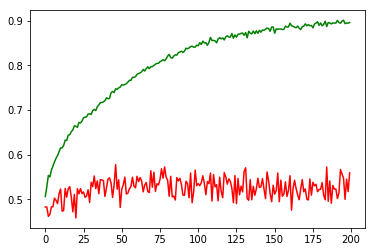

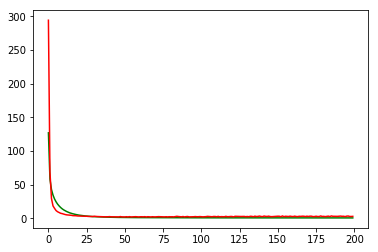

working on d,u and l,learn 0.25 128 0.05 0.0005


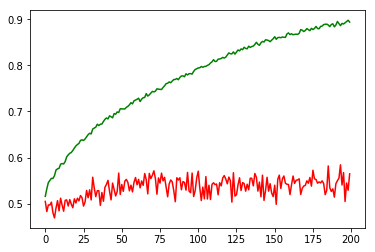

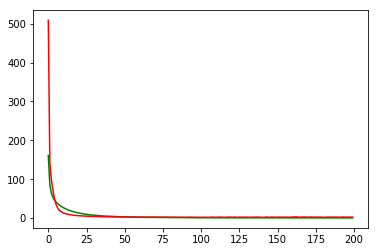

working on d,u and l,learn 0.25 128 0.05 0.0001


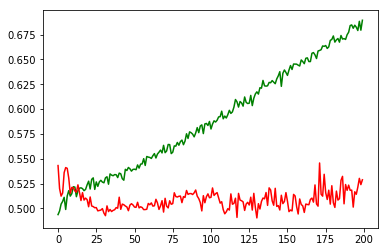

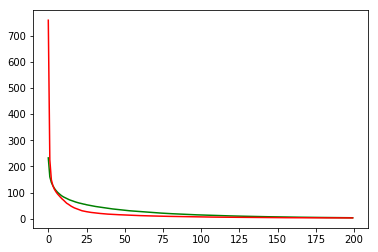

working on d,u and l,learn 0.25 128 0.01 0.005


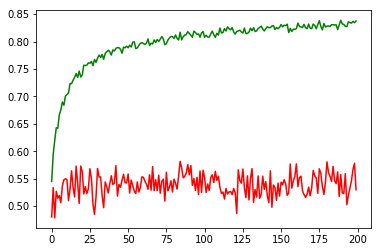

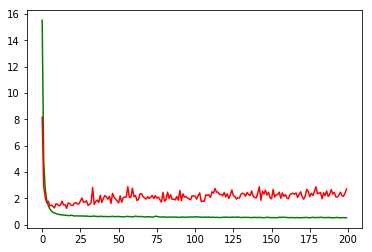

working on d,u and l,learn 0.25 128 0.01 0.001


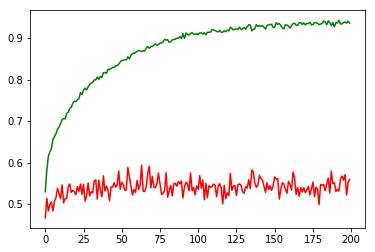

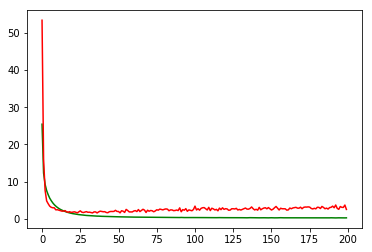

working on d,u and l,learn 0.25 128 0.01 0.0005


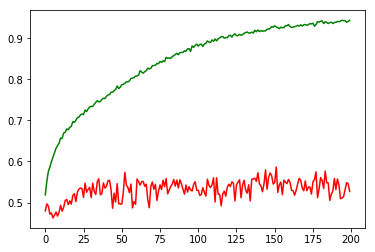

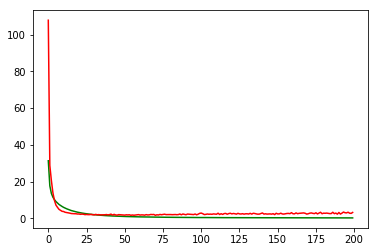

working on d,u and l,learn 0.25 128 0.01 0.0001


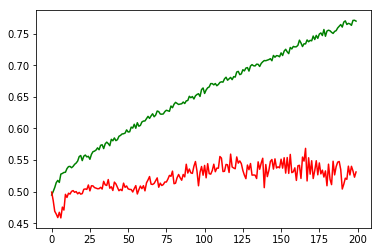

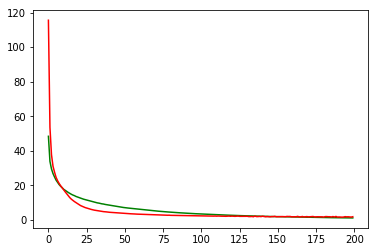

Chart for BEST MODEL FOR: GOOGL


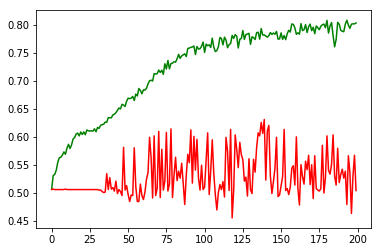

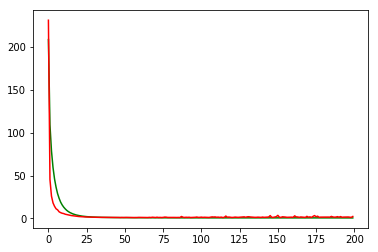

F1,score 0.653416149068323
G-score: 0.2581138472293243
Accuracy 0.5035587169521644
Window: 140
[[ 40 516]
 [ 42 526]]
Vol pos 3.153742563752914
Vol neg 4.421568991789671
Real Percentage of gain: -47.37863031726182
Percentage of gain: -0.6069548099061278
Total gain: -682.2172063344876
000000000000000000000000000000000000000000000000
Percentile:  0
ecco la somma Positiva: [0.8843493]
ecco la somma Negativa: [0.28638864]
[[ 12  74]
 [ 21 144]]
251/251 [==============================] - 0s 236us/step
[1.1664767217826084, 0.6215139423233579]
Percentile:  1
ecco la somma Positiva: [0.8893689]
ecco la somma Negativa: [0.2937247]
[[  9 102]
 [ 10 197]]
318/318 [==============================] - 0s 265us/step
[1.8429622612659287, 0.647798739889133]
Percentile:  2
ecco la somma Positiva: [0.91198593]
ecco la somma Negativa: [0.32960483]
[[ 13 187]
 [ 11 159]]
370/370 [==============================] - 0s 265us/step
[2.1772649817370078, 0.4648648648648649]
Percentile:  3
ecco la somma Positiva: [

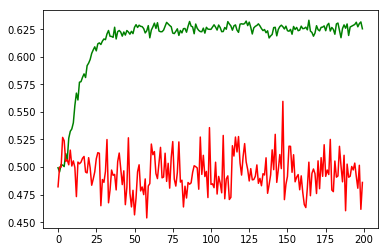

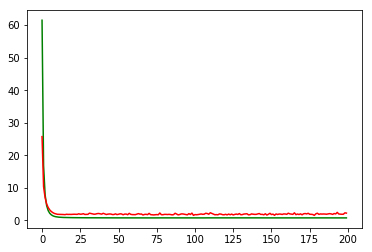

working on d,u and l,learn 0.5 64 0.05 0.001


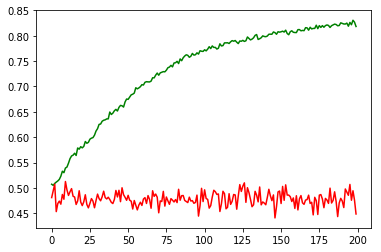

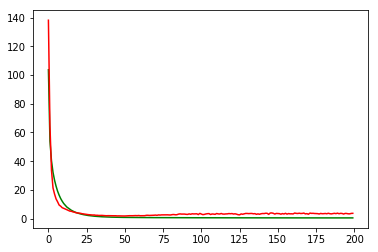

working on d,u and l,learn 0.5 64 0.05 0.0005


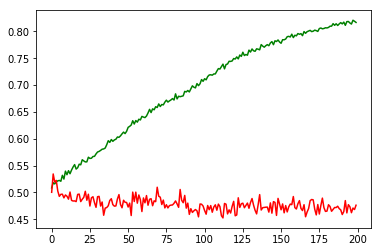

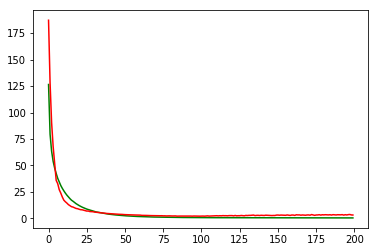

working on d,u and l,learn 0.5 64 0.05 0.0001


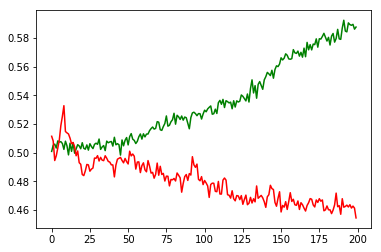

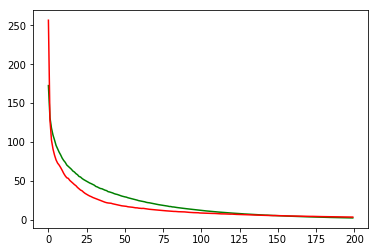

working on d,u and l,learn 0.5 64 0.01 0.005


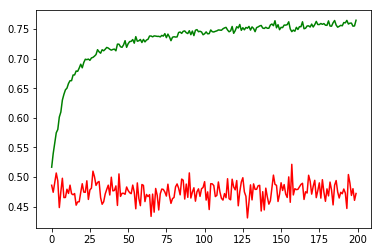

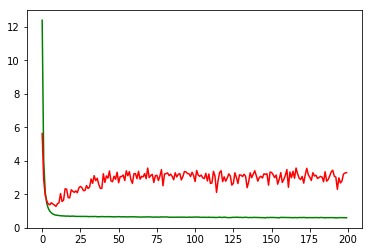

working on d,u and l,learn 0.5 64 0.01 0.001


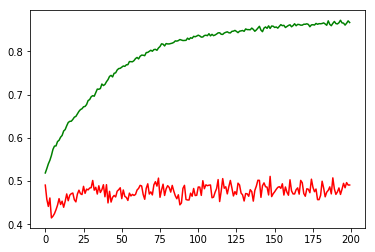

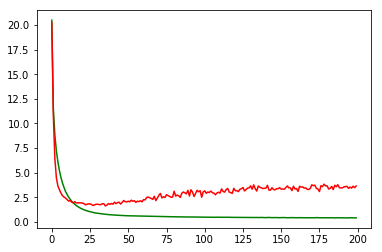

working on d,u and l,learn 0.5 64 0.01 0.0005


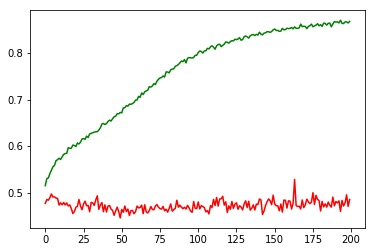

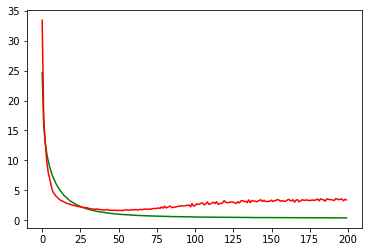

working on d,u and l,learn 0.5 64 0.01 0.0001


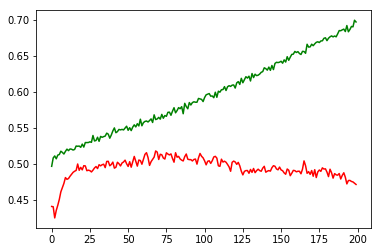

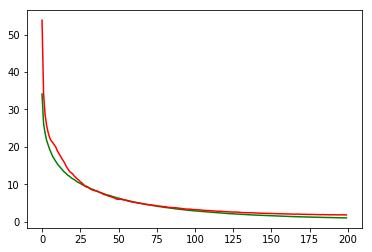

working on d,u and l,learn 0.5 128 0.05 0.005


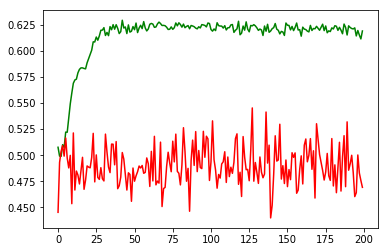

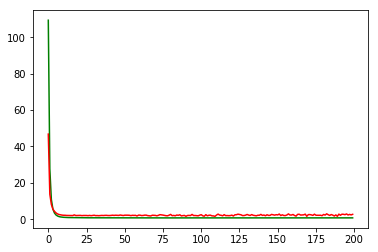

working on d,u and l,learn 0.5 128 0.05 0.001


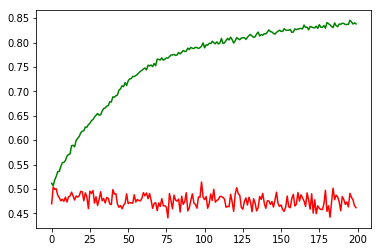

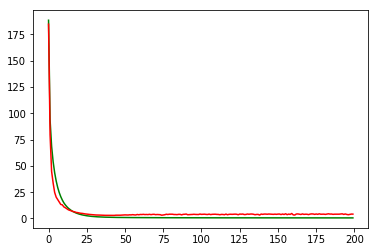

working on d,u and l,learn 0.5 128 0.05 0.0005


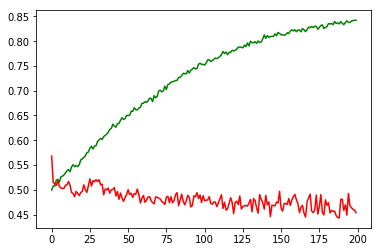

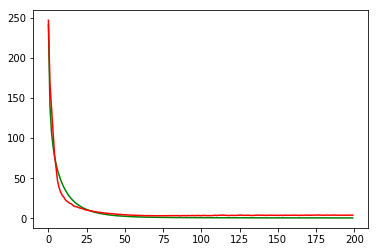

working on d,u and l,learn 0.5 128 0.05 0.0001


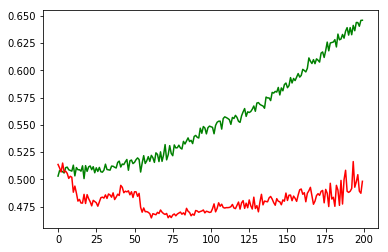

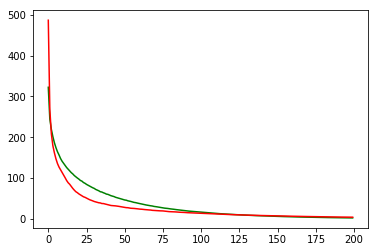

working on d,u and l,learn 0.5 128 0.01 0.005


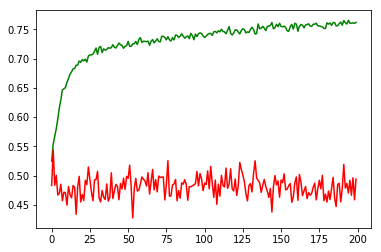

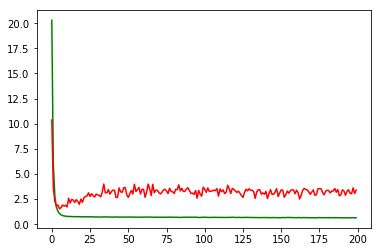

working on d,u and l,learn 0.5 128 0.01 0.001


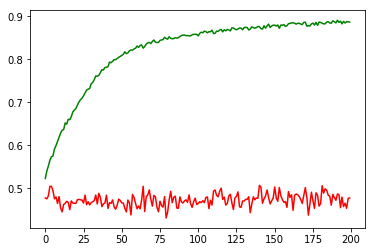

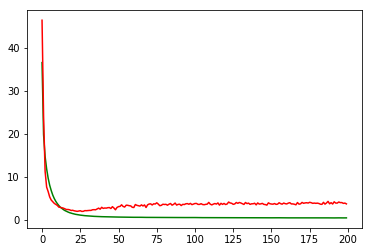

working on d,u and l,learn 0.5 128 0.01 0.0005


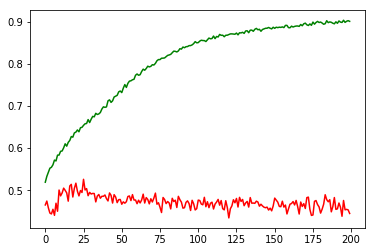

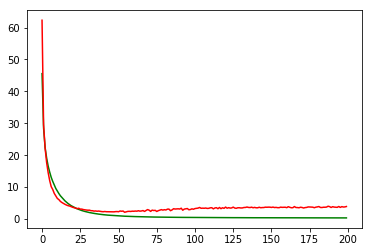

working on d,u and l,learn 0.5 128 0.01 0.0001


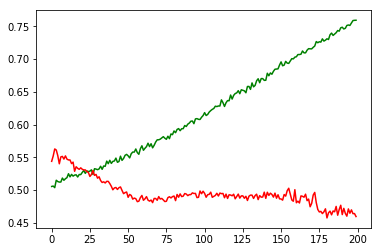

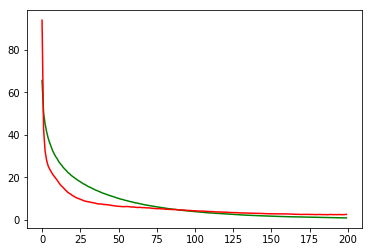

working on d,u and l,learn 0.25 64 0.05 0.005


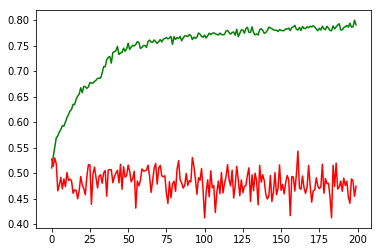

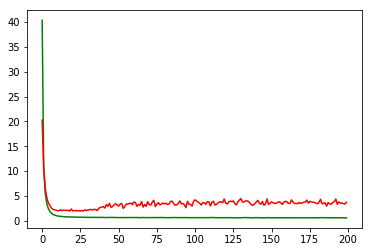

working on d,u and l,learn 0.25 64 0.05 0.001


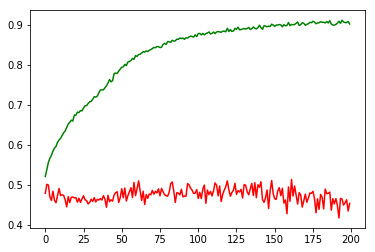

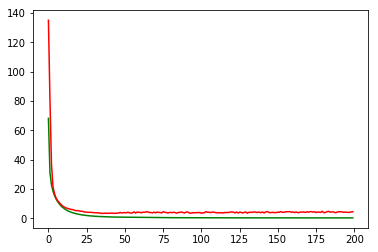

working on d,u and l,learn 0.25 64 0.05 0.0005


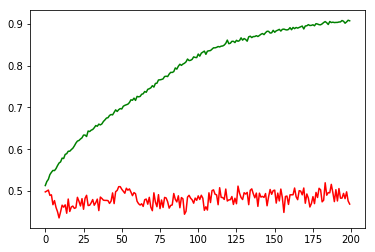

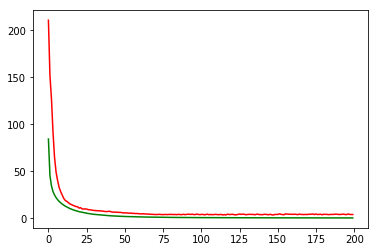

working on d,u and l,learn 0.25 64 0.05 0.0001


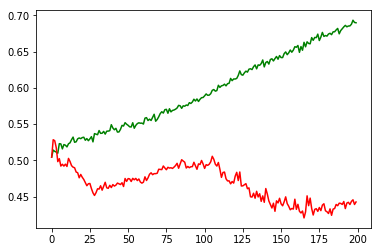

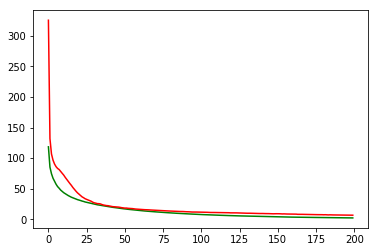

working on d,u and l,learn 0.25 64 0.01 0.005


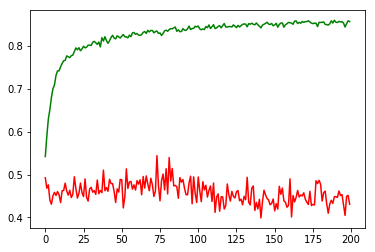

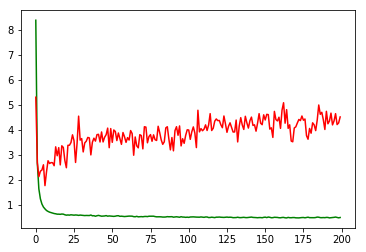

working on d,u and l,learn 0.25 64 0.01 0.001


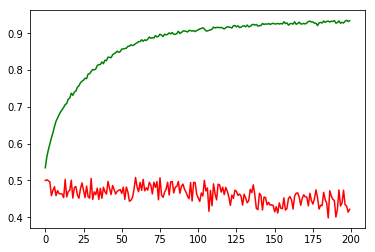

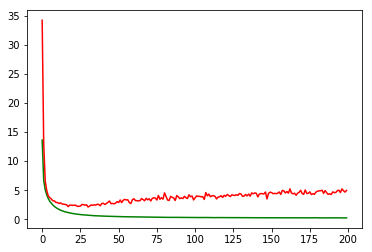

working on d,u and l,learn 0.25 64 0.01 0.0005


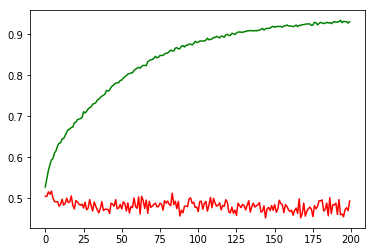

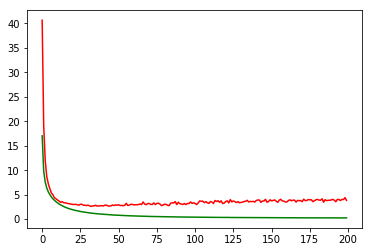

working on d,u and l,learn 0.25 64 0.01 0.0001


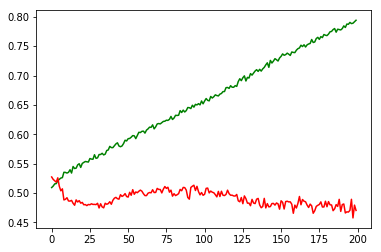

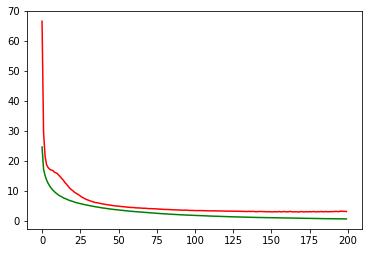

working on d,u and l,learn 0.25 128 0.05 0.005


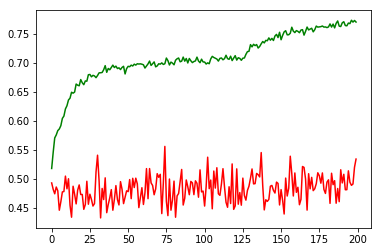

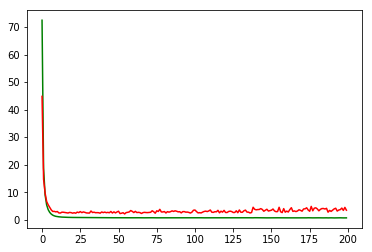

working on d,u and l,learn 0.25 128 0.05 0.001


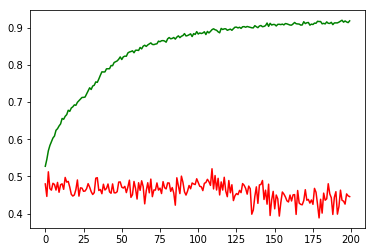

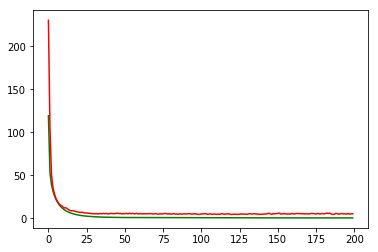

working on d,u and l,learn 0.25 128 0.05 0.0005


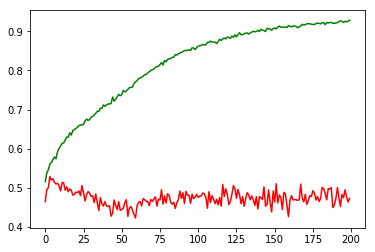

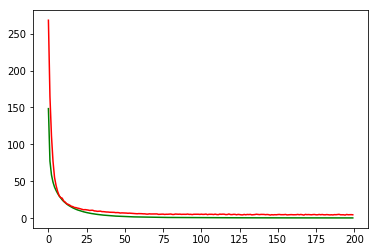

working on d,u and l,learn 0.25 128 0.05 0.0001


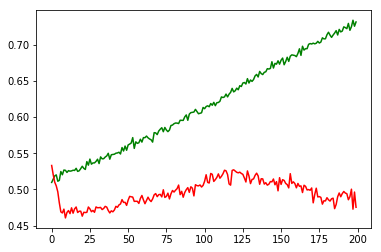

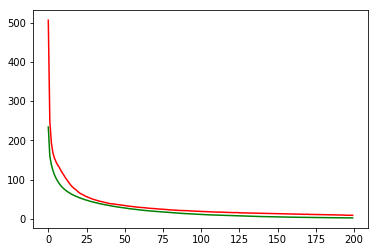

working on d,u and l,learn 0.25 128 0.01 0.005


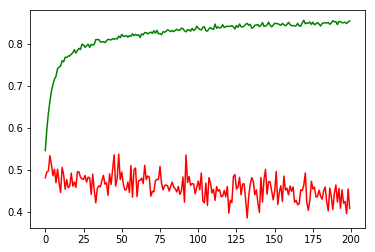

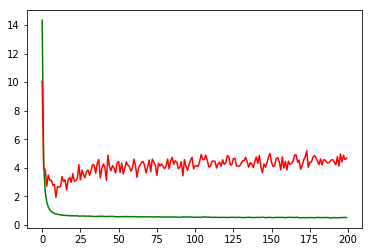

working on d,u and l,learn 0.25 128 0.01 0.001


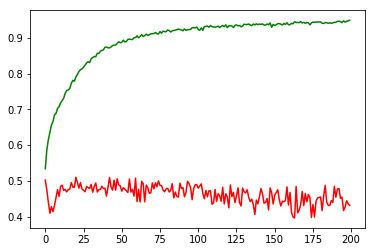

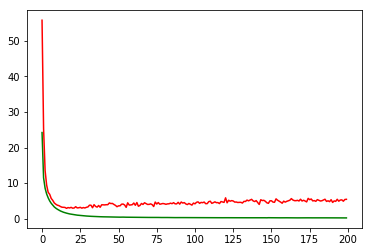

working on d,u and l,learn 0.25 128 0.01 0.0005


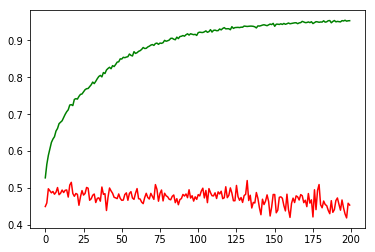

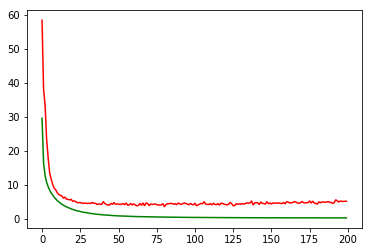

working on d,u and l,learn 0.25 128 0.01 0.0001


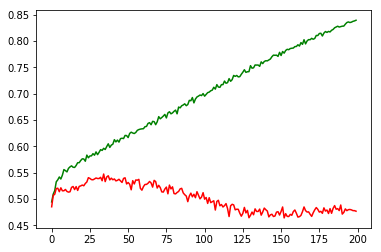

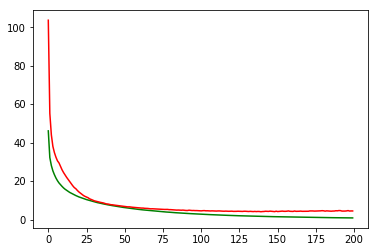

Chart for BEST MODEL FOR: MSFT


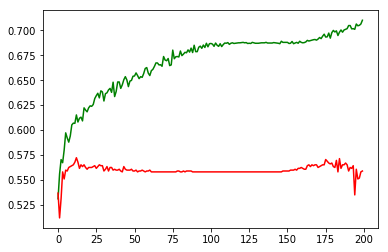

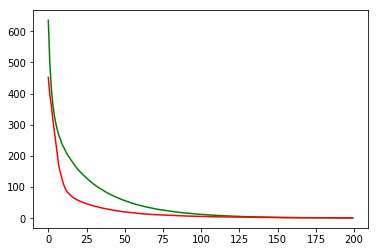

F1,score 0.701923076923077
G-score: 0.28715791875293434
Accuracy 0.5587188622705452
Window: 140
[[ 44 453]
 [ 43 584]]
Vol pos 2.225039812009536
Vol neg 2.3732777948031276
Real Percentage of gain: 11.498083869772609
Percentage of gain: 0.19588898195697252
Total gain: 220.1792157196371
000000000000000000000000000000000000000000000000
Percentile:  0
ecco la somma Positiva: [0.6470688]
ecco la somma Negativa: [0.44146597]
[[ 12 154]
 [ 14 200]]
380/380 [==============================] - 0s 284us/step
[0.8572515776282863, 0.5578947368421052]
Percentile:  1
ecco la somma Positiva: [0.6697431]
ecco la somma Negativa: [0.3899691]
[[  5 133]
 [ 10 229]]
377/377 [==============================] - 0s 356us/step
[0.7951594467820793, 0.6206896551724138]
Percentile:  2
ecco la somma Positiva: [0.62837887]
ecco la somma Negativa: [0.3972603]
[[ 16 119]
 [ 17 110]]
262/262 [==============================] - 0s 366us/step
[0.8969133023087305, 0.48091603053435117]
Percentile:  3
ecco la somma Positiva:

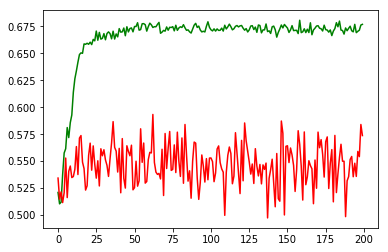

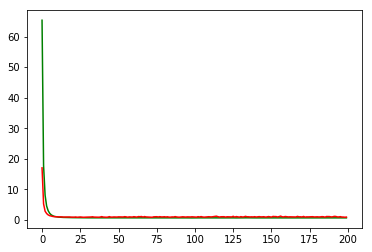

working on d,u and l,learn 0.5 64 0.05 0.001


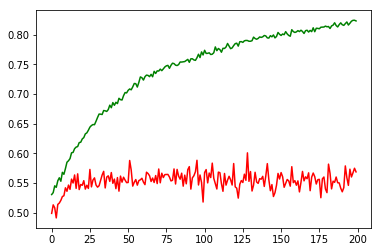

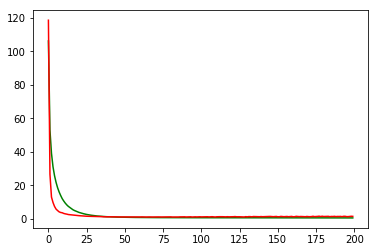

working on d,u and l,learn 0.5 64 0.05 0.0005


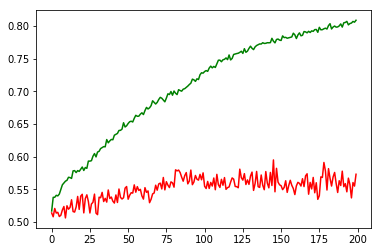

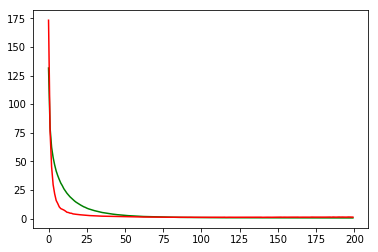

working on d,u and l,learn 0.5 64 0.05 0.0001


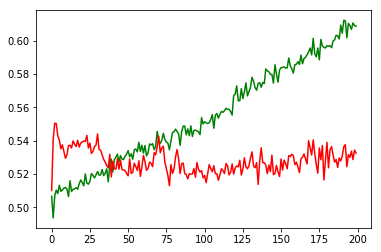

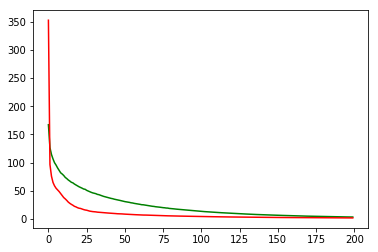

working on d,u and l,learn 0.5 64 0.01 0.005


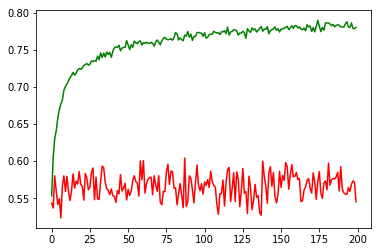

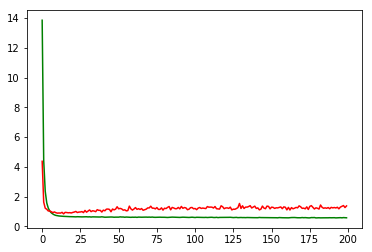

working on d,u and l,learn 0.5 64 0.01 0.001


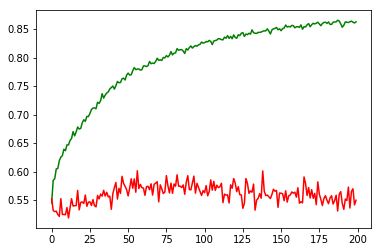

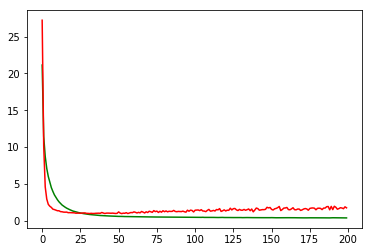

working on d,u and l,learn 0.5 64 0.01 0.0005


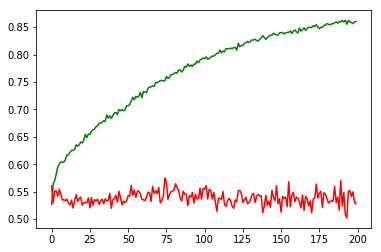

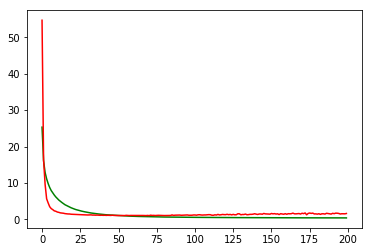

working on d,u and l,learn 0.5 64 0.01 0.0001


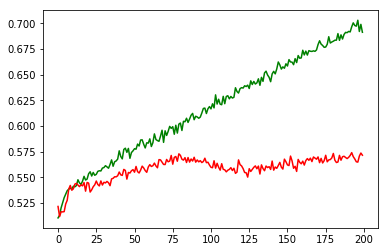

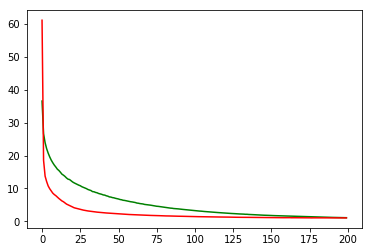

working on d,u and l,learn 0.5 128 0.05 0.005


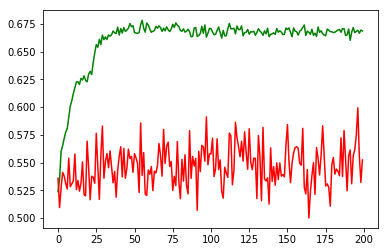

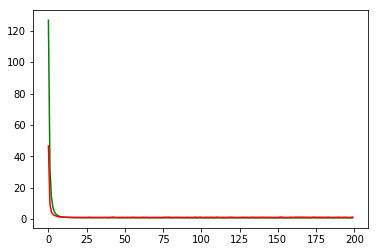

working on d,u and l,learn 0.5 128 0.05 0.001


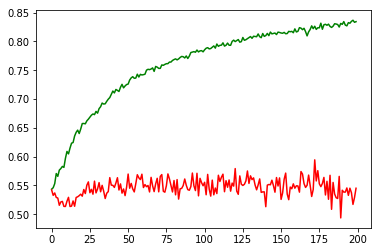

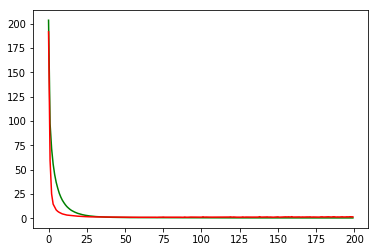

working on d,u and l,learn 0.5 128 0.05 0.0005


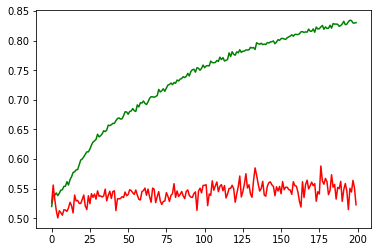

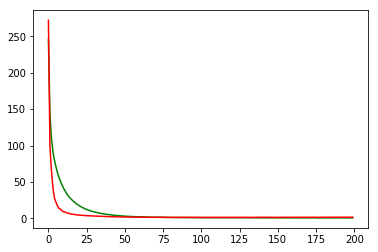

working on d,u and l,learn 0.5 128 0.05 0.0001


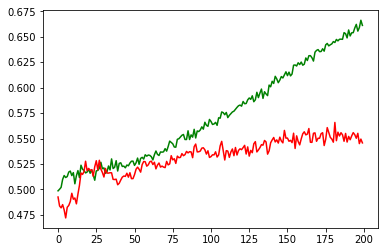

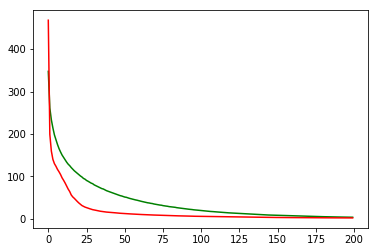

working on d,u and l,learn 0.5 128 0.01 0.005


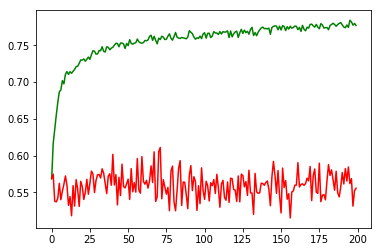

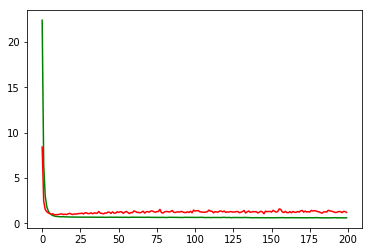

working on d,u and l,learn 0.5 128 0.01 0.001


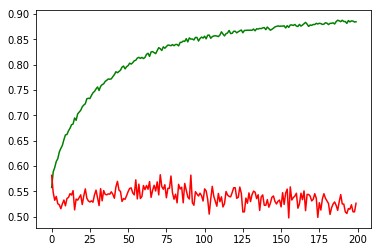

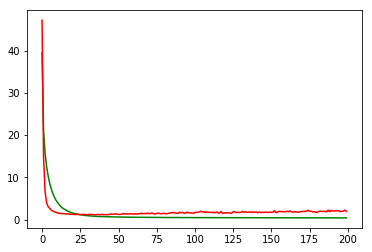

working on d,u and l,learn 0.5 128 0.01 0.0005


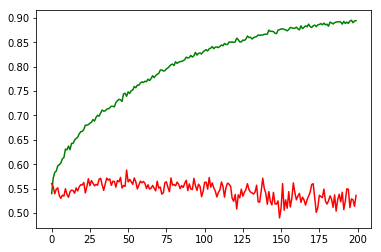

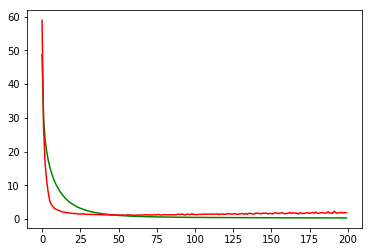

working on d,u and l,learn 0.5 128 0.01 0.0001


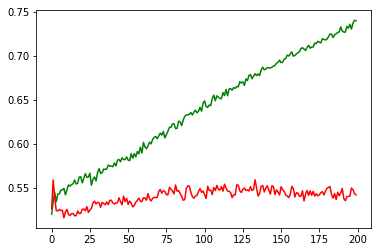

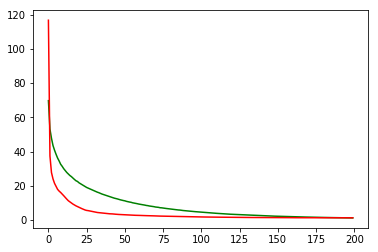

working on d,u and l,learn 0.25 64 0.05 0.005


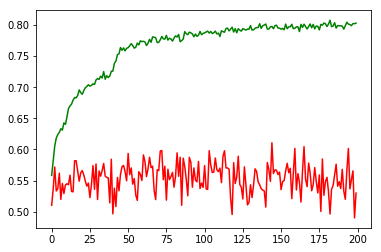

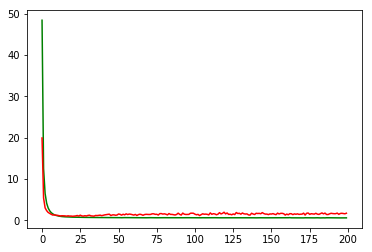

working on d,u and l,learn 0.25 64 0.05 0.001


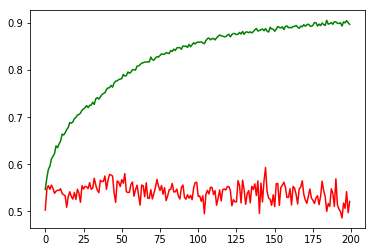

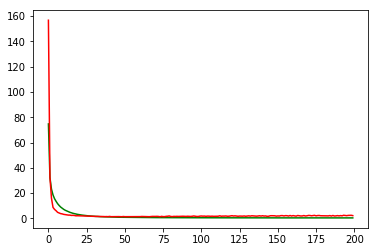

working on d,u and l,learn 0.25 64 0.05 0.0005


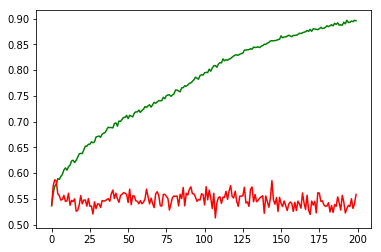

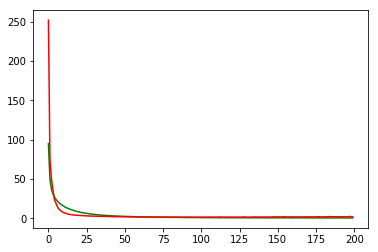

working on d,u and l,learn 0.25 64 0.05 0.0001


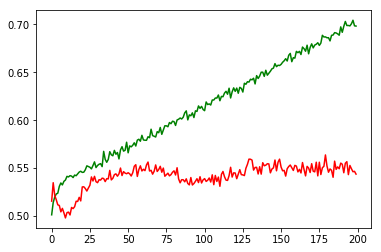

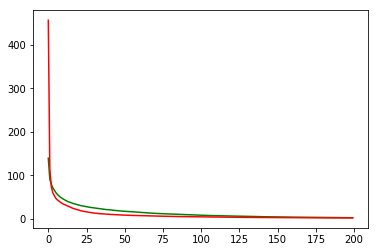

working on d,u and l,learn 0.25 64 0.01 0.005


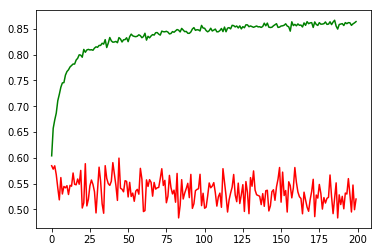

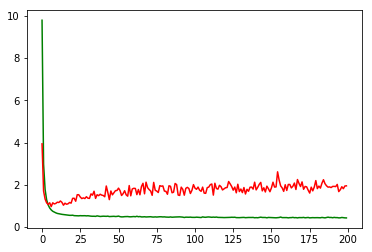

working on d,u and l,learn 0.25 64 0.01 0.001


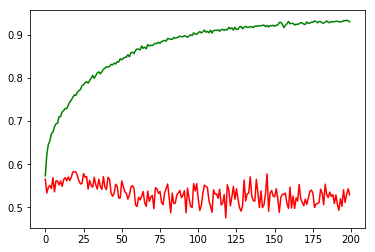

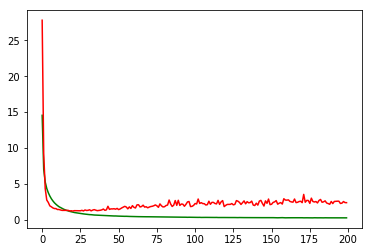

working on d,u and l,learn 0.25 64 0.01 0.0005


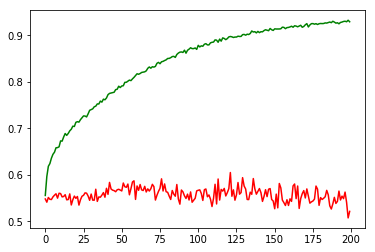

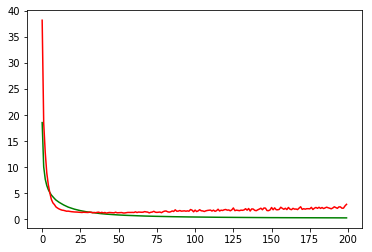

working on d,u and l,learn 0.25 64 0.01 0.0001


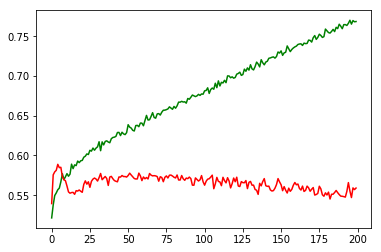

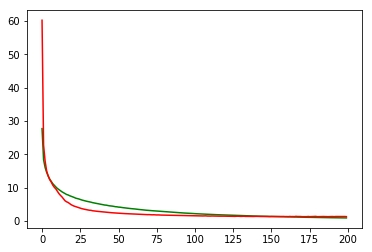

working on d,u and l,learn 0.25 128 0.05 0.005


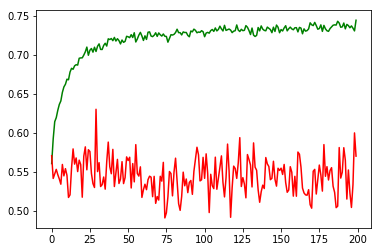

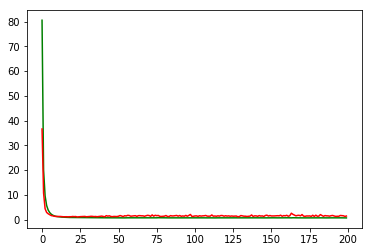

working on d,u and l,learn 0.25 128 0.05 0.001


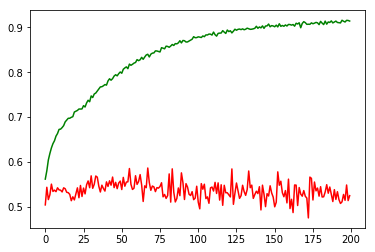

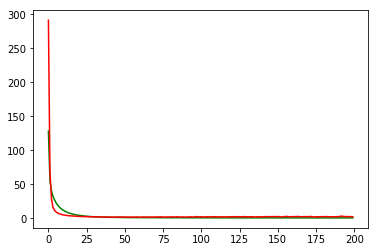

working on d,u and l,learn 0.25 128 0.05 0.0005


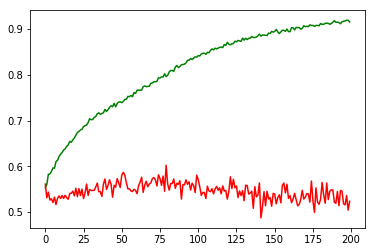

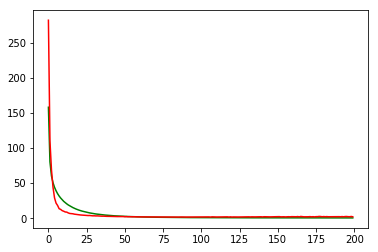

working on d,u and l,learn 0.25 128 0.05 0.0001


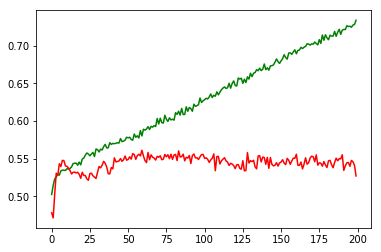

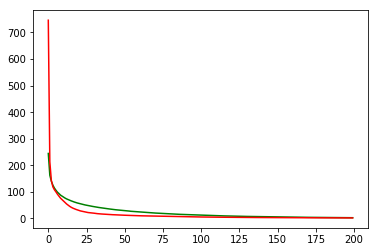

working on d,u and l,learn 0.25 128 0.01 0.005


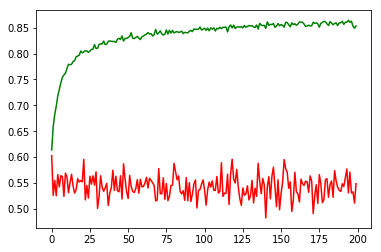

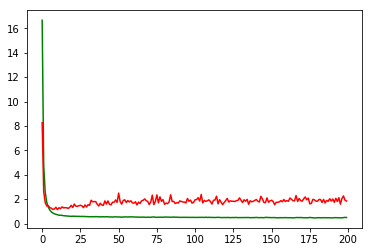

working on d,u and l,learn 0.25 128 0.01 0.001


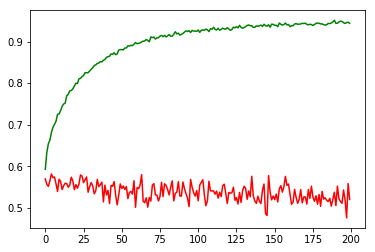

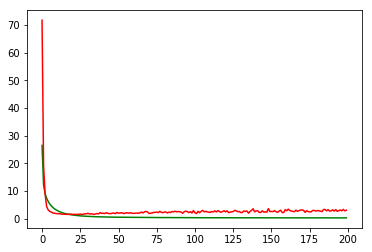

working on d,u and l,learn 0.25 128 0.01 0.0005


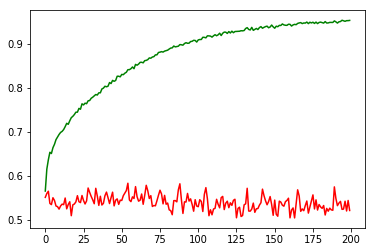

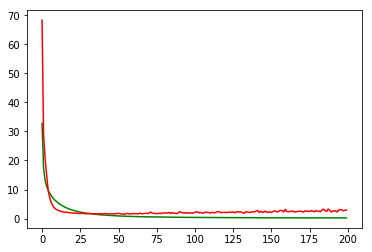

working on d,u and l,learn 0.25 128 0.01 0.0001


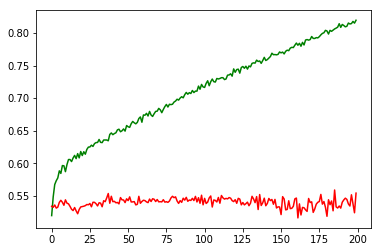

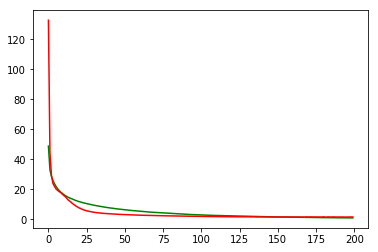

Chart for BEST MODEL FOR: FB


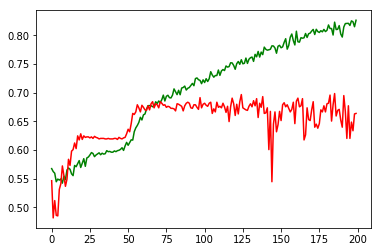

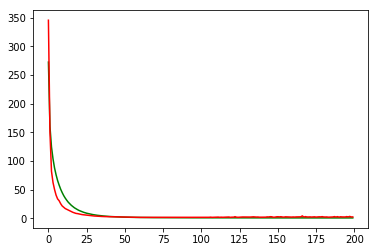

F1,score 0.7628607277289838
G-score: 0.5309590239432772
Accuracy 0.6637010667671936
Window: 140
[[138 289]
 [ 89 608]]
Vol pos 4.394481331654606
Vol neg 4.303944725582533
Real Percentage of gain: 91.19862612545545
Percentage of gain: 1.4692099351816181
Total gain: 1651.3919671441388
000000000000000000000000000000000000000000000000
Percentile:  0
ecco la somma Positiva: [0.94435024]
ecco la somma Negativa: [0.12558371]
[[ 21  79]
 [ 84 297]]
481/481 [==============================] - 0s 308us/step
[1.6209502810004348, 0.6611226611226612]
Percentile:  1
ecco la somma Positiva: [0.9749091]
ecco la somma Negativa: [0.22678943]
[[ 29 118]
 [  5 243]]
395/395 [==============================] - 0s 351us/step
[2.5391022849686538, 0.6886075955403002]
Percentile:  2
ecco la somma Positiva: [0.99922615]
ecco la somma Negativa: [0.2478733]
[[45 72]
 [ 0 43]]
160/160 [==============================] - 0s 387us/step
[2.6381667077541353, 0.55]
Percentile:  3
ecco la somma Positiva: [0.9989264]
ecco l

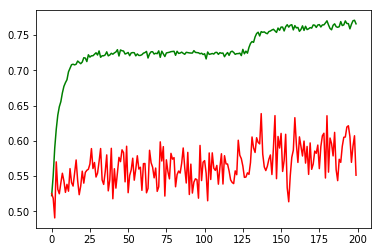

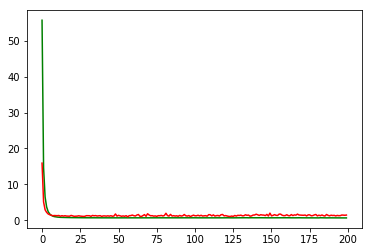

working on d,u and l,learn 0.5 64 0.05 0.001


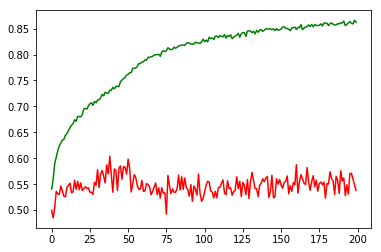

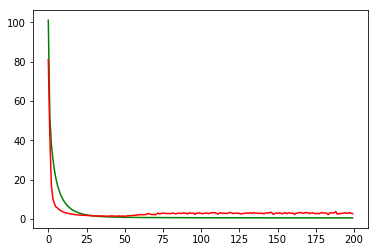

working on d,u and l,learn 0.5 64 0.05 0.0005


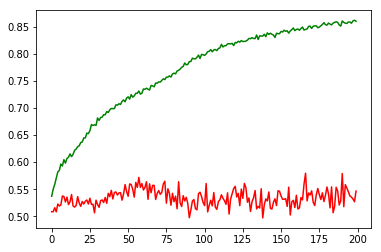

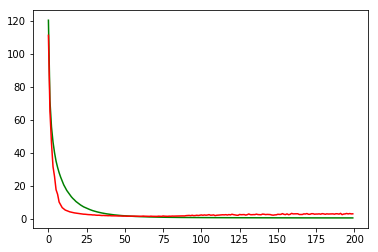

working on d,u and l,learn 0.5 64 0.05 0.0001


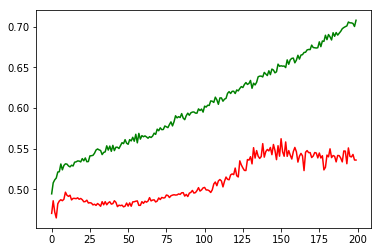

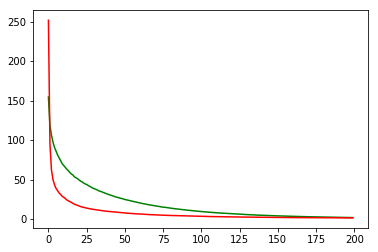

working on d,u and l,learn 0.5 64 0.01 0.005


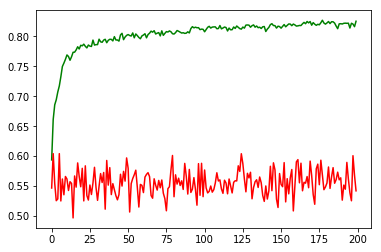

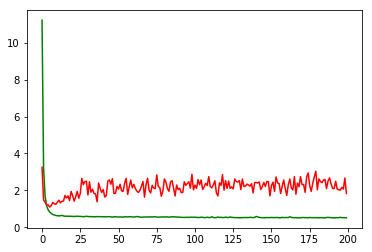

working on d,u and l,learn 0.5 64 0.01 0.001


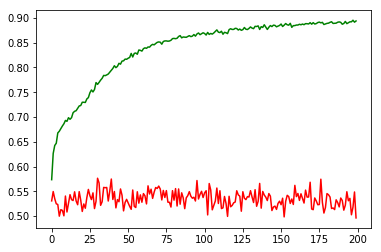

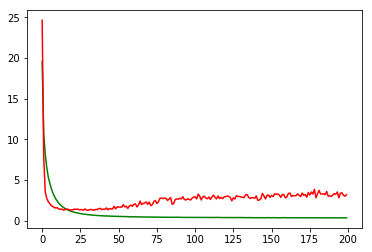

working on d,u and l,learn 0.5 64 0.01 0.0005


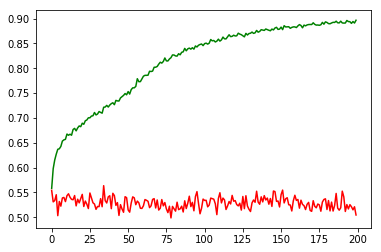

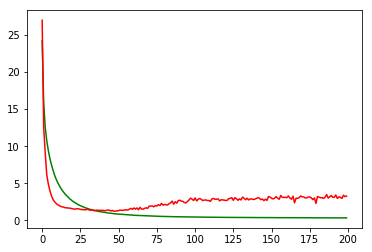

working on d,u and l,learn 0.5 64 0.01 0.0001


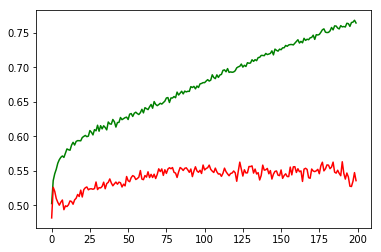

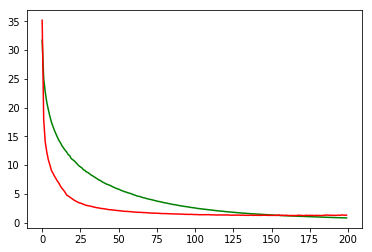

working on d,u and l,learn 0.5 128 0.05 0.005


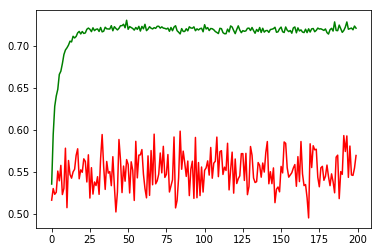

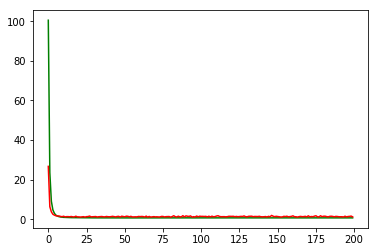

working on d,u and l,learn 0.5 128 0.05 0.001


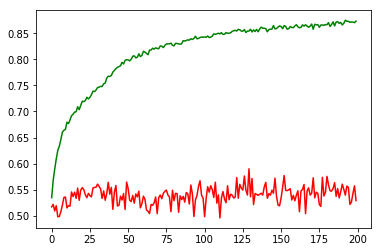

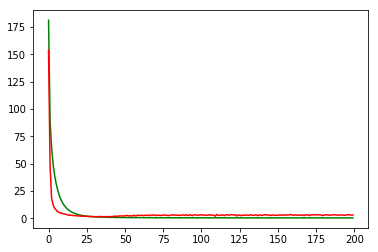

working on d,u and l,learn 0.5 128 0.05 0.0005


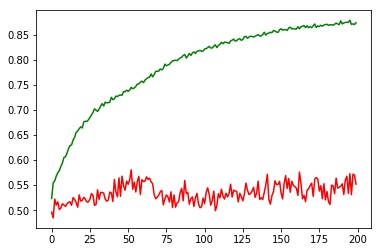

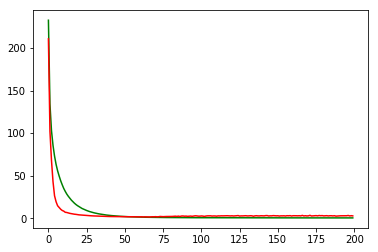

working on d,u and l,learn 0.5 128 0.05 0.0001


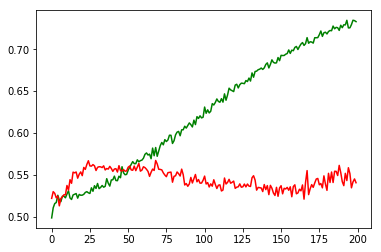

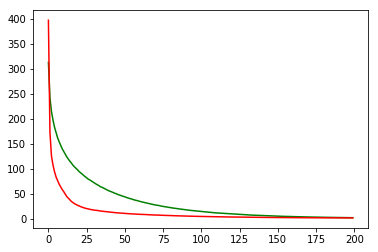

working on d,u and l,learn 0.5 128 0.01 0.005


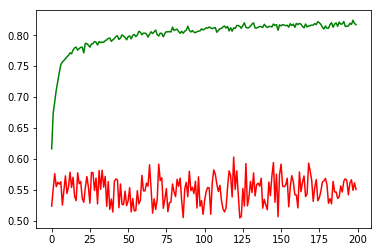

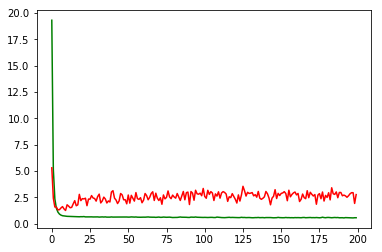

working on d,u and l,learn 0.5 128 0.01 0.001


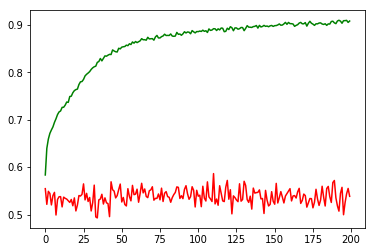

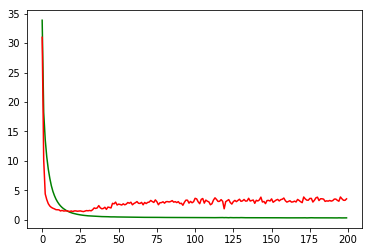

working on d,u and l,learn 0.5 128 0.01 0.0005


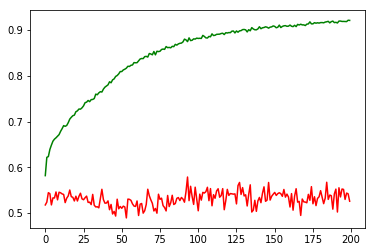

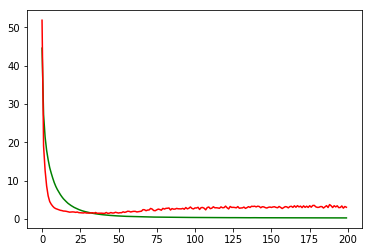

working on d,u and l,learn 0.5 128 0.01 0.0001


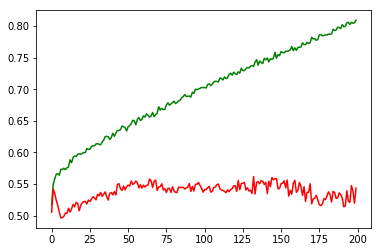

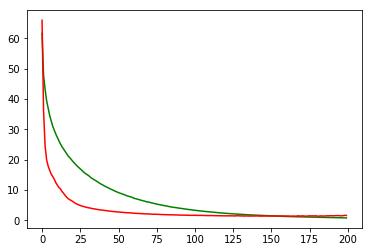

working on d,u and l,learn 0.25 64 0.05 0.005


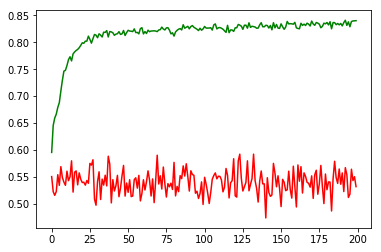

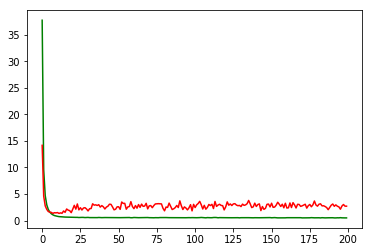

working on d,u and l,learn 0.25 64 0.05 0.001


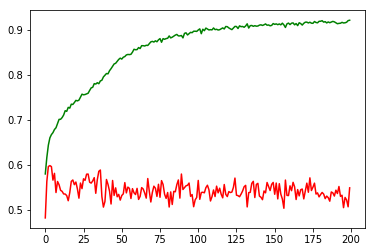

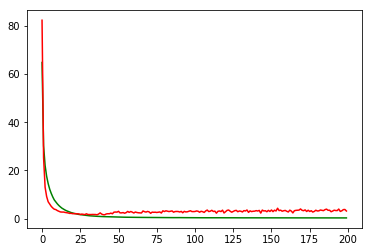

working on d,u and l,learn 0.25 64 0.05 0.0005


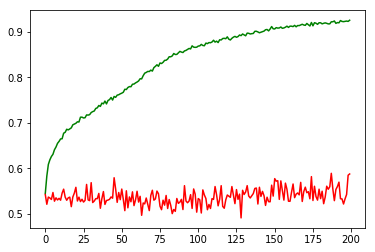

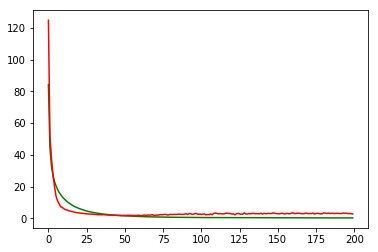

working on d,u and l,learn 0.25 64 0.05 0.0001


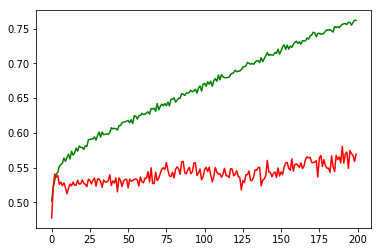

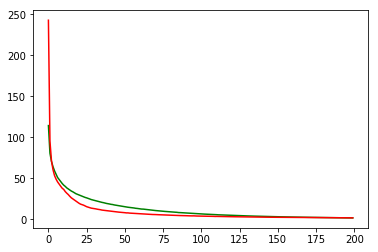

working on d,u and l,learn 0.25 64 0.01 0.005


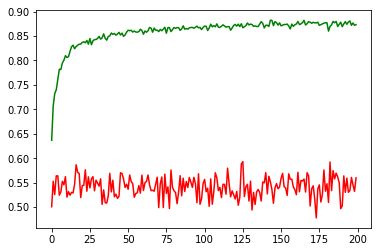

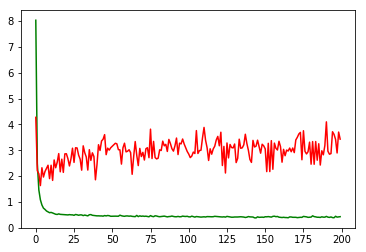

working on d,u and l,learn 0.25 64 0.01 0.001


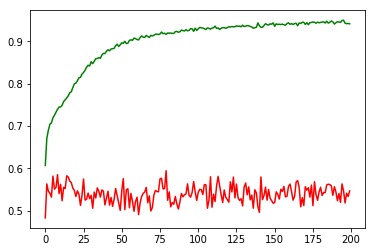

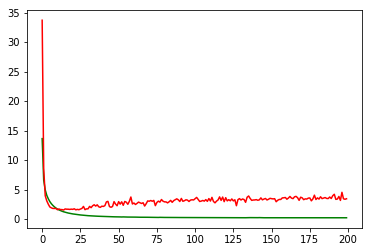

working on d,u and l,learn 0.25 64 0.01 0.0005


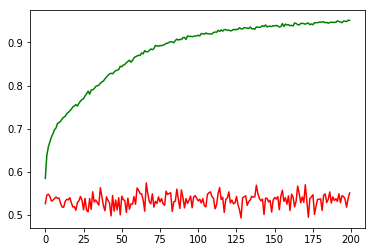

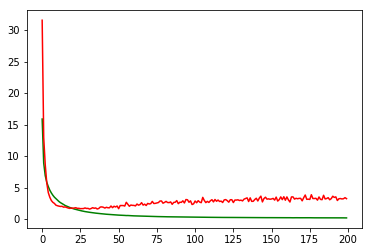

working on d,u and l,learn 0.25 64 0.01 0.0001


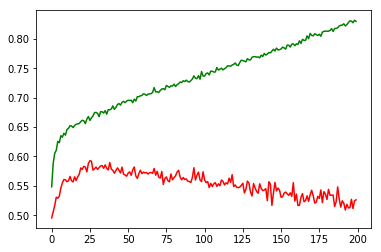

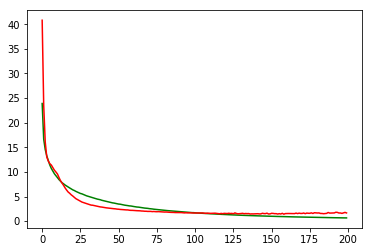

working on d,u and l,learn 0.25 128 0.05 0.005


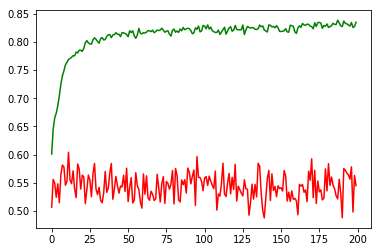

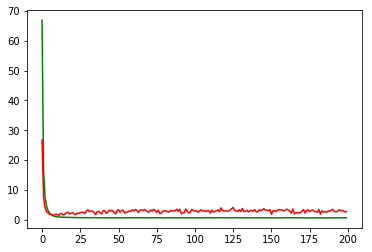

working on d,u and l,learn 0.25 128 0.05 0.001


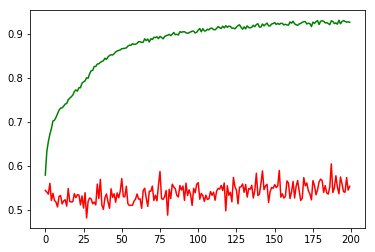

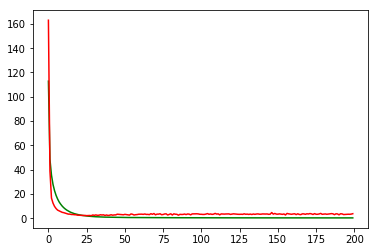

working on d,u and l,learn 0.25 128 0.05 0.0005


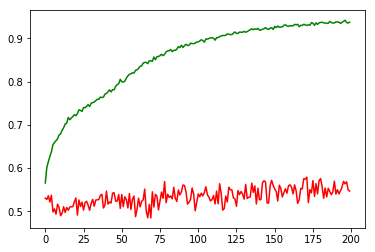

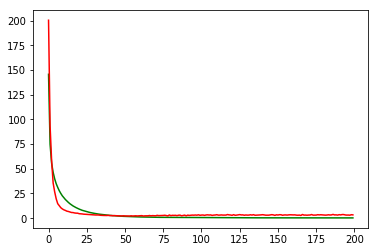

working on d,u and l,learn 0.25 128 0.05 0.0001


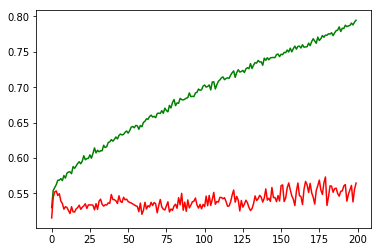

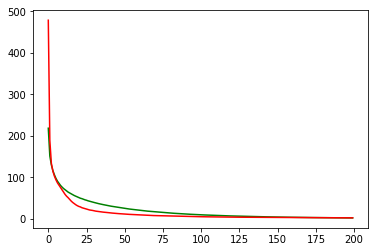

working on d,u and l,learn 0.25 128 0.01 0.005


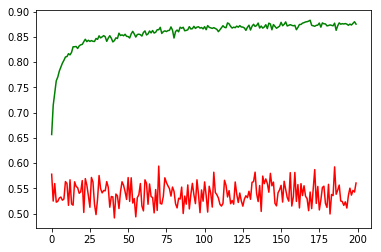

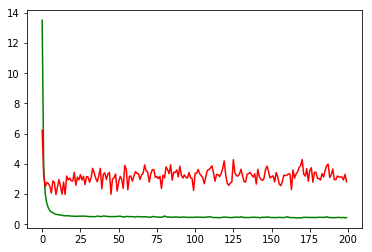

working on d,u and l,learn 0.25 128 0.01 0.001


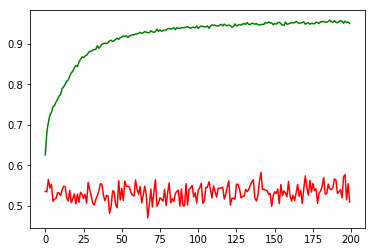

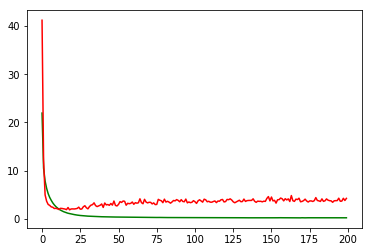

working on d,u and l,learn 0.25 128 0.01 0.0005


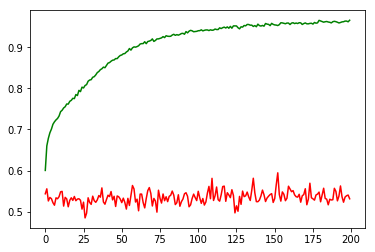

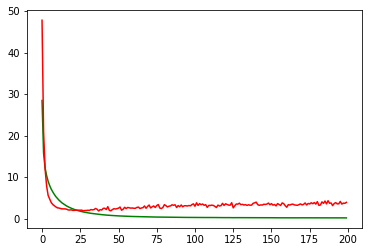

working on d,u and l,learn 0.25 128 0.01 0.0001


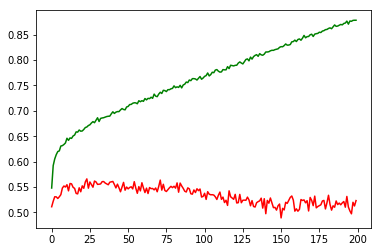

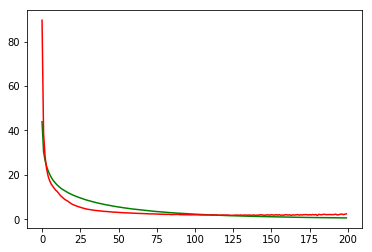

Chart for BEST MODEL FOR: INTC


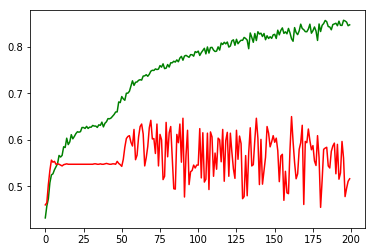

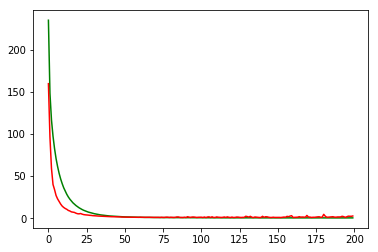

F1,score 0.21645021645021642
G-score: 0.3481207080774446
Accuracy 0.5160427797393153
Window: 140
[[504   4]
 [539  75]]
Vol pos 2.3528156497030084
Vol neg 2.9234650684404313
Real Percentage of gain: 123.22074853041109
Percentage of gain: -0.20067849463913764
Total gain: -225.16127098511242
000000000000000000000000000000000000000000000000
Percentile:  0
ecco la somma Positiva: [0.6837931]
ecco la somma Negativa: [0.02207653]
[[251   4]
 [175  20]]
450/450 [==============================] - 0s 572us/step
[2.3262875027126735, 0.6022222222222222]
Percentile:  1
ecco la somma Positiva: [0.8541806]
ecco la somma Negativa: [0.0190672]
[[131   0]
 [145  38]]
314/314 [==============================] - 0s 578us/step
[2.9034022328200613, 0.5382165605570101]
Percentile:  2
ecco la somma Positiva: [0.76294476]
ecco la somma Negativa: [0.01123009]
[[ 80   0]
 [147  11]]
238/238 [==============================] - 0s 563us/step
[2.7693178874103963, 0.3823529414269103]
Percentile:  3
ecco la somma Posi

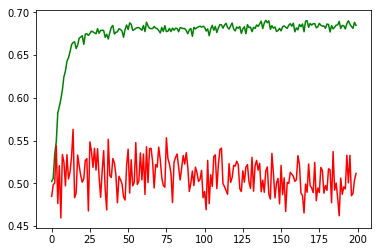

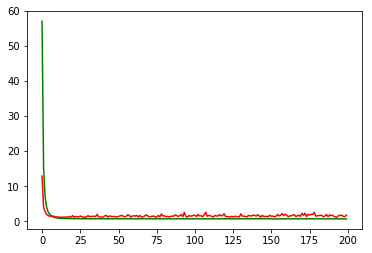

working on d,u and l,learn 0.5 64 0.05 0.001


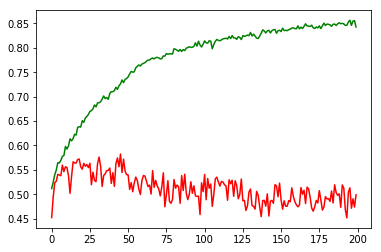

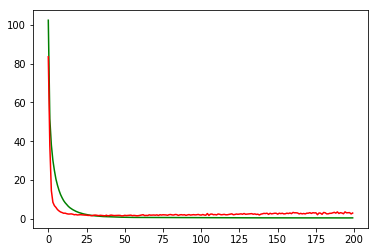

working on d,u and l,learn 0.5 64 0.05 0.0005


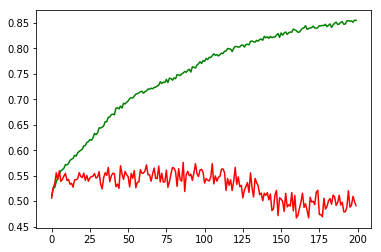

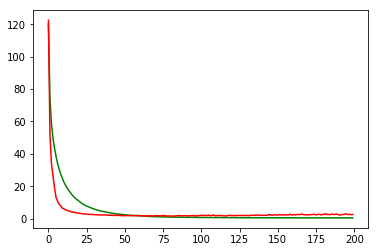

working on d,u and l,learn 0.5 64 0.05 0.0001


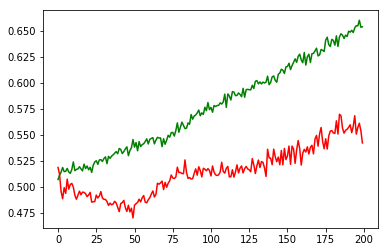

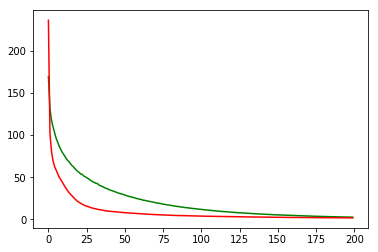

working on d,u and l,learn 0.5 64 0.01 0.005


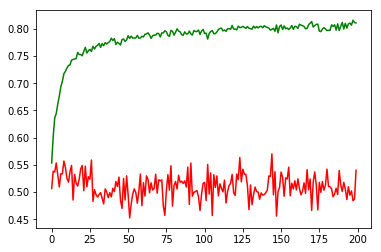

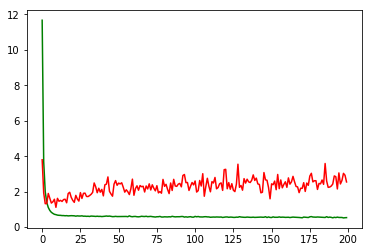

working on d,u and l,learn 0.5 64 0.01 0.001


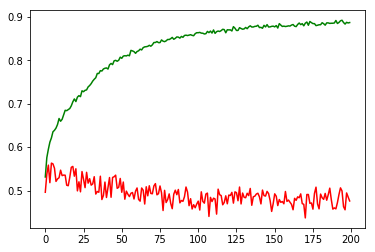

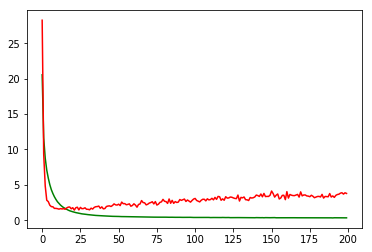

working on d,u and l,learn 0.5 64 0.01 0.0005


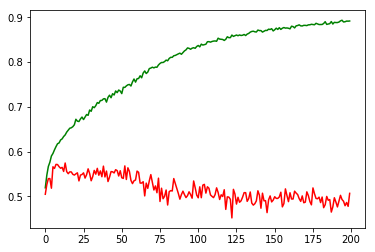

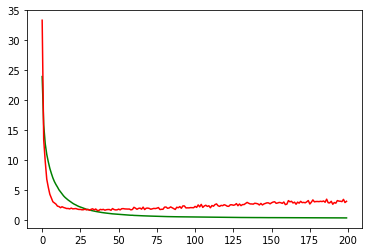

working on d,u and l,learn 0.5 64 0.01 0.0001


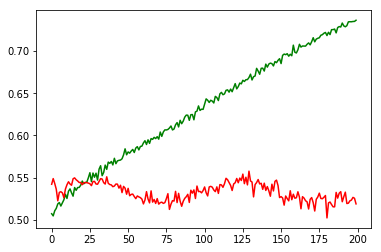

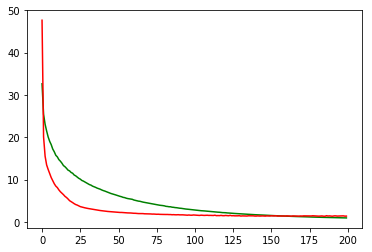

working on d,u and l,learn 0.5 128 0.05 0.005


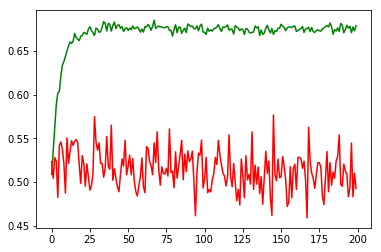

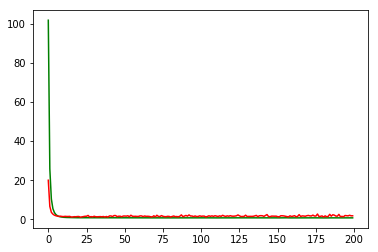

working on d,u and l,learn 0.5 128 0.05 0.001


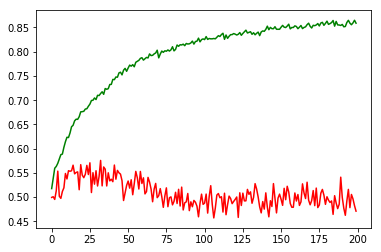

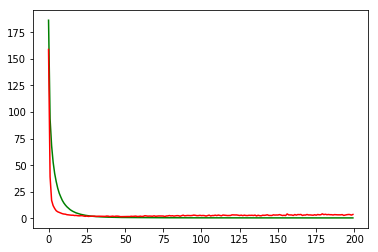

working on d,u and l,learn 0.5 128 0.05 0.0005


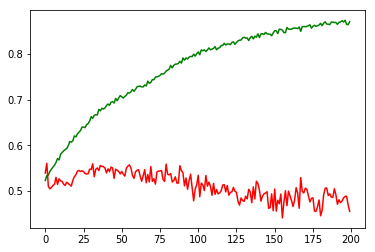

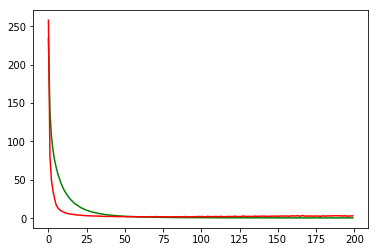

working on d,u and l,learn 0.5 128 0.05 0.0001


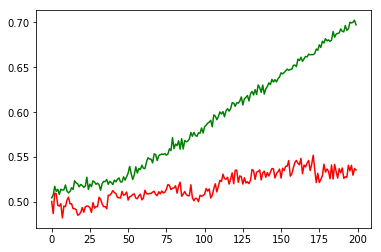

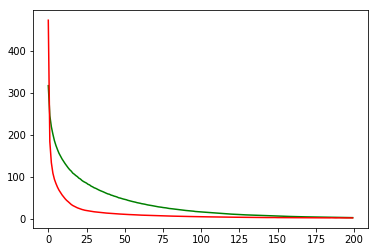

working on d,u and l,learn 0.5 128 0.01 0.005


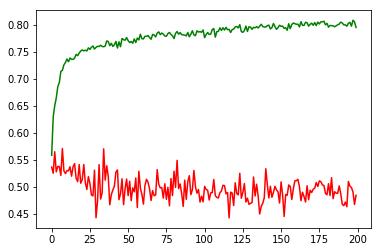

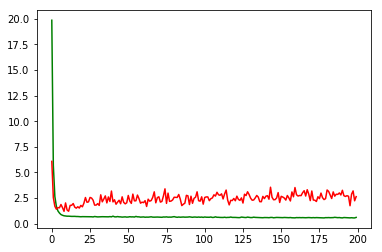

working on d,u and l,learn 0.5 128 0.01 0.001


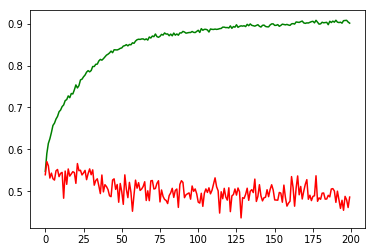

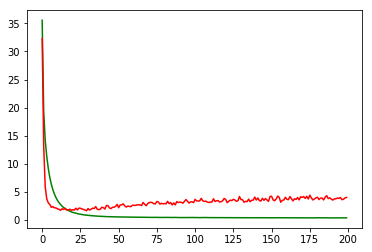

working on d,u and l,learn 0.5 128 0.01 0.0005


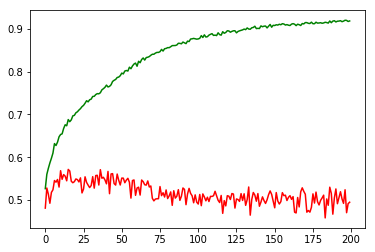

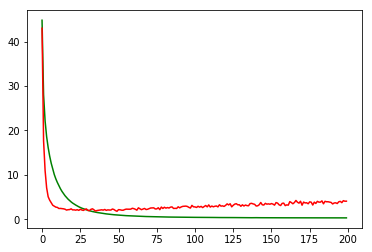

working on d,u and l,learn 0.5 128 0.01 0.0001


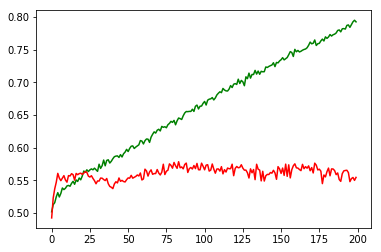

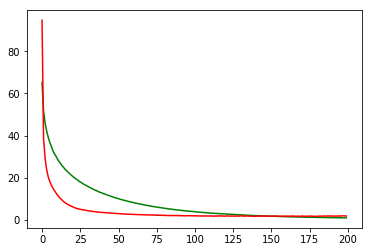

working on d,u and l,learn 0.25 64 0.05 0.005


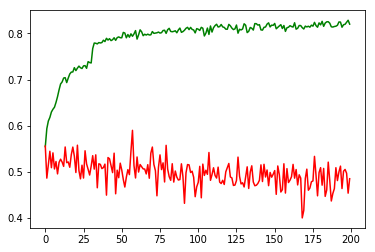

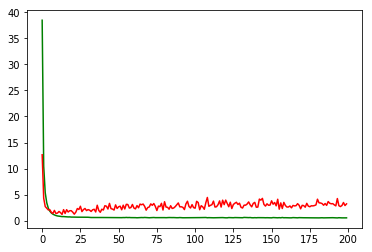

working on d,u and l,learn 0.25 64 0.05 0.001


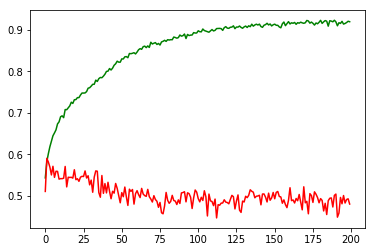

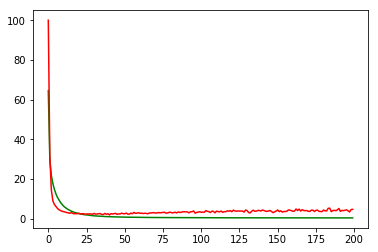

working on d,u and l,learn 0.25 64 0.05 0.0005


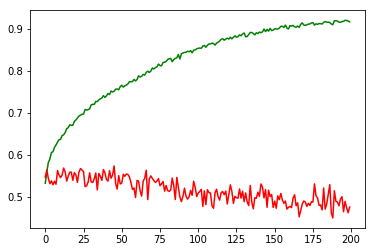

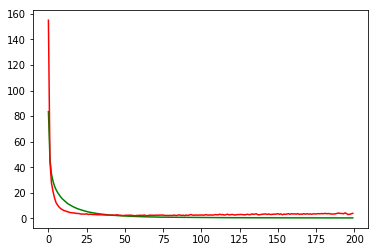

working on d,u and l,learn 0.25 64 0.05 0.0001


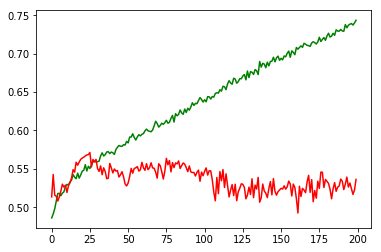

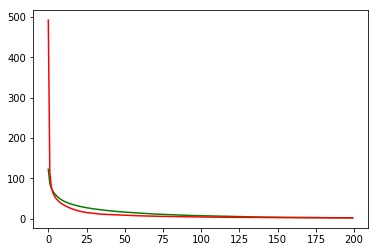

working on d,u and l,learn 0.25 64 0.01 0.005


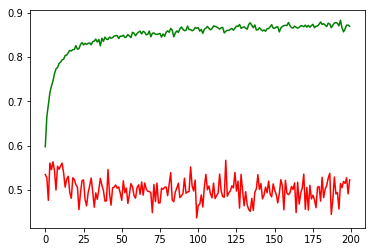

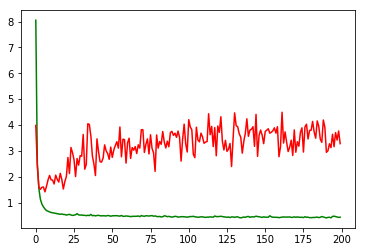

working on d,u and l,learn 0.25 64 0.01 0.001


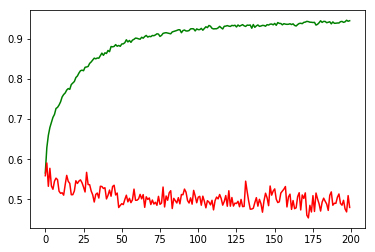

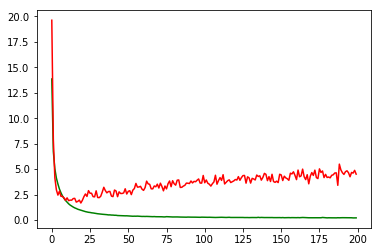

working on d,u and l,learn 0.25 64 0.01 0.0005


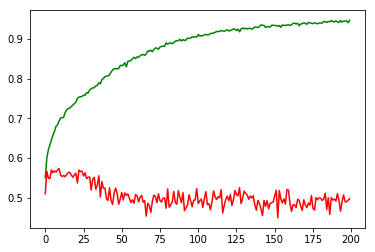

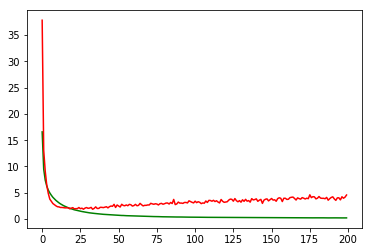

working on d,u and l,learn 0.25 64 0.01 0.0001


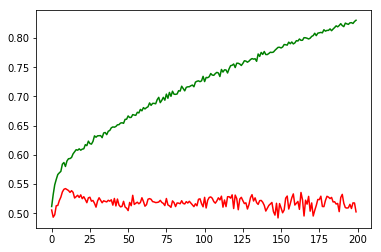

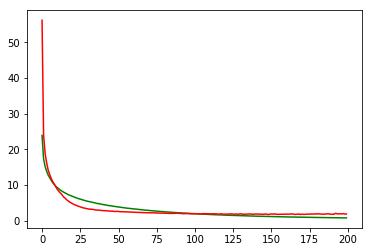

working on d,u and l,learn 0.25 128 0.05 0.005


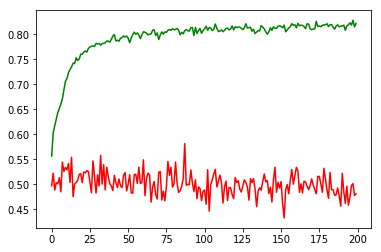

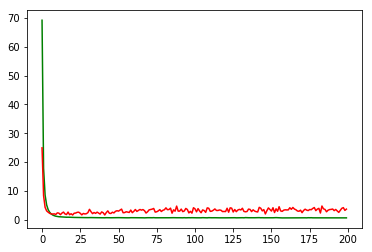

working on d,u and l,learn 0.25 128 0.05 0.001


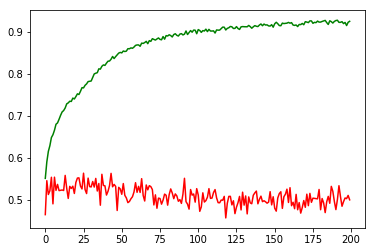

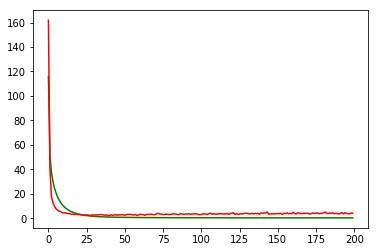

working on d,u and l,learn 0.25 128 0.05 0.0005


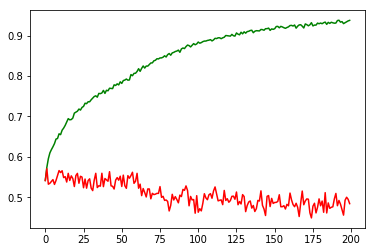

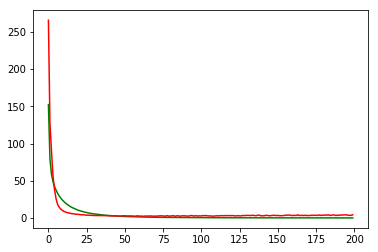

working on d,u and l,learn 0.25 128 0.05 0.0001


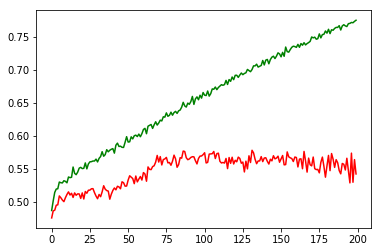

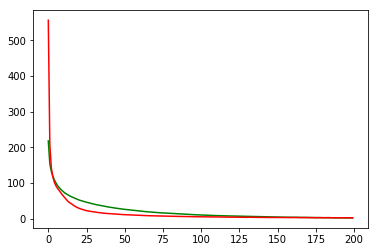

working on d,u and l,learn 0.25 128 0.01 0.005


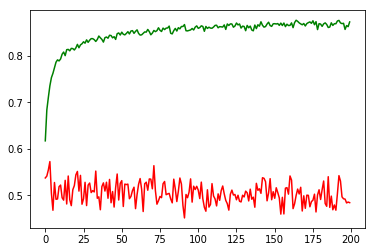

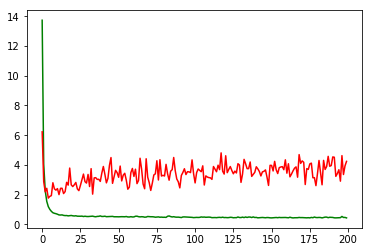

working on d,u and l,learn 0.25 128 0.01 0.001


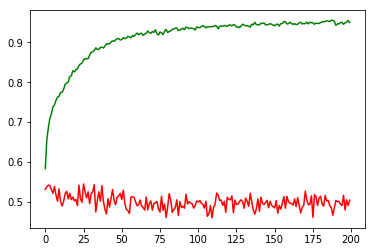

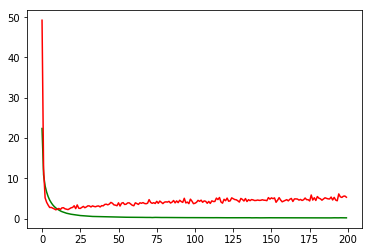

working on d,u and l,learn 0.25 128 0.01 0.0005


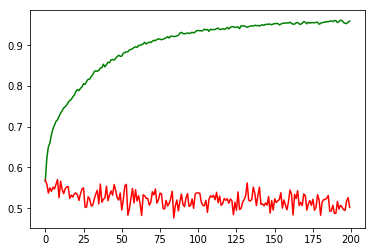

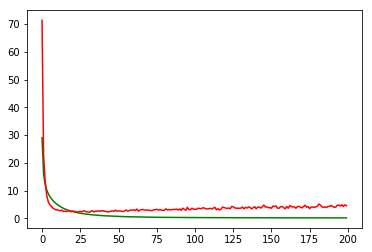

working on d,u and l,learn 0.25 128 0.01 0.0001


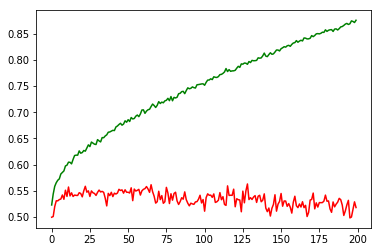

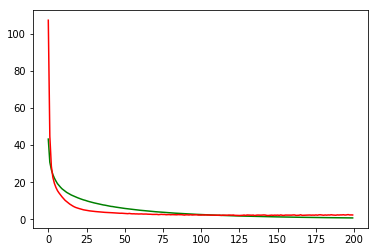

Chart for BEST MODEL FOR: CSCO


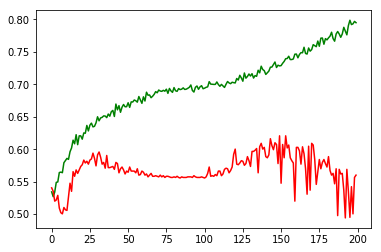

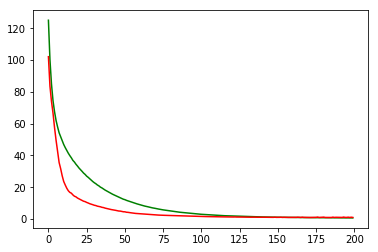

F1,score 0.6404657933042213
G-score: 0.5168952726535292
Accuracy 0.5601068558378721
Window: 140
[[189 309]
 [185 440]]
Vol pos 2.9066055883786697
Vol neg 2.930597231287812
Real Percentage of gain: 42.90737268374623
Percentage of gain: 0.33886009157079605
Total gain: 380.53988283400395
000000000000000000000000000000000000000000000000
Percentile:  0
ecco la somma Positiva: [0.7700776]
ecco la somma Negativa: [0.3280354]
[[ 53 100]
 [ 43 107]]
303/303 [==============================] - 0s 725us/step
[0.9331141764377997, 0.528052805870673]
Percentile:  1
ecco la somma Positiva: [0.6888837]
ecco la somma Negativa: [0.37166914]
[[ 67  98]
 [ 91 219]]
475/475 [==============================] - 0s 773us/step
[0.779680002488588, 0.6021052624677357]
Percentile:  2
ecco la somma Positiva: [0.65952855]
ecco la somma Negativa: [0.28754935]
[[ 44  80]
 [ 44 100]]
268/268 [==============================] - 0s 818us/step
[0.8615998776990976, 0.5373134328358209]
Percentile:  3
ecco la somma Positiva: [

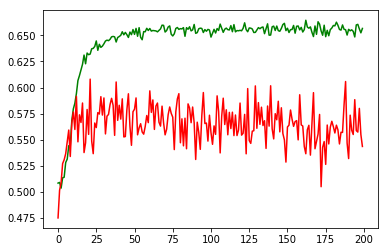

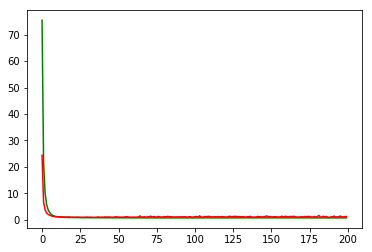

working on d,u and l,learn 0.5 64 0.05 0.001


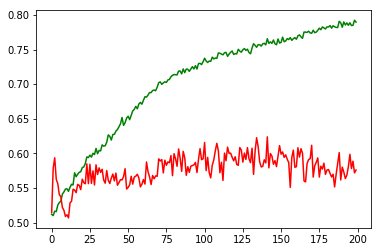

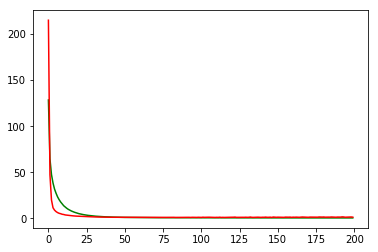

working on d,u and l,learn 0.5 64 0.05 0.0005


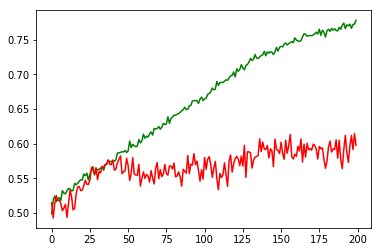

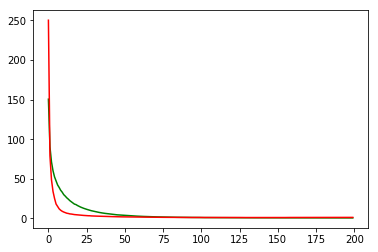

working on d,u and l,learn 0.5 64 0.05 0.0001


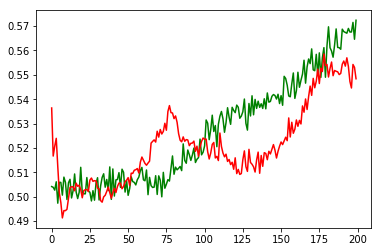

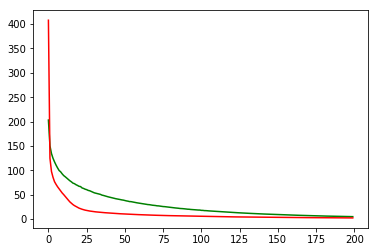

working on d,u and l,learn 0.5 64 0.01 0.005


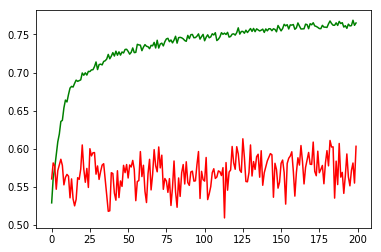

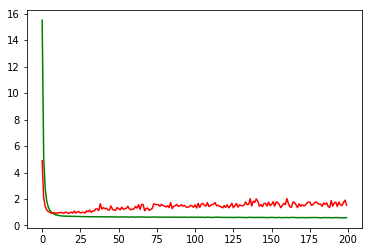

working on d,u and l,learn 0.5 64 0.01 0.001


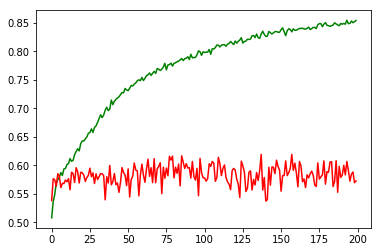

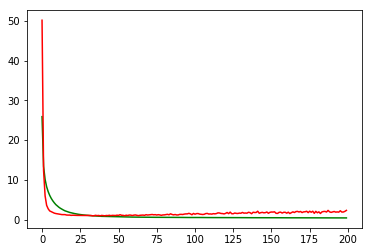

working on d,u and l,learn 0.5 64 0.01 0.0005


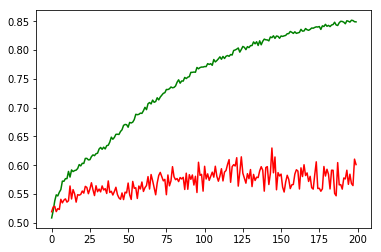

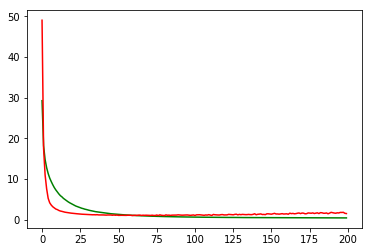

working on d,u and l,learn 0.5 64 0.01 0.0001


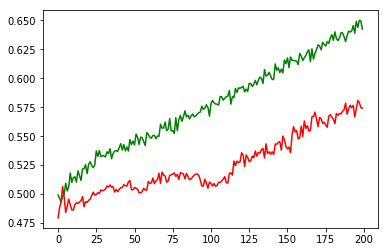

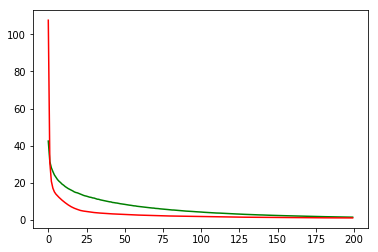

working on d,u and l,learn 0.5 128 0.05 0.005


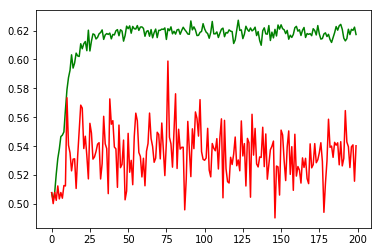

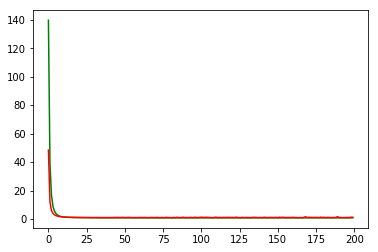

working on d,u and l,learn 0.5 128 0.05 0.001


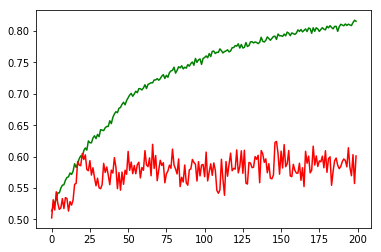

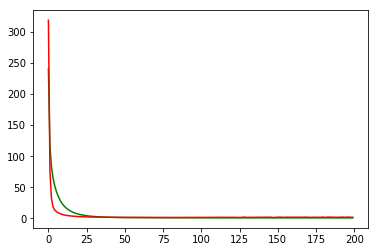

working on d,u and l,learn 0.5 128 0.05 0.0005


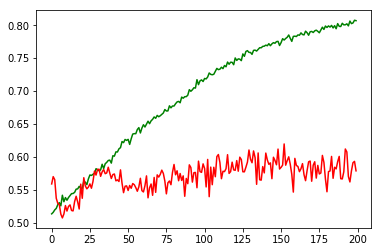

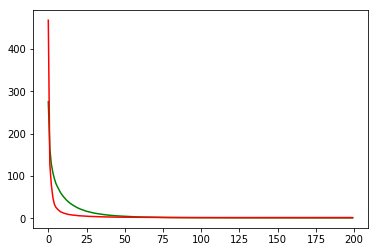

working on d,u and l,learn 0.5 128 0.05 0.0001


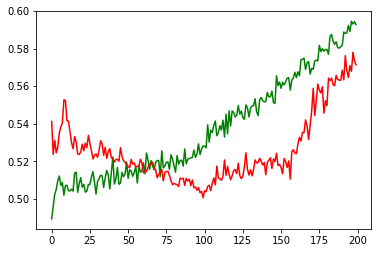

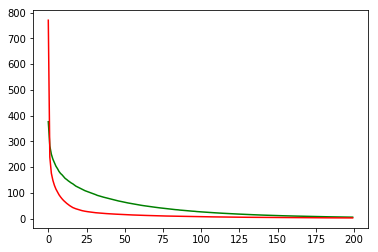

working on d,u and l,learn 0.5 128 0.01 0.005


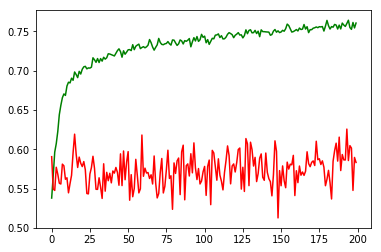

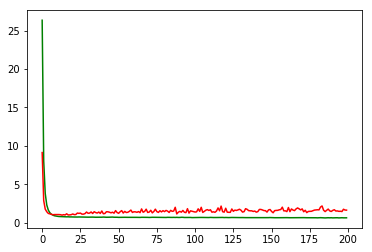

working on d,u and l,learn 0.5 128 0.01 0.001


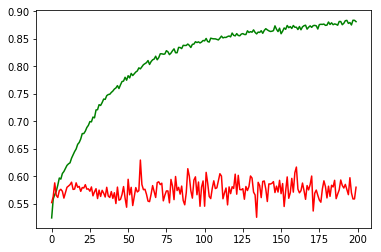

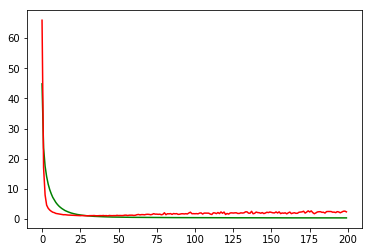

working on d,u and l,learn 0.5 128 0.01 0.0005


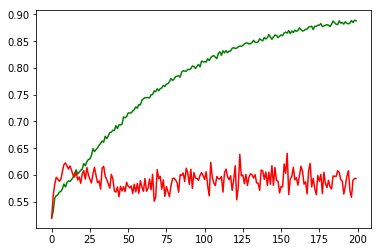

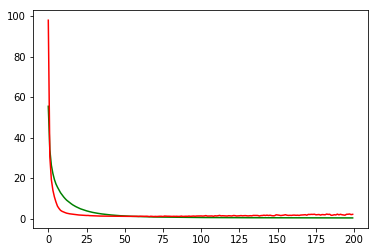

working on d,u and l,learn 0.5 128 0.01 0.0001


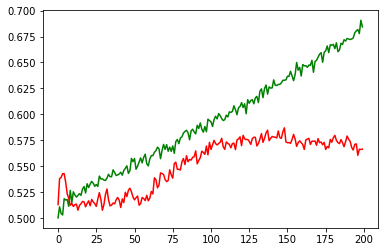

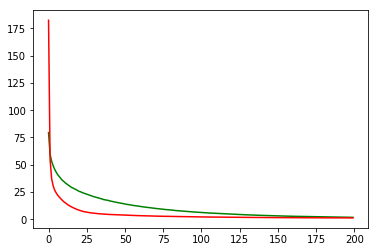

working on d,u and l,learn 0.25 64 0.05 0.005


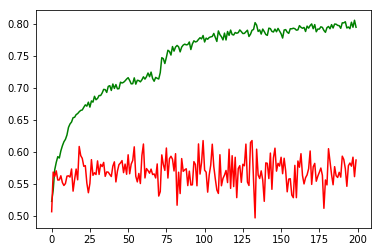

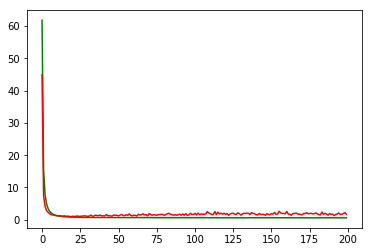

working on d,u and l,learn 0.25 64 0.05 0.001


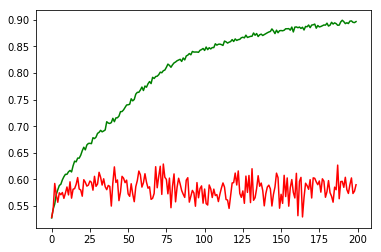

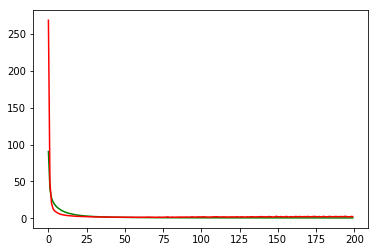

working on d,u and l,learn 0.25 64 0.05 0.0005


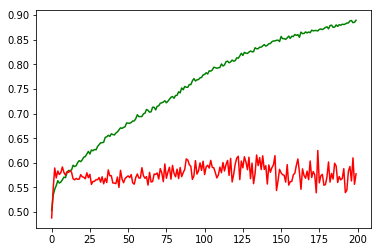

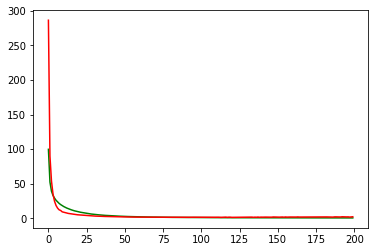

working on d,u and l,learn 0.25 64 0.05 0.0001


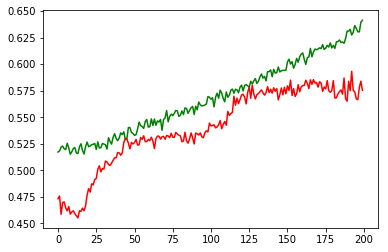

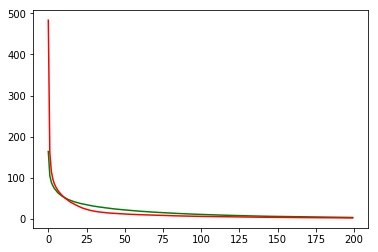

working on d,u and l,learn 0.25 64 0.01 0.005


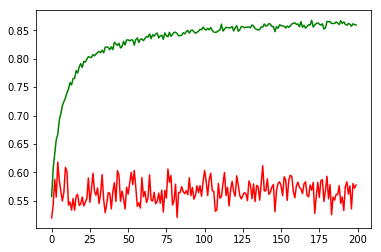

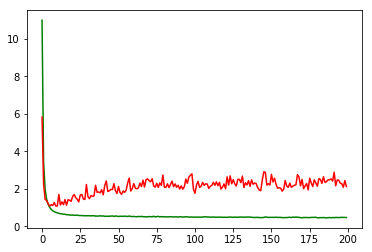

working on d,u and l,learn 0.25 64 0.01 0.001


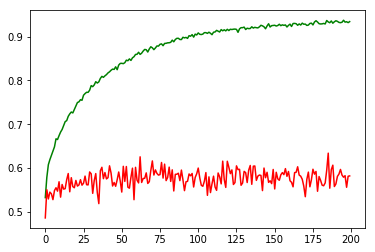

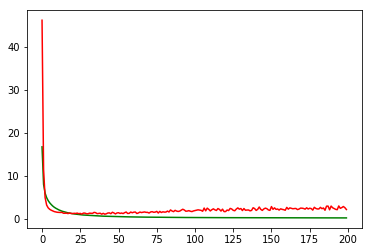

working on d,u and l,learn 0.25 64 0.01 0.0005


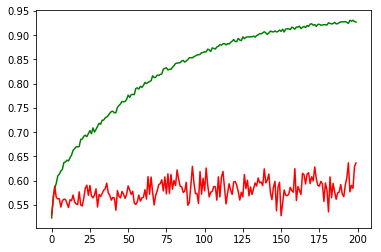

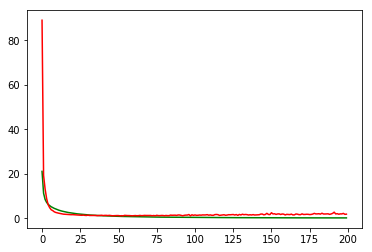

working on d,u and l,learn 0.25 64 0.01 0.0001


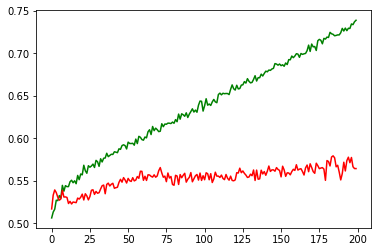

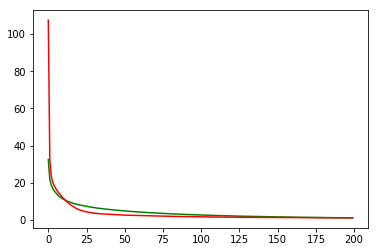

working on d,u and l,learn 0.25 128 0.05 0.005


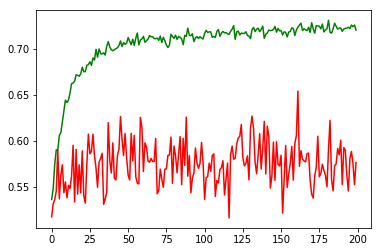

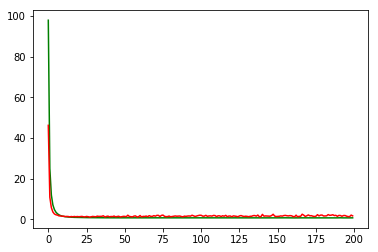

working on d,u and l,learn 0.25 128 0.05 0.001


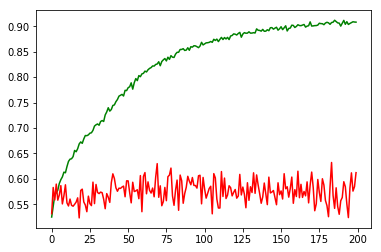

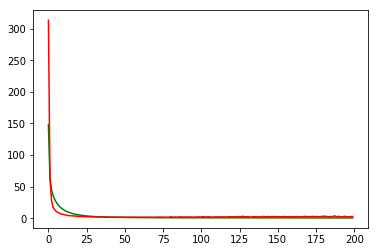

working on d,u and l,learn 0.25 128 0.05 0.0005


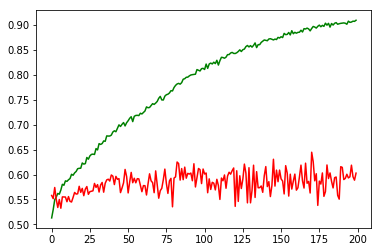

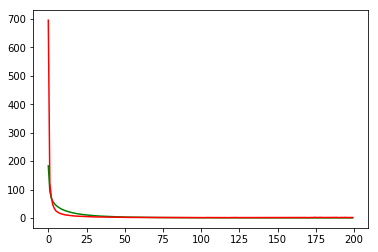

working on d,u and l,learn 0.25 128 0.05 0.0001


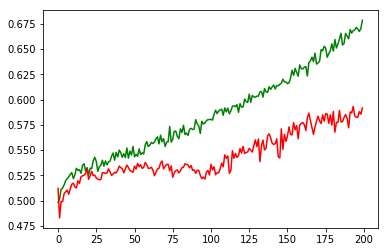

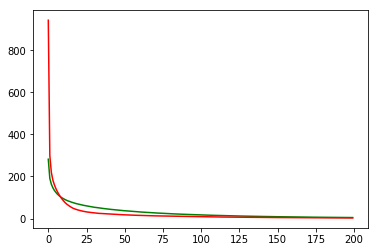

working on d,u and l,learn 0.25 128 0.01 0.005


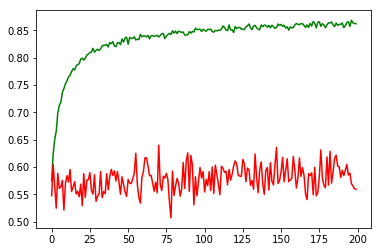

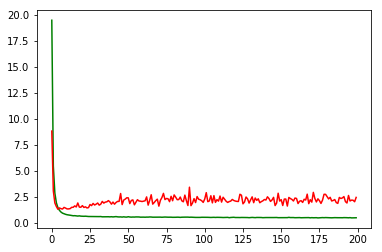

working on d,u and l,learn 0.25 128 0.01 0.001


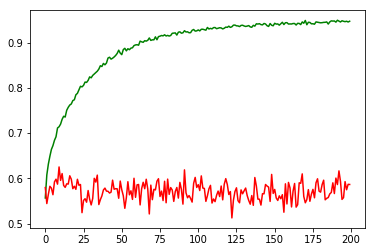

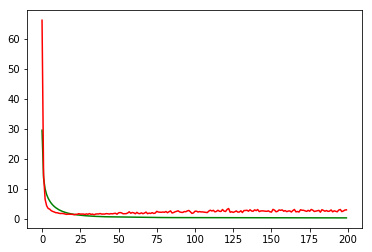

working on d,u and l,learn 0.25 128 0.01 0.0005


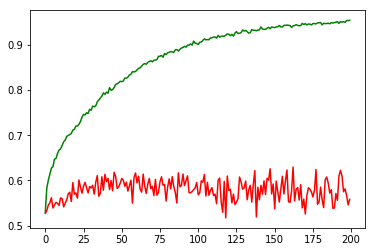

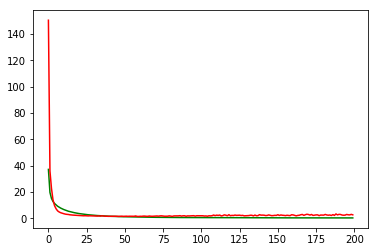

working on d,u and l,learn 0.25 128 0.01 0.0001


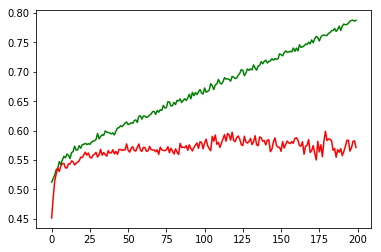

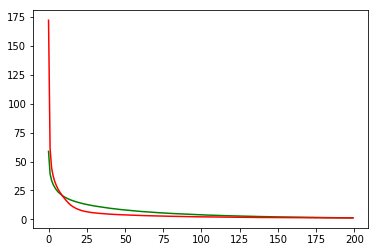

Chart for BEST MODEL FOR: CMCSA


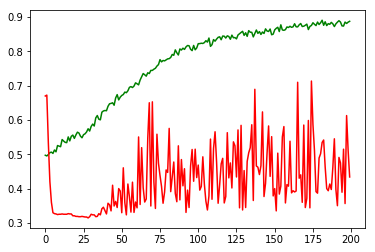

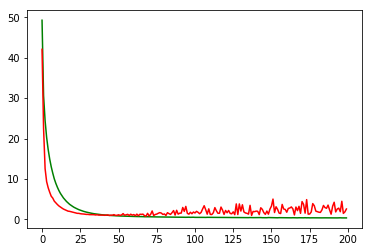

F1,score 0.5218045112781955
G-score: 0.41936239765375666
Accuracy 0.43416370202213844
Window: 140
[[141 615]
 [ 21 347]]
Vol pos 2.482336020033493
Vol neg 3.2004445597785334
Real Percentage of gain: -94.2085427135678
Percentage of gain: -0.733187510892173
Total gain: -824.1027622428026
000000000000000000000000000000000000000000000000
Percentile:  0
ecco la somma Positiva: [0.96502584]
ecco la somma Negativa: [0.26887333]
[[ 23 246]
 [ 13 268]]
550/550 [==============================] - 1s 1ms/step
[2.3775657857548107, 0.5290909090909091]
Percentile:  1
ecco la somma Positiva: [0.95034873]
ecco la somma Negativa: [0.15346694]
[[ 42 174]
 [  8  74]]
298/298 [==============================] - 0s 1ms/step
[2.6252780352662874, 0.38926174496644295]
Percentile:  2
ecco la somma Positiva: [0.99999195]
ecco la somma Negativa: [0.19841537]
[[ 17 115]
 [  0   3]]
135/135 [==============================] - 0s 1ms/step
[2.9985935034575286, 0.14814814836890608]
Percentile:  3
ecco la somma Negativa:

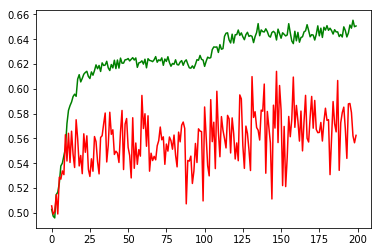

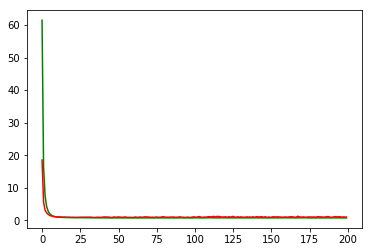

working on d,u and l,learn 0.5 64 0.05 0.001


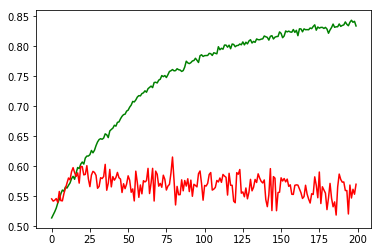

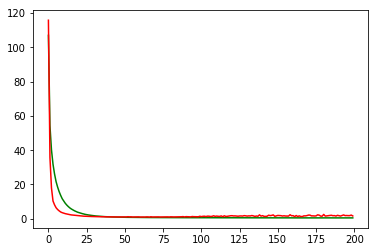

working on d,u and l,learn 0.5 64 0.05 0.0005


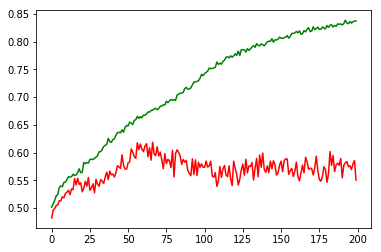

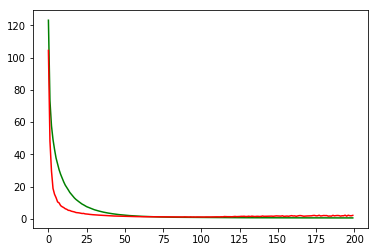

working on d,u and l,learn 0.5 64 0.05 0.0001


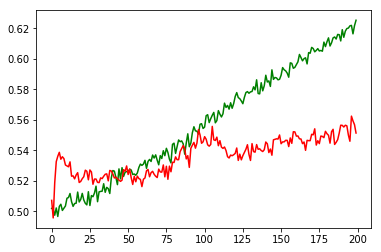

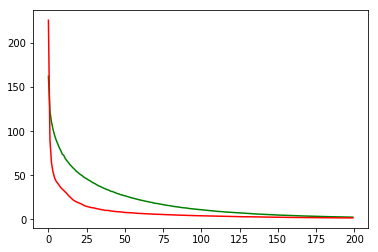

working on d,u and l,learn 0.5 64 0.01 0.005


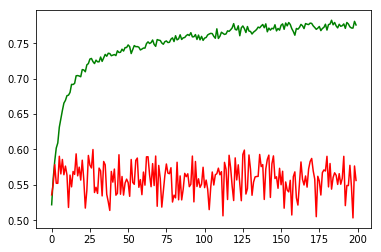

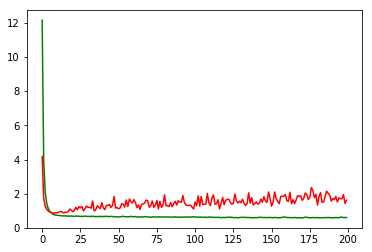

working on d,u and l,learn 0.5 64 0.01 0.001


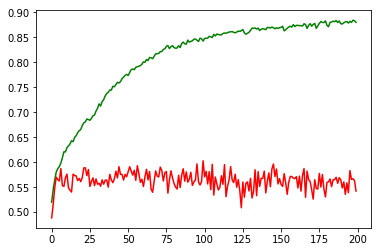

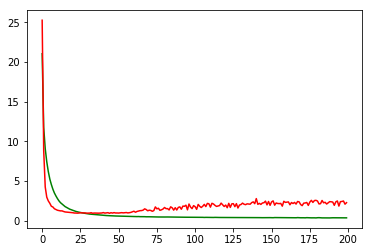

working on d,u and l,learn 0.5 64 0.01 0.0005


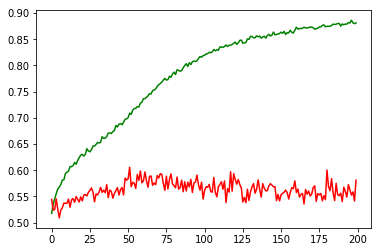

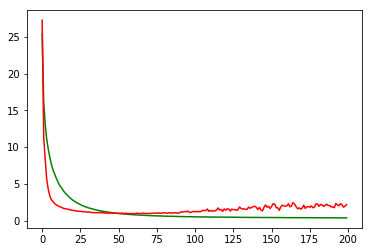

working on d,u and l,learn 0.5 64 0.01 0.0001


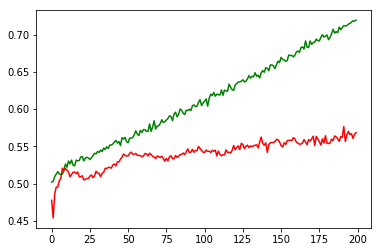

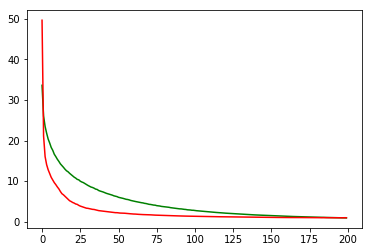

working on d,u and l,learn 0.5 128 0.05 0.005


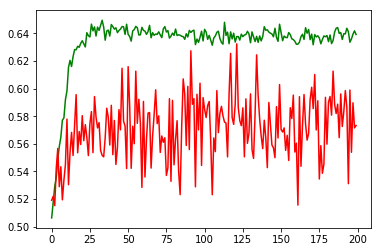

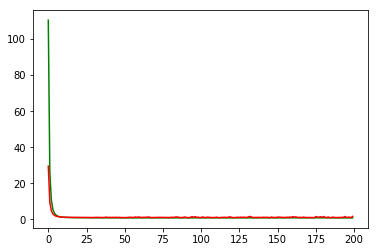

working on d,u and l,learn 0.5 128 0.05 0.001


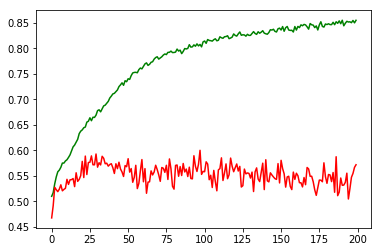

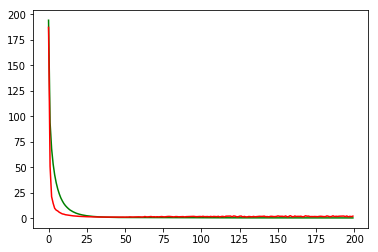

working on d,u and l,learn 0.5 128 0.05 0.0005


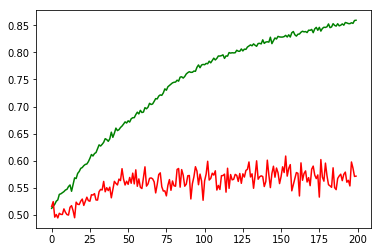

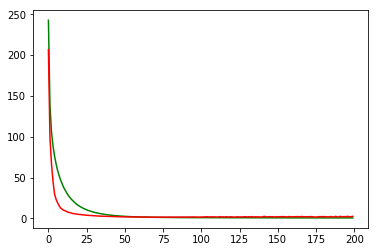

working on d,u and l,learn 0.5 128 0.05 0.0001


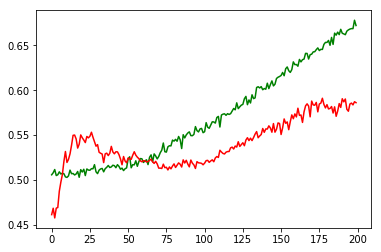

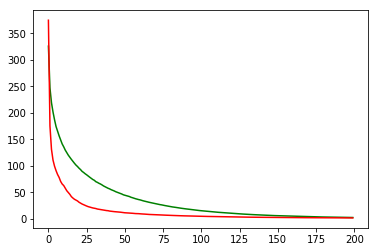

working on d,u and l,learn 0.5 128 0.01 0.005


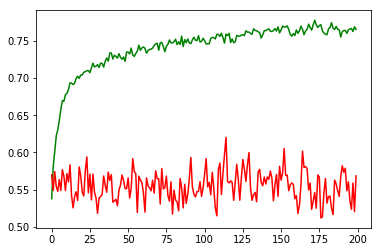

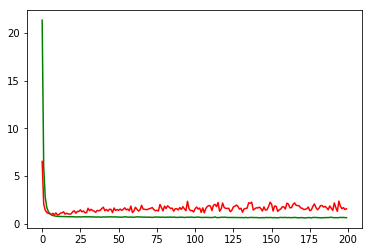

working on d,u and l,learn 0.5 128 0.01 0.001


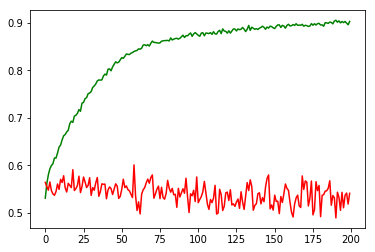

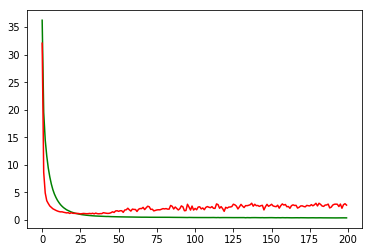

working on d,u and l,learn 0.5 128 0.01 0.0005


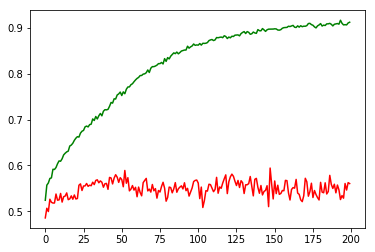

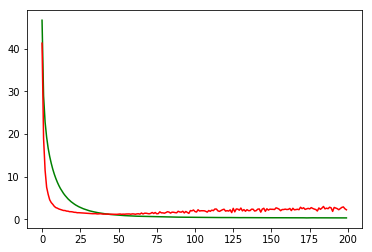

working on d,u and l,learn 0.5 128 0.01 0.0001


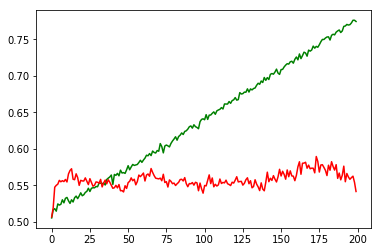

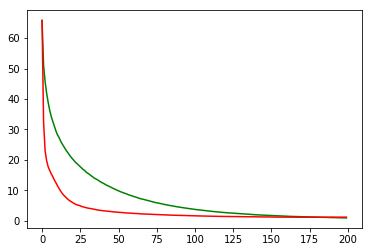

working on d,u and l,learn 0.25 64 0.05 0.005


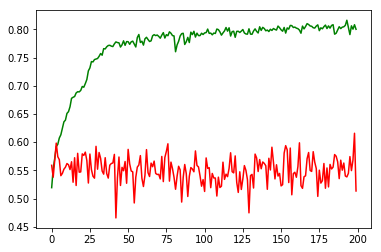

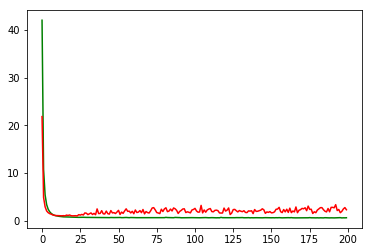

working on d,u and l,learn 0.25 64 0.05 0.001


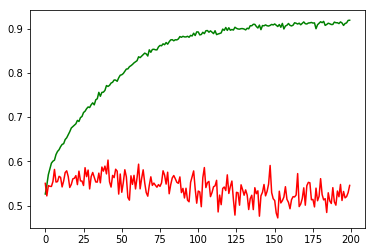

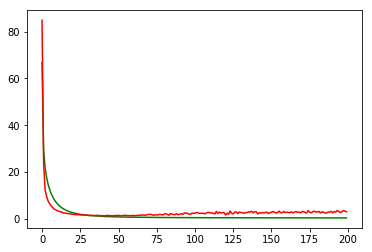

working on d,u and l,learn 0.25 64 0.05 0.0005


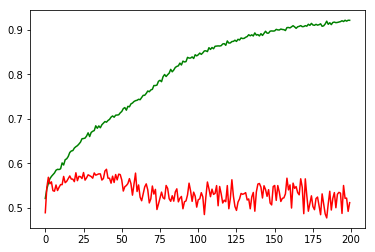

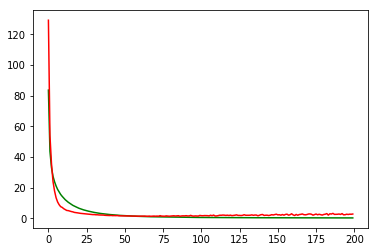

working on d,u and l,learn 0.25 64 0.05 0.0001


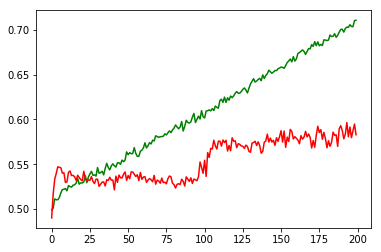

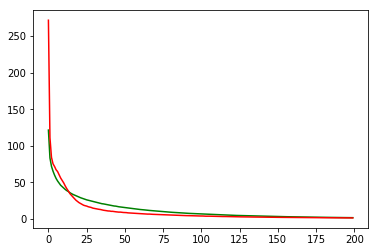

working on d,u and l,learn 0.25 64 0.01 0.005


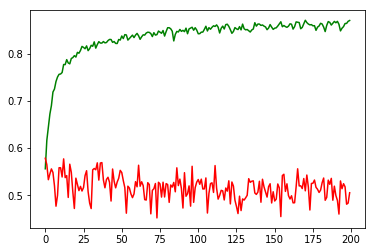

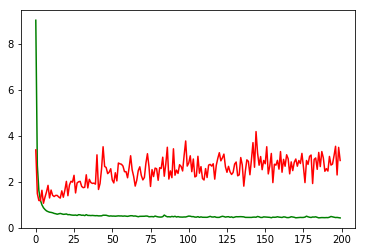

working on d,u and l,learn 0.25 64 0.01 0.001


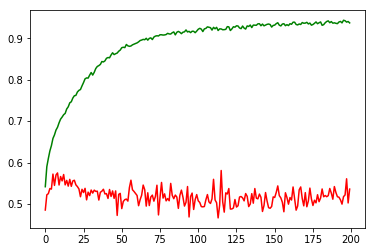

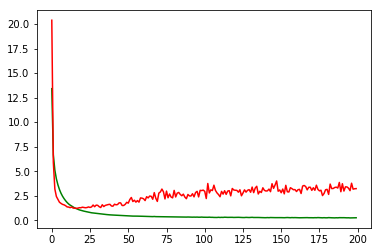

working on d,u and l,learn 0.25 64 0.01 0.0005


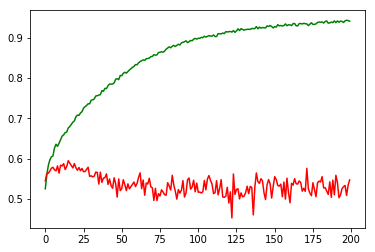

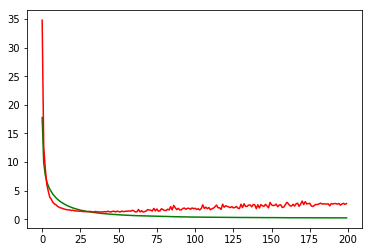

working on d,u and l,learn 0.25 64 0.01 0.0001


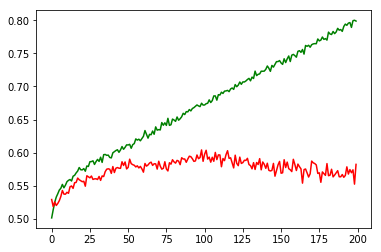

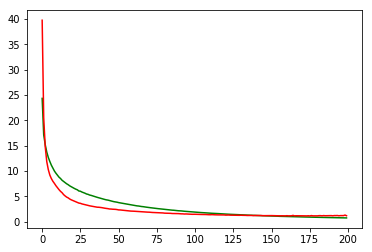

working on d,u and l,learn 0.25 128 0.05 0.005


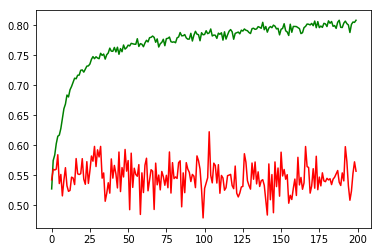

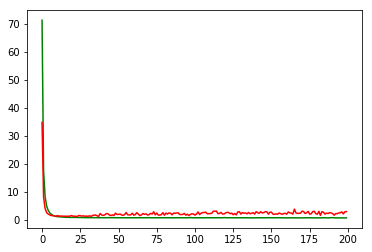

working on d,u and l,learn 0.25 128 0.05 0.001


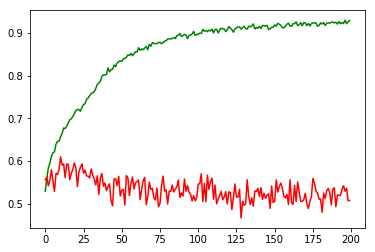

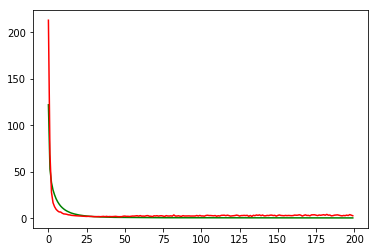

working on d,u and l,learn 0.25 128 0.05 0.0005


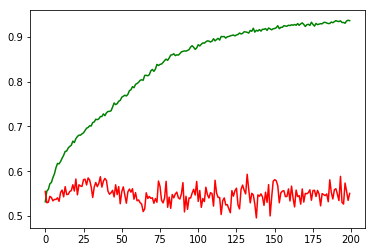

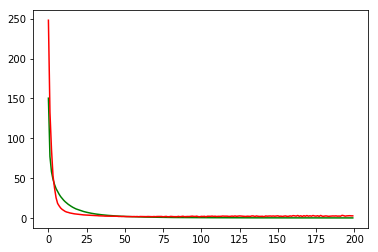

working on d,u and l,learn 0.25 128 0.05 0.0001


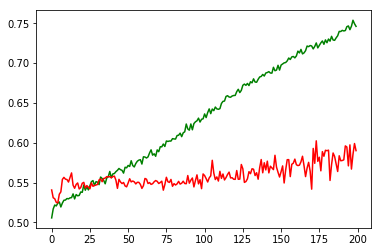

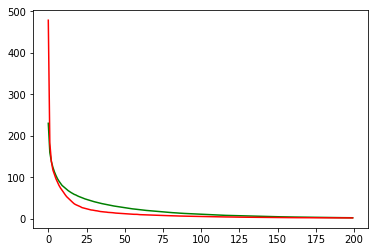

working on d,u and l,learn 0.25 128 0.01 0.005


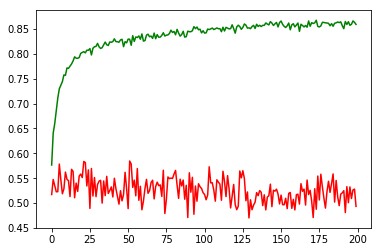

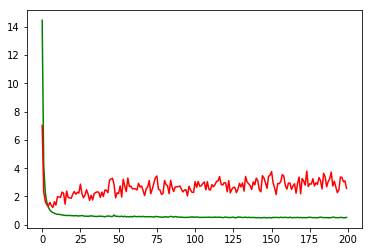

working on d,u and l,learn 0.25 128 0.01 0.001


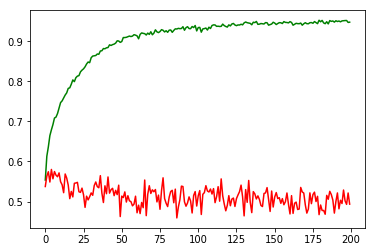

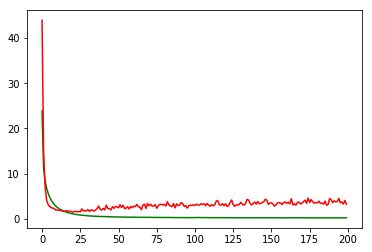

working on d,u and l,learn 0.25 128 0.01 0.0005


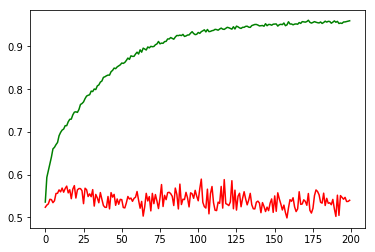

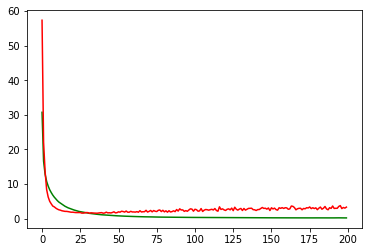

working on d,u and l,learn 0.25 128 0.01 0.0001


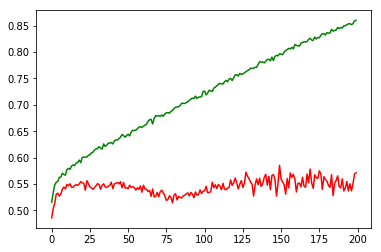

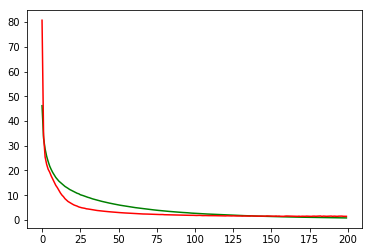

Chart for BEST MODEL FOR: NVDA


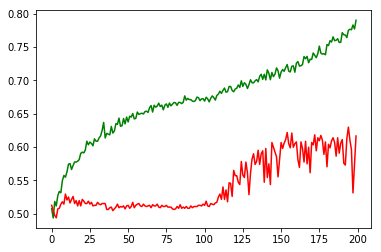

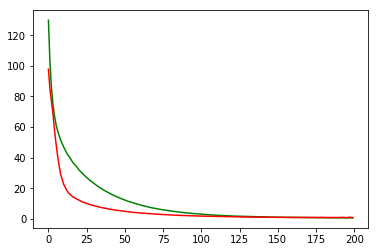

F1,score 0.6362869198312235
G-score: 0.6142025167243547
Accuracy 0.6165480403713485
Window: 140
[[316 239]
 [192 377]]
Vol pos 4.610550944886894
Vol neg 4.156199209805921
Real Percentage of gain: 151.50228997985522
Percentage of gain: 1.2489234389504138
Total gain: 1403.7899453802652
000000000000000000000000000000000000000000000000
Percentile:  0
ecco la somma Positiva: [0.70528036]
ecco la somma Negativa: [0.30183133]
[[130  98]
 [ 59  97]]
384/384 [==============================] - 0s 1ms/step
[0.8396657730142275, 0.5911458333333334]
Percentile:  1
ecco la somma Positiva: [0.72797716]
ecco la somma Negativa: [0.27184376]
[[ 84  34]
 [ 97 122]]
337/337 [==============================] - 0s 1ms/step
[0.7532006346507313, 0.6112759658066385]
Percentile:  2
ecco la somma Positiva: [0.752546]
ecco la somma Negativa: [0.28885987]
[[51 63]
 [20 84]]
218/218 [==============================] - 0s 1ms/step
[0.7332008891149399, 0.6192660561395348]
Percentile:  3
ecco la somma Positiva: [0.730716

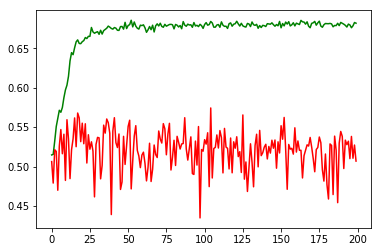

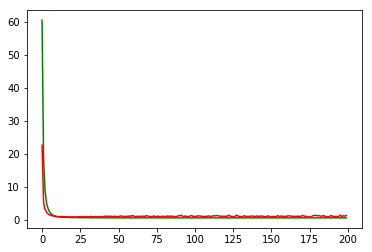

working on d,u and l,learn 0.5 64 0.05 0.001


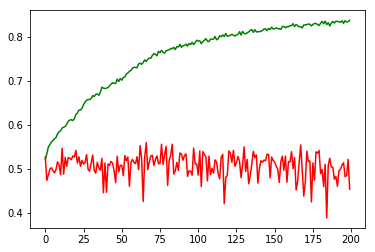

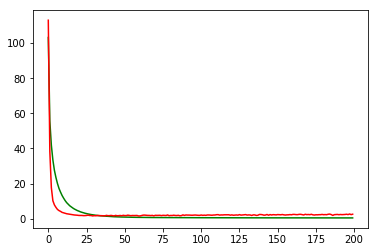

working on d,u and l,learn 0.5 64 0.05 0.0005


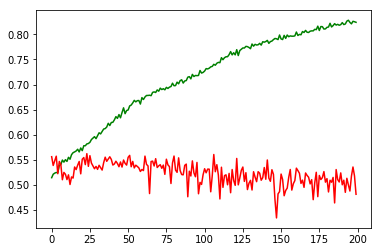

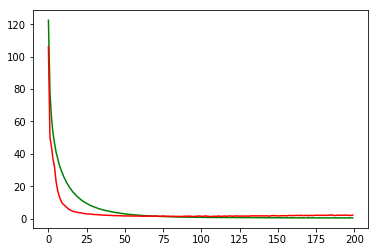

working on d,u and l,learn 0.5 64 0.05 0.0001


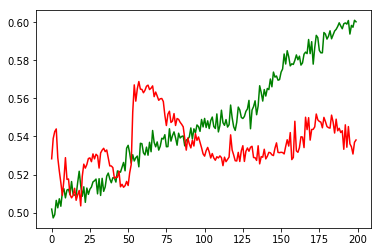

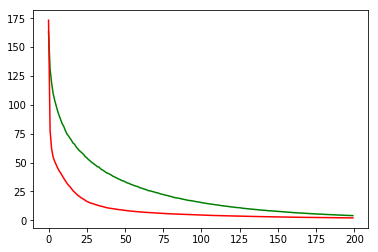

working on d,u and l,learn 0.5 64 0.01 0.005


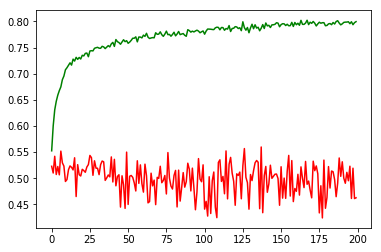

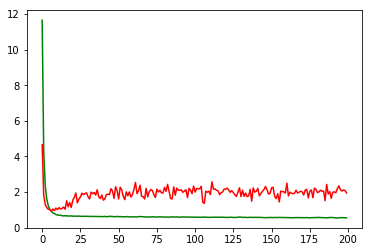

working on d,u and l,learn 0.5 64 0.01 0.001


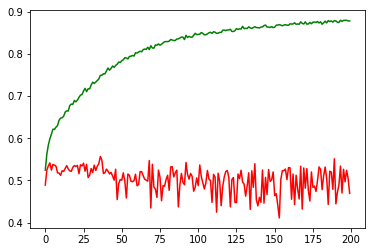

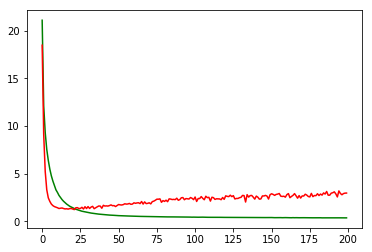

working on d,u and l,learn 0.5 64 0.01 0.0005


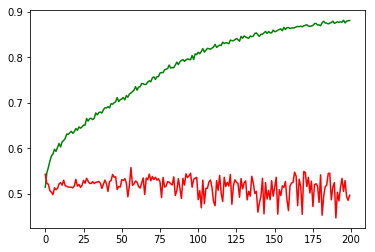

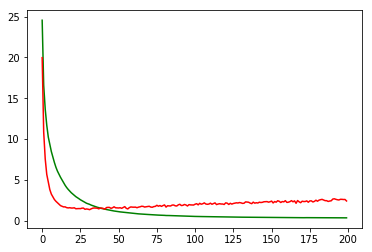

working on d,u and l,learn 0.5 64 0.01 0.0001


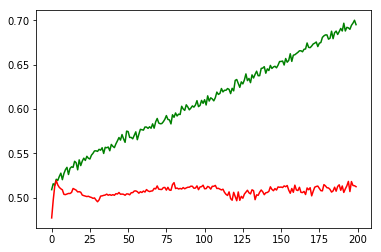

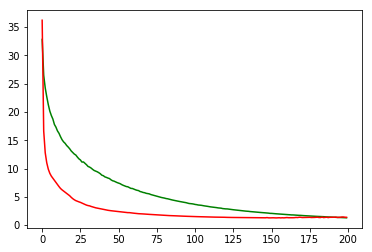

working on d,u and l,learn 0.5 128 0.05 0.005


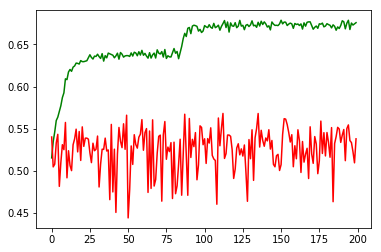

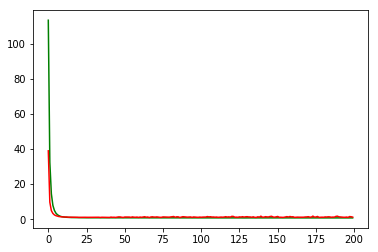

working on d,u and l,learn 0.5 128 0.05 0.001


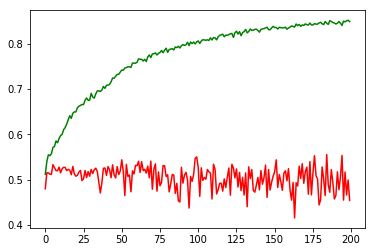

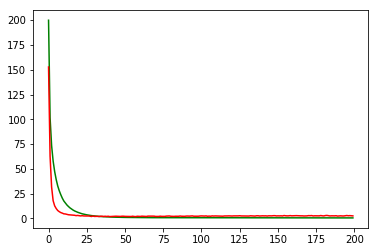

working on d,u and l,learn 0.5 128 0.05 0.0005


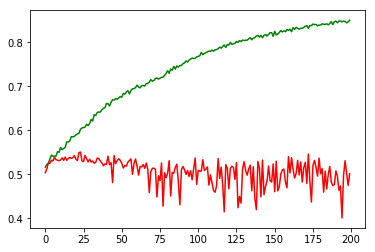

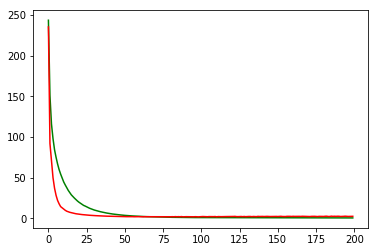

working on d,u and l,learn 0.5 128 0.05 0.0001


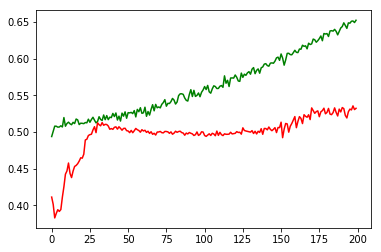

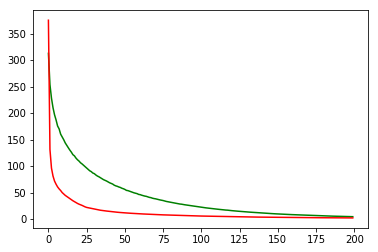

working on d,u and l,learn 0.5 128 0.01 0.005


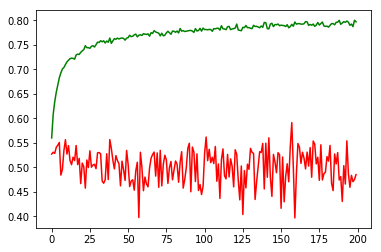

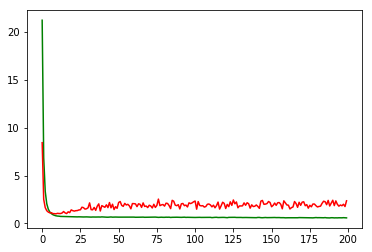

working on d,u and l,learn 0.5 128 0.01 0.001


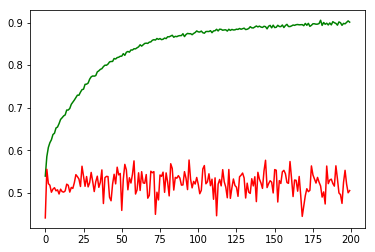

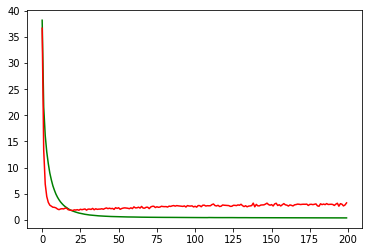

working on d,u and l,learn 0.5 128 0.01 0.0005


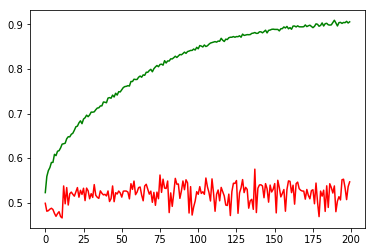

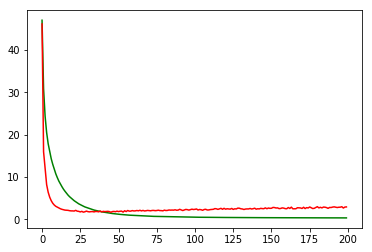

working on d,u and l,learn 0.5 128 0.01 0.0001


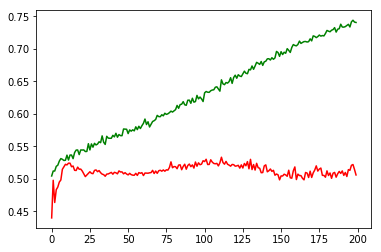

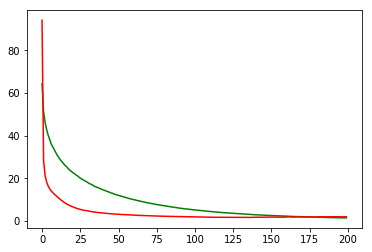

working on d,u and l,learn 0.25 64 0.05 0.005


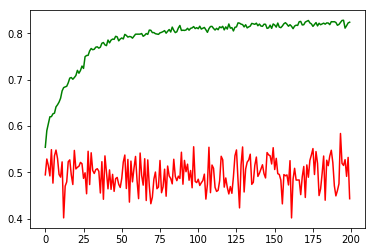

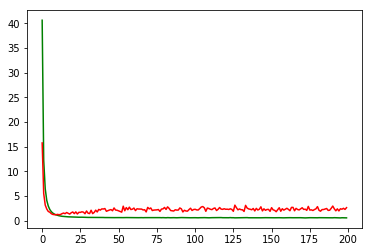

working on d,u and l,learn 0.25 64 0.05 0.001


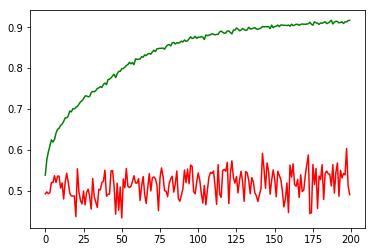

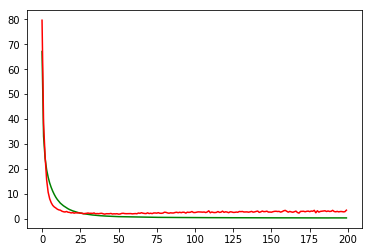

working on d,u and l,learn 0.25 64 0.05 0.0005


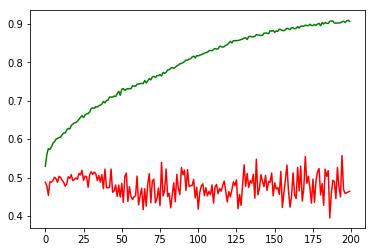

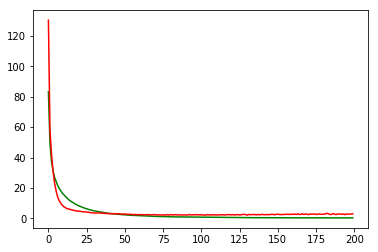

working on d,u and l,learn 0.25 64 0.05 0.0001


In [ ]:
import warnings
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import MinMaxScaler
warnings.filterwarnings('ignore')
o=0
accstocksresults=[]
f1stocksresults=[]
f1scoreresults=[]
aucresults=[]
chartlist=[]
gainlist=[]
pricegainlist=[]
countpos=np.zeros(5)
countneg=np.zeros(5)
percentilepos=np.zeros(5)
percentileneg=np.zeros(5)
for price in prices:
    #print('New price[[[[[[[[[[[[[[[[[[[[[[[[[[[[[[[]]]]]]]]]]]]]]]]]]]]]]]]]]]]]]]')
    
   
    print('Working on...',files[o])
    
    senttemp=sentiment[o]
    senttemp=np.nan_to_num(np.asarray(senttemp, dtype=float))
    
    xtemp=price
    o+=1
    xtemp=np.nan_to_num(np.asarray(xtemp, dtype=float))
    
    #print(xtemp)
    accintime=[]
    trendwindowtime=[140]
    f1total=[]
    acctotal=[]
    auctotal=[]
    percfinal=[]
    f1scoretotal=[]
    percpostotal=[]
    percnegtotal=[]
    for t in trendwindowtime:
        #1
    #label because of the maket and append values without data
    #simo theroy past trend
        
        x=[]
        y=[]
        percentage=[]
        
        yvolatility=[]
        yprice=[]
        #print('============================================================')
        #print('Working on window:',t)
        #print(len(xtemp))
        ##QUI C E L'UNICO APPUNTO GUARDA SE CON +1 CAMBIA
        
        for i in range(0,len(price)-t-1):
            s=np.sign(price.iloc[i+t+1]['close']-price.iloc[i+1]['open'])
            percentage.append((100*(price.iloc[i+t+1]['close']-price.iloc[i+1]['open']))/price.iloc[i+1]['open']) 
            if(s==-1):
                y.append(0)
            else:
                y.append(1)
            yvolatility.append((100*abs(price.iloc[i+t+1]['close']-price.iloc[i+1]['open']))/price.iloc[i+1]['open'])
            yprice.append(abs(price.iloc[i+t+1]['close']-price.iloc[i+1]['open']))
            x.append(np.concatenate((senttemp[i],xtemp[i])))
        
        y=np.array(y)
        x=np.array(x)
        scaler = MinMaxScaler() 
        scaler.fit(x)
        MinMaxScaler(copy=True, feature_range=(0, 1))
        x=scaler.transform(x)
        yvolatility=np.array(yvolatility)
       
        permindex=range(0,len(x))
        #permindex=np.random.permutation(permindex)
        train=0.8
        nt=math.ceil(len(x)*train)
        trainvalindex=permindex[0:nt]
        testindex=permindex[nt:]
        x_tv=[]
        y_tv=[]
        x_test=[]
        y_test=[]
        x_tv=x[trainvalindex]
        y_tv=y[trainvalindex]
        x_test=x[testindex]
        y_test=y[testindex]
        yvolatilitytest=yvolatility[testindex]
        #create structure for percentile valuation
        distribution=[]
        print(max(yvolatilitytest))
        print(min(yvolatilitytest))
        step=(max(yvolatilitytest)-min(yvolatilitytest))/5
        for v in range(0,5):
            pindexes=[]
            for r in range(0,len(y_test)):
                if(yvolatilitytest[r]<min(yvolatilitytest)+step+step*v and yvolatilitytest[r]>min(yvolatilitytest)+step*v):
                    pindexes.append(r)
            distribution.append(pindexes)
    

       
        lspace=[0.05,0.01]
        dropspace=[0.5,0.25]
        uspace=[64,128]
        learnspace=[0.005,0.001,0.0005,0.0001]
        bestsvm=None
        bestca=[]
        bestcl=[]
        maxacc=0
        cvacc=0
        maxu=0
        maxl=0
        maxd=0
        maxle=0
        #print('Model Selection...')
        #model selection
        cvacc=0
        totu=0
        for d in dropspace:
            for u in uspace:
               
                for l in lspace:
                     for le in learnspace:
                   
                        print('=========================================================')
                        print('working on d,u and l,learn',d,u,l,le)

                        cvacclist=[]
                        #faccio cross validation
                        #start with 40% as train and 10% for validation and then i move in percentege
                        # 0-40 40-50
                        # 0-50 50-60
                        # 0-60 60-70 
                        #etc test set is completely external i do in some way error extimation changin the ticker
                        trainpoint=math.floor(len(x_tv)*0.40)
                        dimval=math.floor(trainpoint*0.25)
                        endval=trainpoint+dimval
                        model=buildModel(l,u,d,le)
                        epoch=200
                        for i in range(0,6):
                            #print('-----')
                            x_train=x_tv[0:trainpoint]
                            y_train=y_tv[0:trainpoint]
                            x_val=x_tv[trainpoint:endval]
                            y_val=y_tv[trainpoint:endval]

                            trainpoint=trainpoint+dimval
                            endval=endval+dimval

                            x_train,y_train=smote(x_train,y_train)
                            if(sum(y_val)+6<len(x_val) and sum(y_val)>6):
                                x_val,y_val=smote(x_val,y_val)
                            else:
                                totu=totu+1

                            history=model.fit(x_train, y_train, epochs = 200,batch_size =128, verbose=0, validation_data=(x_val, y_val),
                                              shuffle=True)

                            prediction=model.predict(x_val, batch_size=128, verbose=0)
                            for el in range(0,len(prediction)):
                                if(prediction[el]>0.5):
                                    prediction[el]=1
                                else:
                                    prediction[el]=0



                            if(i==0):
                                meanhvl=np.asarray(history.history['val_loss'])
                                meanhva=np.asarray(history.history['val_acc'])
                                meanhl=np.asarray(history.history['loss'])
                                meanha=np.asarray(history.history['acc'])

                            else:
                                meanhvl=np.add(meanhvl,history.history['val_loss'])
                                meanhva=np.add(meanhva,history.history['val_acc'])
                                meanha=np.add(meanha,history.history['acc'])
                                meanhl=np.add(meanhl,history.history['loss'])
                            #i take the last one
                            #maxAcc=history.history['val_acc'][len(history.history['val_acc'])-1]
                            #USING G SCORE AS MODEL SELECTION METRIC
                            maxAcc=geometric_mean_score(y_val, prediction)
                            cvacclist.append(maxAcc)
                            reset_weights(model)

                        cvacc=sum(cvacclist)/len(cvacclist)
                        if(cvacc>maxacc):
                            maxacc=cvacc
                            maxu=u
                            maxl=l
                            maxle=le
                            maxd=d

                        meanhvl=meanhvl/6
                        meanhva=meanhva/6
                        meanhl=meanhl/6
                        meanha=meanha/6

                        plt.plot(meanha,'g')
                        plt.plot(meanhva,'r')
                        plt.show()
                        plt.plot(meanhl,'g')
                        plt.plot(meanhvl,'r')
                        plt.show()  

                    
                    
        model=buildModel(maxl,maxu,maxd,maxle)
        history=model.fit(x_tv, y_tv, epochs = 200,batch_size =128, verbose=0, validation_data=(x_test, y_test),
                                          shuffle=True)
        prediction=model.predict(x_test, batch_size=128, verbose=0)
        for el in range(0,len(prediction)):
            if(prediction[el]>0.5):
                prediction[el]=1
            else:
                prediction[el]=0
            
        
        
        print('=========================================================')
        print('=========================================================')
        print('=========================================================')
        print('=========================================================')
        print('Chart for BEST MODEL FOR:',files[o-1])
        plt.plot(history.history['acc'],'g')
        plt.plot(history.history['val_acc'],'r')
        plt.show()
        plt.plot(history.history['loss'],'g')
        plt.plot(history.history['val_loss'],'r')
        plt.show()
        acctotal.append(history.history['val_acc'][len(history.history['val_acc'])-1])
        confmatrix=confusion_matrix(y_test, prediction)
        
        volr=[]
        voln=[]
        pricegain=0
        for j in range(0,len(x_test)):
            if(y_test[j]==prediction[j]):
                volr.append(yvolatilitytest[j])
                pricegain=pricegain+yprice[j]
            else:
                voln.append(yvolatilitytest[j])
                pricegain=pricegain-yprice[j]
        
        CM = f1_score(y_test, prediction)
        fpr, tpr, thresholds = metrics.roc_curve(y_test, prediction)
        auc=metrics.auc(fpr, tpr)
        valueacc=geometric_mean_score(y_test, prediction)
        
        print('F1,score',CM)
        print('G-score:',valueacc)
        realacc=history.history['val_acc'][len(history.history['val_acc'])-1]
        accstocksresults.append(realacc)
        print('Accuracy',realacc)
        print('Window:',t)
        print(confmatrix)
        print('Vol pos',sum(volr)/len(volr))
        print('Vol neg',sum(voln)/len(voln))
        percnegtotal.append(sum(volr)/len(volr))
        percpostotal.append(sum(voln)/len(voln))
        #build structure to plot distribution onver percentile
        chart=np.zeros(5)
        for r in range(0,len(y_test)):
            for v in range(0,5):
                if(yvolatilitytest[r]<min(yvolatility)+step+step*v and yvolatilitytest[r]>min(yvolatility)+step*v):
                    chart[v]+=1
        #plt.plot(chart)
        #plt.show()
        print('Real Percentage of gain:',(pricegain*100)/(sum(price.iloc[1:6]['open'])))
        pricegainlist.append((pricegain*100)/(sum(price.iloc[1:6]['open'])))
        print('Percentage of gain:',(sum(volr)-sum(voln))/(len(volr)+len(voln)))
        print('Total gain:',len(y_test)*(sum(volr)-sum(voln))/(len(volr)+len(voln)))
        gainlist.append(len(y_test)*(sum(volr)-sum(voln))/(len(volr)+len(voln)))
        print('000000000000000000000000000000000000000000000000')
        #performances for each percentile
        chartscore=[]
        for g in range(0,len(distribution)):
            print('Percentile: ',g)
            tempscore=0
            cp=[]
        
            if(len(distribution[g])>0):
                predictionp=model.predict(x_test[distribution[g]])
                res=[]
                
                
                
                
                
                for pred in range(0,len(predictionp)):
                    res.append(predictionp[pred]+y_test[distribution[g]][pred])
               
                res=np.array(res)
                truenegative=np.argwhere(res<0.5 )
                truepositive=np.argwhere(res>=1.5 )
                if(len(truepositive[:,0])>0):
                   
                    
                    tpos=sum(predictionp[truepositive[:,0]])/len(truepositive[:,0])
                    print('ecco la somma Positiva:',tpos)
                    percentilepos[g]=+tpos
                    countpos[g]=+1
                if(len(truenegative[:,0])>0):
                    tneg=sum(predictionp[truenegative[:,0]])/len(truenegative[:,0])
                   
                    
                    print('ecco la somma Negativa:',tneg)
                    percentileneg[g]=+tneg
                    countneg[g]=+1
                
                for el in range(0,len(predictionp)):
                    if(predictionp[el]>0.5):
                        predictionp[el]=1
                        
                    else:
                        predictionp[el]=0 
                print(confusion_matrix(y_test[distribution[g]], predictionp))
                print(model.evaluate(x_test[distribution[g]],y_test[distribution[g]]))
                tempscore=model.evaluate(x_test[distribution[g]],y_test[distribution[g]], verbose=0)
            chartscore.append(tempscore[1])    
        chartlist.append(chartscore)
        print('000000000000000000000000000000000000000000000000')
print('Mean acc over portfolio:',sum(accstocksresults)/len(accstocksresults))
print('Mean gain over portfolio : ', sum(gainlist)/len(gainlist))
print('Real mean gain over portfolio',sum(pricegainlist)/len(pricegainlist))
for percentile in range(0,5):
    print('Percentile :',percentile)
    print(sum(percentilepos[percentile])/countpos[percentile])
    print(sum(percentileneg[percentile])/countneg[percentile])
#print all the accuracy varing the percentile
for st in range(0,len(chartlist)):
    plt.plot(chartlist[st])
plt.show()
        

            

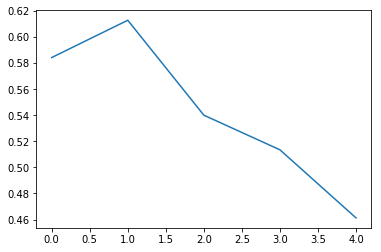

In [5]:
tot=np.zeros(5)
for st in range(0,len(chartlist)):
    tot=chartlist[st]+tot
    
tot=tot/len(chartlist)
plt.plot(tot)
plt.show()

In [ ]:
arr=[2,4,5,6,7,2,4,3,2,2]
arr=np.array(arr)
print(np.argwhere(arr==6))

In [ ]:
print(np.argwhere(res==1))

In [ ]:
print(res)

In [ ]:
print(len(res))

In [ ]:
print(len(res[len(res)-1]))

In [ ]:
print(truepositive[:,0])